# Clasificación de Experimentos — Diseño Compuesto Central (CCD)

Diseño con **3 factores**: t extracción (x₁), t desorción (x₂), t incubación (x₃)  
**Total: 17 experimentos** = 8 factoriales + 6 axiales + 3 centrales

---

## Puntos Factoriales (2³ = 8 experimentos)
Experimentos con valores codificados **±1**:

| Exp | x₁ | x₂ | x₃ |
|-----|-----|-----|-----|
| 1  | -1  | -1  | -1  |
| 2  | -1  | -1  | +0.82 |
| 3  | -1  | +1  | -1  |
| 4  | -1  | +1  | +0.82 |
| 5  | +1  | -1  | -1  |
| 6  | +1  | -1  | +0.82 |
| 7  | +1  | +1  | -1  |
| 8  | +1  | +1  | +0.82 |

> x₃ tiene valor ±0.82 en vez de ±1 por restricción del diseño, pero siguen siendo puntos factoriales.

---

## Puntos Axiales / Estrella (6 experimentos)
Experimentos donde **solo un factor varía** a un valor extremo (±α) y los demás están a 0:

| Exp | x₁ | x₂ | x₃ | Factor extremo |
|-----|-----|-----|-----|----------------|
| 9  | -1.65 | 0 | 0 | x₁ extremo bajo |
| 10 | +1.65 | 0 | 0 | x₁ extremo alto |
| 11 | 0 | -1.70 | 0 | x₂ extremo bajo |
| 12 | 0 | +1.70 | 0 | x₂ extremo alto |
| 13 | 0 | 0 | -1.60 | x₃ extremo bajo |
| 17 | 0 | 0 | +1.58 | x₃ extremo alto |

---

## Puntos Centrales (3 experimentos)
Experimentos con todos los factores a **0** (réplicas del centro):

| Exp | x₁ | x₂ | x₃ |
|-----|-----|-----|-----|
| 14 | 0 | 0 | 0 |
| 15 | 0 | 0 | 0 |
| 16 | 0 | 0 | 0 |

---

## Variables naturales

| Variable codificada | Variable natural | Nivel bajo (−1) | Centro (0) | Nivel alto (+1) |
|---|---|---|---|---|
| x₁ | t extracción (min) | 30 | 75 | 120 |
| x₂ | t desorción (min) | 1 | 2 | 3 |
| x₃ | t incubación (min) | 5 | 10.5 | ~15 |

# Verificación de Normalidad — Variables de Respuesta Y₁ a Y₉

In [5]:
# ============================================================
# LIBRERÍAS
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy import stats
from scipy.stats import shapiro, norm
import warnings
warnings.filterwarnings("ignore")

# ============================================================
# 1. CARGA DE DATOS
# ============================================================
FILE = r"Variables_y.xlsx"
SHEET = "Hoja1"

# Los datos Y están en las primeras 18 filas (fila 0 = cabecera, filas 1-17 = experimentos)
df_raw = pd.read_excel(FILE, sheet_name=SHEET, header=0, nrows=17, usecols=range(10))

# Renombrar columnas con nombres estandarizados
df_raw.columns = [
    "Experimento",
    "Y1_MetabDiana", "Y2_MetabTotales",
    "Y3_RSD_Todos",  "Y4_RSD_Diana",
    "Y5_Indol",      "Y6_Cresol",
    "Y7_Metional",   "Y8_AcCarboxilicos",
    "Y9_DianasTotales"
]

# Ordenar por número de experimento y resetear índice
df = df_raw.sort_values("Experimento").reset_index(drop=True)

# Nombres descriptivos para los ejes de los gráficos
Y_LABELS = {
    "Y1_MetabDiana":     "Y₁: Nº Metabolitos Diana",
    "Y2_MetabTotales":   "Y₂: Nº Metabolitos Totales",
    "Y3_RSD_Todos":      "Y₃: %RSD Todos",
    "Y4_RSD_Diana":      "Y₄: %RSD Diana",
    "Y5_Indol":          "Y₅: Indol/Todos",
    "Y6_Cresol":         "Y₆: Cresol/Todos",
    "Y7_Metional":       "Y₇: Metional/Todos",
    "Y8_AcCarboxilicos": "Y₈: Ac.Carboxílicos/Todos",
    "Y9_DianasTotales":  "Y₉: Dianas/Totales",
}

Y_COLS = list(Y_LABELS.keys())

print(f"Datos cargados: {df.shape[0]} experimentos × {len(Y_COLS)} variables de respuesta")
df[Y_COLS].describe().round(4)

Datos cargados: 17 experimentos × 9 variables de respuesta


,Y1_MetabDiana,Y2_MetabTotales,Y3_RSD_Todos,Y4_RSD_Diana,Y5_Indol,Y6_Cresol,Y7_Metional,Y8_AcCarboxilicos,Y9_DianasTotales
count,17.0000,17.0000,1.700000e+01,1.700000e+01,17.0000,17.0000,17.0000,17.0000,17.0000
mean,15.1176,105.2941,4.268429e+14,2.540061e+14,0.0362,0.0097,0.0097,0.0876,0.1432
std,2.0274,11.8362,1.790514e+14,2.387969e+13,0.0023,0.0017,0.0017,0.0077,0.0069
min,8.0000,62.0000,4.397037e+13,2.231738e+14,0.0300,0.0090,0.0090,0.0645,0.1290
25%,15.0000,107.0000,4.332949e+14,2.477321e+14,0.0360,0.0090,0.0090,0.0901,0.1441
50%,16.0000,109.0000,4.549714e+14,2.492529e+14,0.0360,0.0092,0.0092,0.0901,0.1441
75%,16.0000,111.0000,4.653544e+14,2.529729e+14,0.0370,0.0093,0.0093,0.0909,0.1471
max,16.0000,111.0000,8.767693e+14,3.411688e+14,0.0404,0.0161,0.0161,0.0935,0.1515


In [6]:
# ============================================================
# 2. FUNCIÓN DE TEST DE NORMALIDAD + TRANSFORMACIONES
# ============================================================

def test_normalidad(serie, nombre, alpha=0.05):
    """
    Aplica Shapiro-Wilk a una serie. Si no es normal, prueba
    transformación LOG y luego SQRT. Devuelve un dict con resultados.
    """
    resultado = {
        "Variable": nombre,
        "p_original": None,
        "Normal_original": None,
        "Transformacion": "Ninguna",
        "datos_finales": serie.copy(),
        "p_final": None,
        "Normal_final": None,
    }

    # --- Test original ---
    stat, p = shapiro(serie)
    resultado["p_original"] = round(p, 4)
    resultado["Normal_original"] = "NORMAL ✓" if p > alpha else "NO NORMAL ✗"

    if p > alpha:
        resultado["p_final"] = round(p, 4)
        resultado["Normal_final"] = "NORMAL ✓"
        return resultado

    # --- Transformación LOG ---
    if (serie > 0).all():
        serie_log = np.log(serie)
        stat_log, p_log = shapiro(serie_log)
        if p_log > alpha:
            resultado["Transformacion"] = "LOG(Y)"
            resultado["datos_finales"] = serie_log
            resultado["p_final"] = round(p_log, 4)
            resultado["Normal_final"] = "NORMAL ✓"
            return resultado
    else:
        p_log = 0  # No aplicable si hay ceros/negativos

    # --- Transformación SQRT ---
    if (serie >= 0).all():
        serie_sqrt = np.sqrt(serie)
        stat_sqrt, p_sqrt = shapiro(serie_sqrt)
        if p_sqrt > alpha:
            resultado["Transformacion"] = "SQRT(Y)"
            resultado["datos_finales"] = serie_sqrt
            resultado["p_final"] = round(p_sqrt, 4)
            resultado["Normal_final"] = "NORMAL ✓"
            return resultado
    else:
        p_sqrt = 0

    # --- Ninguna transformación logró normalidad ---
    mejor_p = max(p_log, p_sqrt) if (serie >= 0).all() else p_log
    if mejor_p == p_log and (serie > 0).all():
        resultado["Transformacion"] = "LOG(Y) [mejor intento]"
        resultado["datos_finales"] = np.log(serie)
        resultado["p_final"] = round(p_log, 4)
    elif (serie >= 0).all():
        resultado["Transformacion"] = "SQRT(Y) [mejor intento]"
        resultado["datos_finales"] = np.sqrt(serie)
        resultado["p_final"] = round(p_sqrt, 4)

    resultado["Normal_final"] = "NO NORMAL ✗"
    return resultado

# ============================================================
# 3. EJECUTAR TEST PARA TODAS LAS VARIABLES
# ============================================================

resultados = []
for col in Y_COLS:
    res = test_normalidad(df[col], col)
    resultados.append(res)
    estado = f"[{res['Normal_original']}]"
    transf = f"→ {res['Transformacion']} [{res['Normal_final']}]" if res["Transformacion"] != "Ninguna" else ""
    print(f"  {Y_LABELS[col]:<35} p={res['p_original']:.4f}  {estado}  {transf}")

  Y₁: Nº Metabolitos Diana            p=0.0000  [NO NORMAL ✗]  → SQRT(Y) [mejor intento] [NO NORMAL ✗]
  Y₂: Nº Metabolitos Totales          p=0.0000  [NO NORMAL ✗]  → SQRT(Y) [mejor intento] [NO NORMAL ✗]
  Y₃: %RSD Todos                      p=0.0002  [NO NORMAL ✗]  → SQRT(Y) [mejor intento] [NO NORMAL ✗]
  Y₄: %RSD Diana                      p=0.0000  [NO NORMAL ✗]  → LOG(Y) [mejor intento] [NO NORMAL ✗]
  Y₅: Indol/Todos                     p=0.0034  [NO NORMAL ✗]  → SQRT(Y) [mejor intento] [NO NORMAL ✗]
  Y₆: Cresol/Todos                    p=0.0000  [NO NORMAL ✗]  → LOG(Y) [mejor intento] [NO NORMAL ✗]
  Y₇: Metional/Todos                  p=0.0000  [NO NORMAL ✗]  → LOG(Y) [mejor intento] [NO NORMAL ✗]
  Y₈: Ac.Carboxílicos/Todos           p=0.0000  [NO NORMAL ✗]  → SQRT(Y) [mejor intento] [NO NORMAL ✗]
  Y₉: Dianas/Totales                  p=0.0005  [NO NORMAL ✗]  → SQRT(Y) [mejor intento] [NO NORMAL ✗]


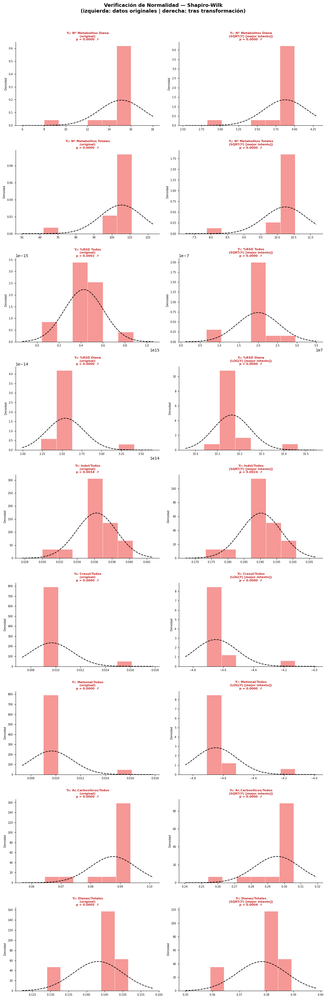

Gráficos guardados: normalidad_histogramas.png / .pdf


In [7]:
# ============================================================
# 4. GRÁFICOS — GRID 9 HISTOGRAMAS (original vs transformado)
# ============================================================

def plot_histograma(ax, datos, titulo, p_valor, es_normal, color):
    """Dibuja histograma con curva normal superpuesta."""
    ax.hist(datos, bins=6, density=True, color=color, alpha=0.6, edgecolor="white", linewidth=0.8)

    # Curva normal superpuesta
    mu, sigma = datos.mean(), datos.std()
    x = np.linspace(datos.min() - sigma, datos.max() + sigma, 200)
    ax.plot(x, norm.pdf(x, mu, sigma), color="black", linewidth=1.5, linestyle="--")

    # Estilo del título según normalidad
    color_titulo = "#2e7d32" if es_normal else "#c62828"
    marca = "✓" if es_normal else "✗"
    ax.set_title(f"{titulo}\np = {p_valor:.4f}  {marca}", fontsize=8,
                 color=color_titulo, fontweight="bold", pad=4)
    ax.tick_params(labelsize=7)
    ax.set_ylabel("Densidad", fontsize=7)
    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)


fig, axes = plt.subplots(9, 2, figsize=(12, 36))
fig.suptitle("Verificación de Normalidad — Shapiro-Wilk\n(izquierda: datos originales | derecha: tras transformación)",
             fontsize=13, fontweight="bold", y=1.01)

COLOR_NORMAL  = "#42a5f5"
COLOR_NOORMAL = "#ef5350"
COLOR_TRANSF  = "#66bb6a"

for i, res in enumerate(resultados):
    col   = res["Variable"]
    label = Y_LABELS[col]
    datos_orig = df[col]
    datos_fin  = res["datos_finales"]

    es_norm_orig = res["Normal_original"].startswith("NORMAL")
    es_norm_fin  = res["Normal_final"].startswith("NORMAL")

    # Columna izquierda: original
    c_orig = COLOR_NORMAL if es_norm_orig else COLOR_NOORMAL
    plot_histograma(axes[i, 0], datos_orig, f"{label}\n(original)",
                    res["p_original"], es_norm_orig, c_orig)

    # Columna derecha: transformado (o repetición si ya era normal)
    transf_label = res["Transformacion"] if res["Transformacion"] != "Ninguna" else "Sin transformación"
    c_fin = COLOR_NORMAL if es_norm_fin else COLOR_NOORMAL
    if res["Transformacion"] != "Ninguna":
        c_fin = COLOR_TRANSF if es_norm_fin else COLOR_NOORMAL
    plot_histograma(axes[i, 1], datos_fin, f"{label}\n({transf_label})",
                    res["p_final"], es_norm_fin, c_fin)

plt.tight_layout()
plt.savefig("Graficos/normalidad_histogramas.png", dpi=150, bbox_inches="tight")
plt.savefig("Graficos/normalidad_histogramas.pdf", bbox_inches="tight")
plt.show()
print("Gráficos guardados: normalidad_histogramas.png / .pdf")

In [8]:
# ============================================================
# 5. TABLA RESUMEN + EXPORTACIÓN A EXCEL
# ============================================================

# Construir tabla resumen
tabla = pd.DataFrame([{
    "Variable":             Y_LABELS[r["Variable"]],
    "p-valor original":     r["p_original"],
    "Normal original":      r["Normal_original"],
    "Transformación":       r["Transformacion"],
    "p-valor final":        r["p_final"],
    "Normal final":         r["Normal_final"],
} for r in resultados])

print("=" * 85)
print("RESUMEN DE NORMALIDAD — TEST SHAPIRO-WILK (α = 0.05)")
print("=" * 85)
print(tabla.to_string(index=False))
print("=" * 85)

# ---- Exportar tabla a Excel con formato de color ----
with pd.ExcelWriter("resumen_normalidad.xlsx", engine="openpyxl") as writer:
    tabla.to_excel(writer, sheet_name="Normalidad", index=False)
    ws = writer.sheets["Normalidad"]

    from openpyxl.styles import PatternFill, Font, Alignment
    verde  = PatternFill("solid", fgColor="C8E6C9")
    rojo   = PatternFill("solid", fgColor="FFCDD2")
    negrita = Font(bold=True)

    # Cabecera en negrita
    for cell in ws[1]:
        cell.font = negrita
        cell.alignment = Alignment(horizontal="center")

    # Colorear filas según resultado final
    for row in ws.iter_rows(min_row=2, max_row=ws.max_row):
        estado = row[5].value  # columna "Normal final"
        fill = verde if estado and estado.startswith("NORMAL") else rojo
        for cell in row:
            cell.fill = fill
            cell.alignment = Alignment(horizontal="center")

    # Ajustar ancho de columnas
    for col in ws.columns:
        max_len = max(len(str(c.value)) if c.value else 0 for c in col)
        ws.column_dimensions[col[0].column_letter].width = min(max_len + 4, 40)

print("\nTabla exportada: resumen_normalidad.xlsx")

RESUMEN DE NORMALIDAD — TEST SHAPIRO-WILK (α = 0.05)
                  Variable  p-valor original Normal original          Transformación  p-valor final Normal final
  Y₁: Nº Metabolitos Diana            0.0000     NO NORMAL ✗ SQRT(Y) [mejor intento]         0.0000  NO NORMAL ✗
Y₂: Nº Metabolitos Totales            0.0000     NO NORMAL ✗ SQRT(Y) [mejor intento]         0.0000  NO NORMAL ✗
            Y₃: %RSD Todos            0.0002     NO NORMAL ✗ SQRT(Y) [mejor intento]         0.0000  NO NORMAL ✗
            Y₄: %RSD Diana            0.0000     NO NORMAL ✗  LOG(Y) [mejor intento]         0.0000  NO NORMAL ✗
           Y₅: Indol/Todos            0.0034     NO NORMAL ✗ SQRT(Y) [mejor intento]         0.0024  NO NORMAL ✗
          Y₆: Cresol/Todos            0.0000     NO NORMAL ✗  LOG(Y) [mejor intento]         0.0000  NO NORMAL ✗
        Y₇: Metional/Todos            0.0000     NO NORMAL ✗  LOG(Y) [mejor intento]         0.0000  NO NORMAL ✗
 Y₈: Ac.Carboxílicos/Todos            0.000

In [9]:
# ============================================================
# 6. DATASET TRANSFORMADO + CONCLUSIÓN FINAL
# ============================================================

# Construir dataset con los datos finales (transformados donde aplique)
df_transformado = df[["Experimento"]].copy()
for res in resultados:
    col       = res["Variable"]
    transf    = res["Transformacion"]
    col_nueva = col if transf == "Ninguna" else f"{col}_{transf.split('(')[0].strip()}"
    df_transformado[col_nueva] = res["datos_finales"].values

df_transformado.to_excel("datos_transformados.xlsx", index=False)
print("Dataset transformado exportado: datos_transformados.xlsx\n")

# ---- Conclusión ----
necesitan_transf = [r for r in resultados if r["Transformacion"] != "Ninguna"]
ya_normales      = [r for r in resultados if r["Transformacion"] == "Ninguna"]
siguen_sin_norm  = [r for r in resultados if r["Normal_final"] and r["Normal_final"].startswith("NO")]

print("─" * 60)
print("CONCLUSIÓN")
print("─" * 60)
print(f"  Variables normales sin transformación ({len(ya_normales)}):")
for r in ya_normales:
    print(f"    • {Y_LABELS[r['Variable']]}  (p = {r['p_original']})")

print(f"\n  Variables que requieren transformación ({len(necesitan_transf)}):")
for r in necesitan_transf:
    print(f"    • {Y_LABELS[r['Variable']]}  → {r['Transformacion']}  (p_final = {r['p_final']})  {r['Normal_final']}")

if siguen_sin_norm:
    print(f"\n  ⚠ Variables que NO alcanzan normalidad tras transformación ({len(siguen_sin_norm)}):")
    for r in siguen_sin_norm:
        print(f"    • {Y_LABELS[r['Variable']]}")
print("─" * 60)

Dataset transformado exportado: datos_transformados.xlsx

────────────────────────────────────────────────────────────
CONCLUSIÓN
────────────────────────────────────────────────────────────
  Variables normales sin transformación (0):

  Variables que requieren transformación (9):
    • Y₁: Nº Metabolitos Diana  → SQRT(Y) [mejor intento]  (p_final = 0.0)  NO NORMAL ✗
    • Y₂: Nº Metabolitos Totales  → SQRT(Y) [mejor intento]  (p_final = 0.0)  NO NORMAL ✗
    • Y₃: %RSD Todos  → SQRT(Y) [mejor intento]  (p_final = 0.0)  NO NORMAL ✗
    • Y₄: %RSD Diana  → LOG(Y) [mejor intento]  (p_final = 0.0)  NO NORMAL ✗
    • Y₅: Indol/Todos  → SQRT(Y) [mejor intento]  (p_final = 0.0024)  NO NORMAL ✗
    • Y₆: Cresol/Todos  → LOG(Y) [mejor intento]  (p_final = 0.0)  NO NORMAL ✗
    • Y₇: Metional/Todos  → LOG(Y) [mejor intento]  (p_final = 0.0)  NO NORMAL ✗
    • Y₈: Ac.Carboxílicos/Todos  → SQRT(Y) [mejor intento]  (p_final = 0.0)  NO NORMAL ✗
    • Y₉: Dianas/Totales  → SQRT(Y) [mejor intento]  

# Gráficos de Efectos Principales (Main Effects Plots)

In [10]:
# ============================================================
# 1. CARGAR MATRIZ DE DISEÑO (factores codificados x₁, x₂, x₃)
# ============================================================
# El bloque de diseño empieza en fila 20 (cabecera) + filas 21-37 (datos)
# Los valores x₁, x₂, x₃ están almacenados como strings en el Excel

df_design_raw = pd.read_excel(FILE, sheet_name=SHEET, header=0, skiprows=20, nrows=17)

# Columnas por índice: 0=Experimento, 6=x₁, 7=x₂, 8=x₃
df_design = df_design_raw.iloc[:, [0, 6, 7, 8]].copy()
df_design.columns = ["Experimento", "x1", "x2", "x3"]

# Convertir strings a float (los valores vienen como '-1.00', '1.00', etc.)
df_design["x1"] = pd.to_numeric(df_design["x1"], errors="coerce")
df_design["x2"] = pd.to_numeric(df_design["x2"], errors="coerce")
df_design["x3"] = pd.to_numeric(df_design["x3"], errors="coerce")
df_design["Experimento"] = df_design["Experimento"].astype(int)

print("Matriz de diseño cargada correctamente:")
print(df_design.to_string(index=False))

Matriz de diseño cargada correctamente:
 Experimento    x1   x2    x3
           1 -1.00 -1.0 -1.00
           2 -1.00 -1.0  0.82
           3 -1.00  1.0 -1.00
           4 -1.00  1.0  0.82
           5  1.00 -1.0 -1.00
           6  1.00 -1.0  0.82
           7  1.00  1.0 -1.00
           8  1.00  1.0  0.82
           9 -1.65  0.0  0.00
          10  1.00  0.0  0.00
          11  0.00 -1.7  0.00
          12  0.00  1.7  0.00
          13  0.00  0.0 -1.60
          14  0.00  0.0  0.00
          15  0.00  0.0  0.00
          16  0.00  0.0  0.00
          17  0.00  0.0  1.58


In [11]:
# ============================================================
# 2. CONSTRUIR DATAFRAME UNIFICADO  (Y + factores codificados)
# ============================================================
df_full = df.merge(df_design, on="Experimento")

print(f"Dataset completo: {df_full.shape[0]} filas × {df_full.shape[1]} columnas")
print("\nValores codificados (x1, x2, x3) por experimento:")
print(df_full[["Experimento","x1","x2","x3"]].to_string(index=False))

Dataset completo: 17 filas × 13 columnas

Valores codificados (x1, x2, x3) por experimento:
 Experimento    x1   x2    x3
           1 -1.00 -1.0 -1.00
           2 -1.00 -1.0  0.82
           3 -1.00  1.0 -1.00
           4 -1.00  1.0  0.82
           5  1.00 -1.0 -1.00
           6  1.00 -1.0  0.82
           7  1.00  1.0 -1.00
           8  1.00  1.0  0.82
           9 -1.65  0.0  0.00
          10  1.00  0.0  0.00
          11  0.00 -1.7  0.00
          12  0.00  1.7  0.00
          13  0.00  0.0 -1.60
          14  0.00  0.0  0.00
          15  0.00  0.0  0.00
          16  0.00  0.0  0.00
          17  0.00  0.0  1.58


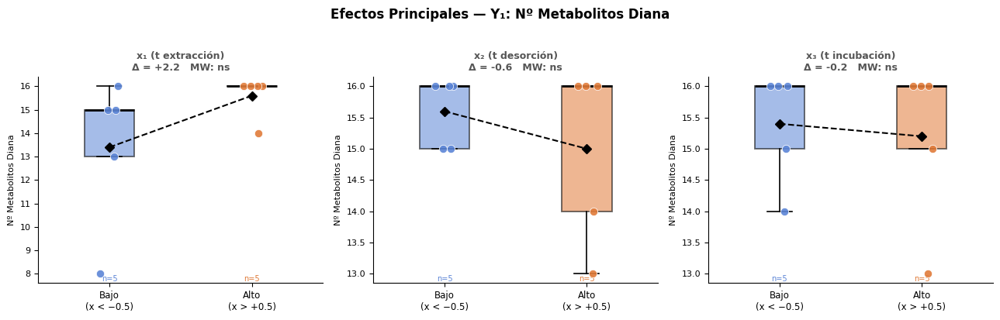

  Guardado: Graficos/efectos_Y1_MetabDiana.png


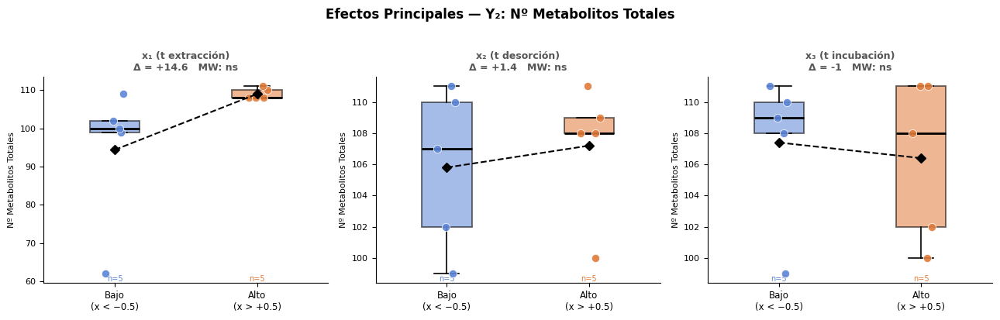

  Guardado: Graficos/efectos_Y2_MetabTotales.png


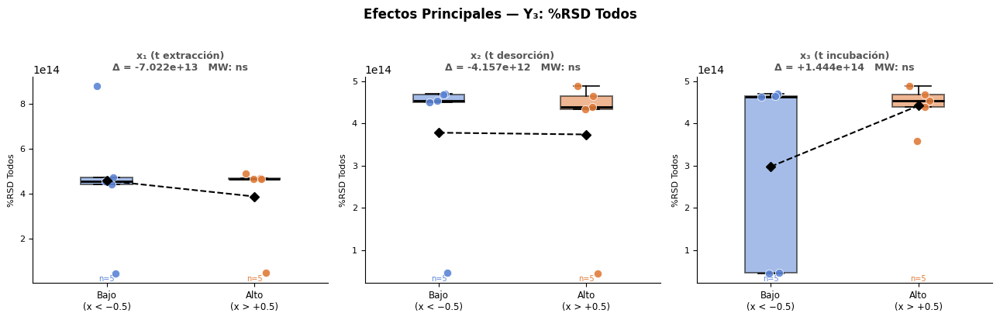

  Guardado: Graficos/efectos_Y3_RSD_Todos.png


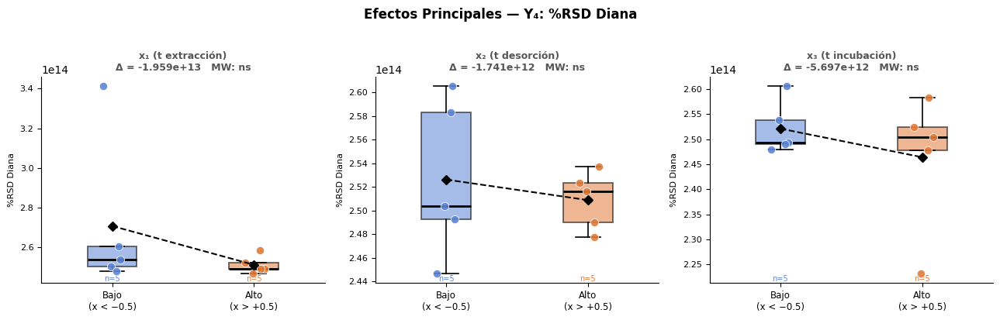

  Guardado: Graficos/efectos_Y4_RSD_Diana.png


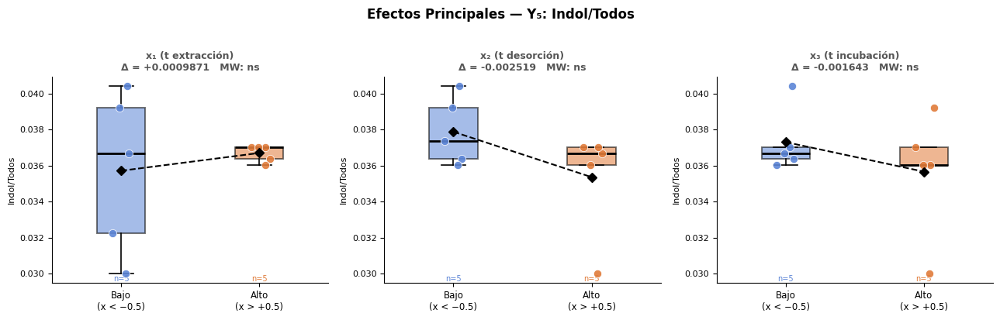

  Guardado: Graficos/efectos_Y5_Indol.png


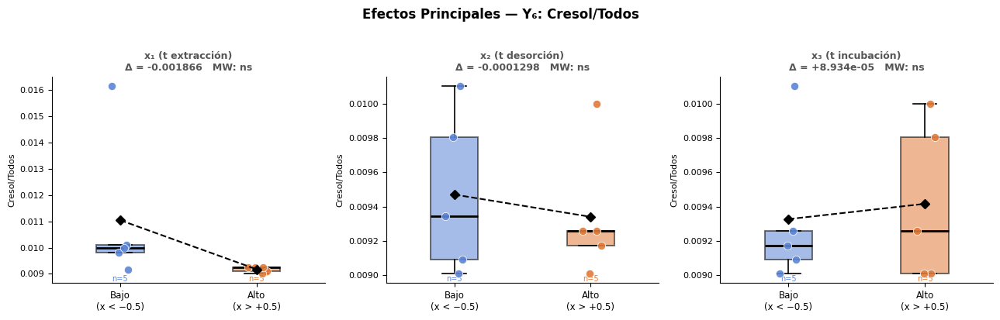

  Guardado: Graficos/efectos_Y6_Cresol.png


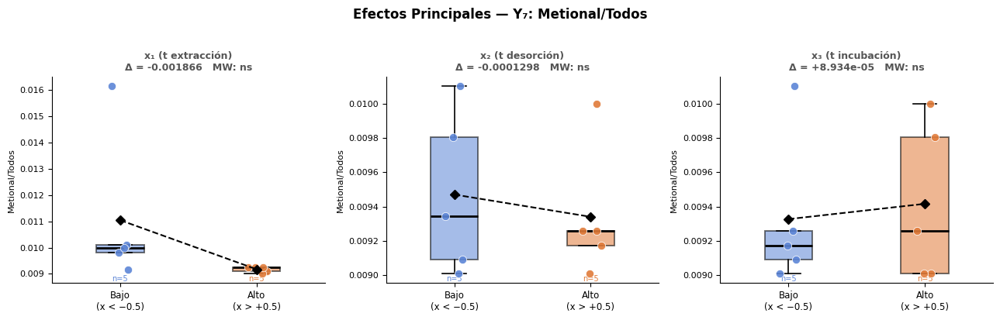

  Guardado: Graficos/efectos_Y7_Metional.png


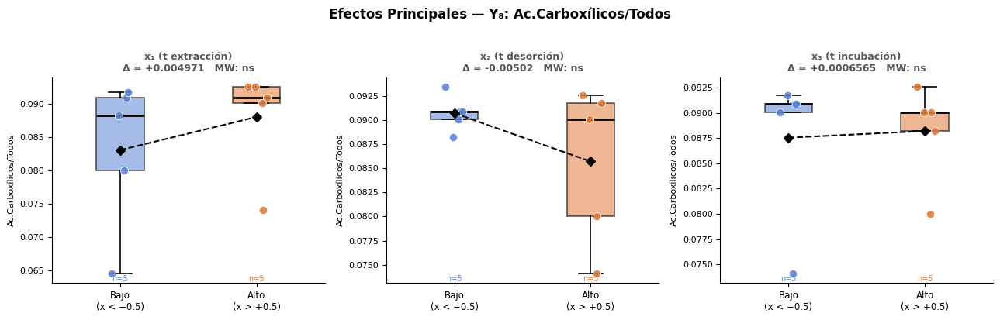

  Guardado: Graficos/efectos_Y8_AcCarboxilicos.png


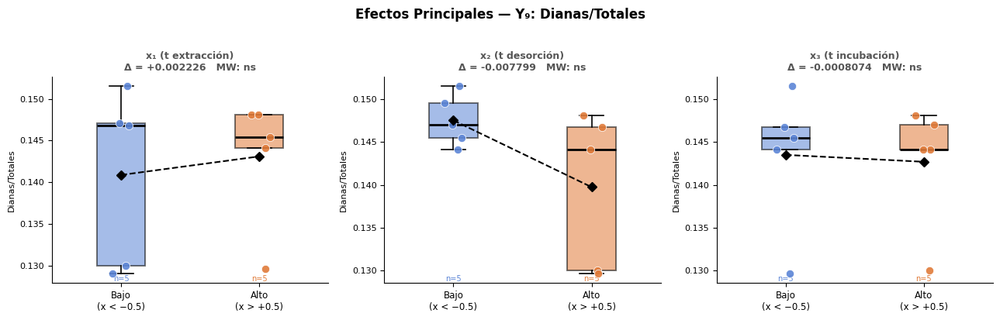

  Guardado: Graficos/efectos_Y9_DianasTotales.png

Todas las figuras generadas.


In [12]:
# ============================================================
# 3. GRÁFICOS DE EFECTOS PRINCIPALES — 9 figuras (una por Y)
#    Cada figura: 3 boxplots (x1, x2, x3) con puntos sobreimpresos
# ============================================================
from scipy.stats import ttest_ind, mannwhitneyu

FACTORES = {
    "x1": "x₁ (t extracción)",
    "x2": "x₂ (t desorción)",
    "x3": "x₃ (t incubación)",
}

# Umbral para clasificar nivel bajo / alto
THRESH = 0.5

# Paleta: nivel bajo → azul, nivel alto → naranja
C_LOW  = "#5c85d6"
C_HIGH = "#e07b39"

# ── Colores boxplot ──────────────────────────────────────────
BP_PROPS = dict(
    boxprops    = dict(linewidth=1.4),
    medianprops = dict(color="black", linewidth=2),
    whiskerprops= dict(linewidth=1.2),
    capprops    = dict(linewidth=1.2),
    flierprops  = dict(marker="", linestyle="none"),   # ocultamos outliers del boxplot (los pintamos aparte)
)

registros_tabla = []   # para la tabla resumen

for col in Y_COLS:
    label = Y_LABELS[col]
    fig, axes = plt.subplots(1, 3, figsize=(13, 4), sharey=False)
    fig.suptitle(f"Efectos Principales — {label}", fontsize=12, fontweight="bold", y=1.02)

    for ax, (fx, fx_label) in zip(axes, FACTORES.items()):
        # ── Separar niveles ─────────────────────────────────
        bajo = df_full.loc[df_full[fx] < -THRESH, col].dropna()
        alto = df_full.loc[df_full[fx] >  THRESH, col].dropna()

        # ── Test estadístico ─────────────────────────────────
        # Usamos Mann-Whitney (no asume normalidad) + t-test como referencia
        if len(bajo) >= 2 and len(alto) >= 2:
            _, p_mw = mannwhitneyu(bajo, alto, alternative="two-sided")
            _, p_tt = ttest_ind(bajo, alto, equal_var=False)
        else:
            p_mw = p_tt = np.nan

        delta   = alto.mean() - bajo.mean()
        sig_mw  = "*" if p_mw < 0.05 else "ns"
        sig_tt  = "*" if p_tt < 0.05 else "ns"

        registros_tabla.append({
            "Variable":       label,
            "Factor":         fx_label,
            "Media bajo":     round(bajo.mean(), 4),
            "Media alto":     round(alto.mean(), 4),
            "Δ (alto−bajo)":  round(delta, 4),
            "p-valor t-test": round(p_tt, 4) if not np.isnan(p_tt) else "—",
            "p-valor MW":     round(p_mw, 4) if not np.isnan(p_mw) else "—",
            "Sig. MW (α=0.05)": sig_mw,
        })

        # ── Boxplot ──────────────────────────────────────────
        bp = ax.boxplot(
            [bajo.values, alto.values],
            positions=[0, 1],
            widths=0.35,
            patch_artist=True,
            **BP_PROPS,
        )
        for patch, color in zip(bp["boxes"], [C_LOW, C_HIGH]):
            patch.set_facecolor(color)
            patch.set_alpha(0.55)

        # ── Puntos individuales (jitter) ─────────────────────
        rng = np.random.default_rng(42)
        for pos, datos, color in [(0, bajo, C_LOW), (1, alto, C_HIGH)]:
            jitter = rng.uniform(-0.08, 0.08, size=len(datos))
            ax.scatter(pos + jitter, datos, color=color, s=55,
                       zorder=5, edgecolors="white", linewidths=0.6, alpha=0.9)

        # ── Línea de medias ──────────────────────────────────
        ax.plot([0, 1], [bajo.mean(), alto.mean()],
                color="black", linewidth=1.5, linestyle="--",
                marker="D", markersize=6, markerfacecolor="black", zorder=6)

        # ── Δ y significancia en el título ───────────────────
        signo = "+" if delta >= 0 else ""
        color_titulo = "#c62828" if abs(delta) > 0 and sig_mw == "*" else "#555555"
        ax.set_title(
            f"{fx_label}\nΔ = {signo}{delta:.4g}   MW: {sig_mw}",
            fontsize=9, color=color_titulo, fontweight="bold"
        )

        # ── Estilo ejes ──────────────────────────────────────
        ax.set_xticks([0, 1])
        ax.set_xticklabels(["Bajo\n(x < −0.5)", "Alto\n(x > +0.5)"], fontsize=8.5)
        ax.set_ylabel(label.split(":")[1].strip() if ":" in label else label, fontsize=8)
        ax.tick_params(axis="y", labelsize=8)
        for spine in ["top", "right"]:
            ax.spines[spine].set_visible(False)

        # Anotar n por grupo
        ax.annotate(f"n={len(bajo)}", xy=(0, ax.get_ylim()[0]), fontsize=7,
                    ha="center", color=C_LOW, va="bottom")
        ax.annotate(f"n={len(alto)}", xy=(1, ax.get_ylim()[0]), fontsize=7,
                    ha="center", color=C_HIGH, va="bottom")

    plt.tight_layout()
    nombre_fig = f"Graficos/efectos_{col}.png"
    plt.savefig(nombre_fig, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"  Guardado: {nombre_fig}")

print("\nTodas las figuras generadas.")

In [13]:
# ============================================================
# 4. TABLA RESUMEN + FACTOR DE MAYOR IMPACTO + EXPORTACIÓN
# ============================================================
df_tabla = pd.DataFrame(registros_tabla)

# Identificar el factor con mayor |Δ| para cada variable
df_tabla["abs_delta"] = df_tabla["Δ (alto−bajo)"].abs()
mayor_impacto = (
    df_tabla.groupby("Variable")["abs_delta"]
    .idxmax()
    .map(lambda idx: df_tabla.loc[idx, "Factor"])
)
df_tabla["Mayor impacto"] = df_tabla["Variable"].map(mayor_impacto)
df_tabla.drop(columns="abs_delta", inplace=True)

# Columna de interpretación
def interpretar(row):
    delta = row["Δ (alto−bajo)"]
    sig   = row["Sig. MW (α=0.05)"]
    if sig == "*":
        dire = "↑ sube" if delta > 0 else "↓ baja"
        return f"Efecto significativo ({dire})"
    else:
        return "Sin efecto significativo"

df_tabla["Interpretación"] = df_tabla.apply(interpretar, axis=1)

# ── Imprimir resumen ─────────────────────────────────────────
print("=" * 100)
print("RESUMEN DE EFECTOS PRINCIPALES — Mann-Whitney U  (α = 0.05)")
print("=" * 100)
cols_print = ["Variable","Factor","Media bajo","Media alto","Δ (alto−bajo)","p-valor MW","Sig. MW (α=0.05)","Interpretación"]
print(df_tabla[cols_print].to_string(index=False))
print("=" * 100)

# ── Exportar a Excel con formato ─────────────────────────────
with pd.ExcelWriter("resumen_efectos_principales.xlsx", engine="openpyxl") as writer:
    df_tabla.to_excel(writer, sheet_name="Efectos", index=False)
    ws = writer.sheets["Efectos"]

    from openpyxl.styles import PatternFill, Font, Alignment, Border, Side
    verde    = PatternFill("solid", fgColor="C8E6C9")
    amarillo = PatternFill("solid", fgColor="FFF9C4")
    gris     = PatternFill("solid", fgColor="F5F5F5")
    bold     = Font(bold=True)
    center   = Alignment(horizontal="center", vertical="center", wrap_text=True)

    # Cabecera
    for cell in ws[1]:
        cell.font = bold
        cell.alignment = center
        cell.fill = PatternFill("solid", fgColor="B0BEC5")

    # Filas de datos
    for row in ws.iter_rows(min_row=2, max_row=ws.max_row):
        sig = row[7].value   # columna "Sig. MW"
        fill = verde if sig == "*" else amarillo
        for cell in row:
            cell.fill = fill
            cell.alignment = center

    # Ancho de columnas
    for col in ws.columns:
        max_len = max((len(str(c.value)) if c.value else 0) for c in col)
        ws.column_dimensions[col[0].column_letter].width = min(max_len + 3, 35)

    ws.row_dimensions[1].height = 30

print("\nTabla exportada: resumen_efectos_principales.xlsx")

# ── Resumen ejecutivo por variable ───────────────────────────
print("\n" + "─" * 70)
print("FACTOR DE MAYOR IMPACTO POR VARIABLE")
print("─" * 70)
for var in df_tabla["Variable"].unique():
    sub = df_tabla[df_tabla["Variable"] == var]
    top = sub.loc[sub["Δ (alto−bajo)"].abs().idxmax()]
    sigs = sub[sub["Sig. MW (α=0.05)"] == "*"]["Factor"].tolist()
    sig_str = ", ".join(sigs) if sigs else "ninguno significativo"
    print(f"  {var:<35}  Mayor Δ → {top['Factor']}  (Δ={top['Δ (alto−bajo)']:+.4g})   Sig: {sig_str}")
print("─" * 70)

RESUMEN DE EFECTOS PRINCIPALES — Mann-Whitney U  (α = 0.05)
                  Variable            Factor   Media bajo   Media alto  Δ (alto−bajo)  p-valor MW Sig. MW (α=0.05)           Interpretación
  Y₁: Nº Metabolitos Diana x₁ (t extracción) 1.340000e+01 1.560000e+01   2.200000e+00      0.1175               ns Sin efecto significativo
  Y₁: Nº Metabolitos Diana  x₂ (t desorción) 1.560000e+01 1.500000e+01  -6.000000e-01      0.7231               ns Sin efecto significativo
  Y₁: Nº Metabolitos Diana x₃ (t incubación) 1.540000e+01 1.520000e+01  -2.000000e-01      1.0000               ns Sin efecto significativo
Y₂: Nº Metabolitos Totales x₁ (t extracción) 9.440000e+01 1.090000e+02   1.460000e+01      0.0570               ns Sin efecto significativo
Y₂: Nº Metabolitos Totales  x₂ (t desorción) 1.058000e+02 1.072000e+02   1.400000e+00      0.7526               ns Sin efecto significativo
Y₂: Nº Metabolitos Totales x₃ (t incubación) 1.074000e+02 1.064000e+02  -1.000000e+00      1.0000   

# Gráficos de Interacción (Interaction Plots)

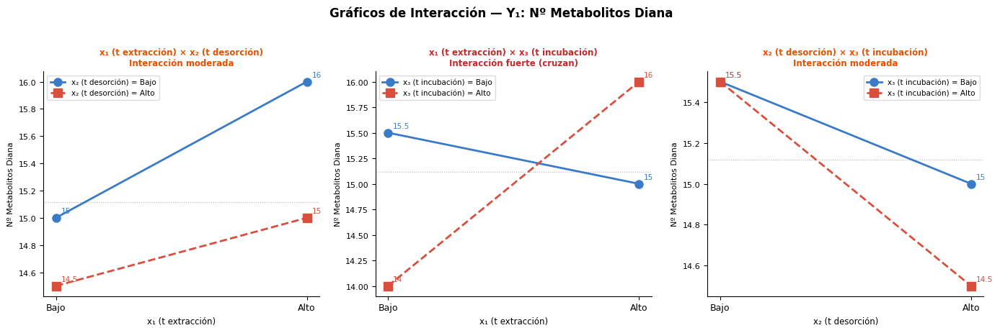

  Guardado: Graficos/interaccion_Y1_MetabDiana.png


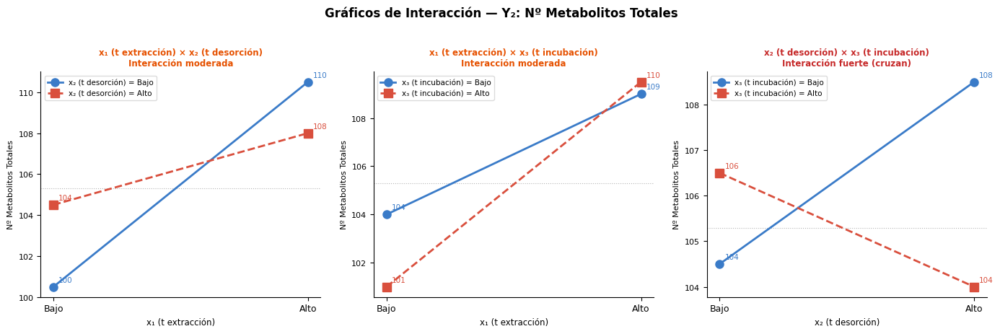

  Guardado: Graficos/interaccion_Y2_MetabTotales.png


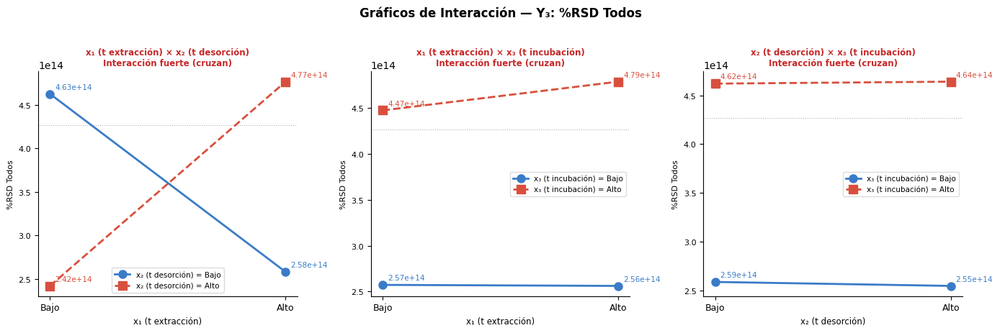

  Guardado: Graficos/interaccion_Y3_RSD_Todos.png


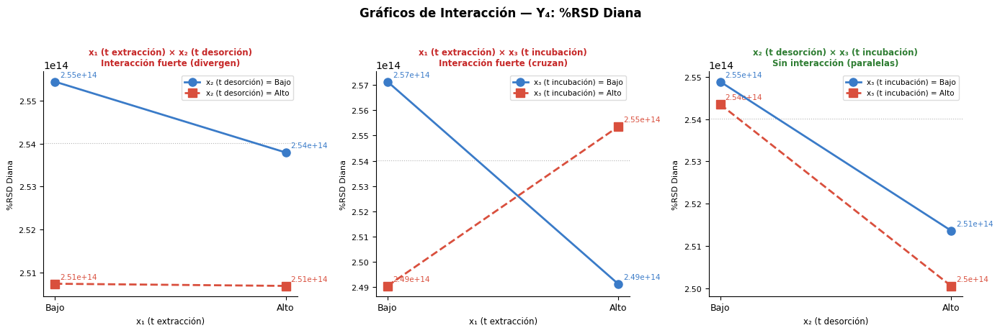

  Guardado: Graficos/interaccion_Y4_RSD_Diana.png


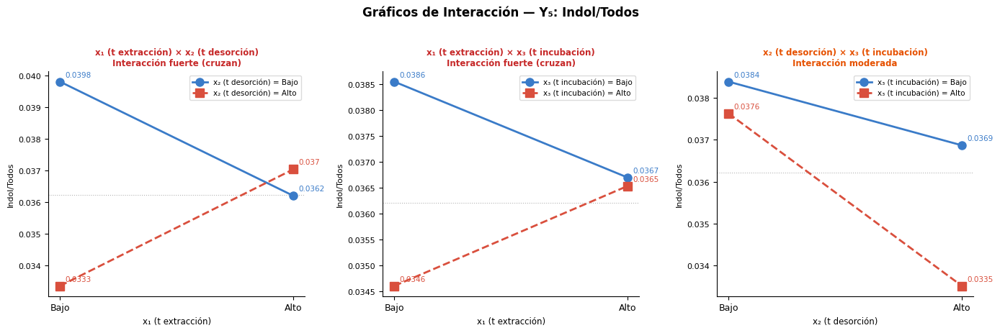

  Guardado: Graficos/interaccion_Y5_Indol.png


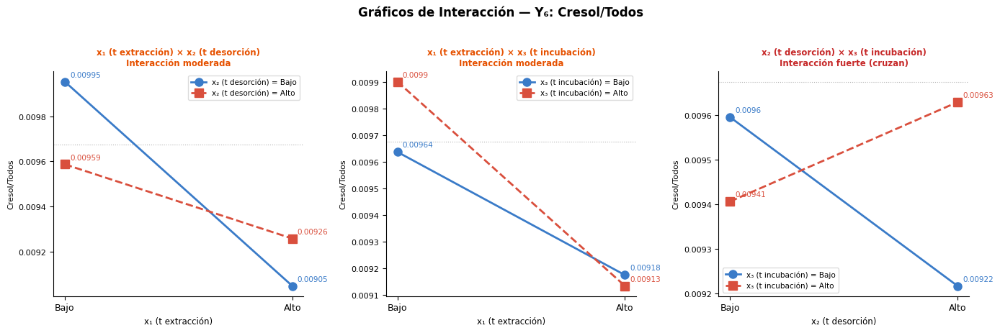

  Guardado: Graficos/interaccion_Y6_Cresol.png


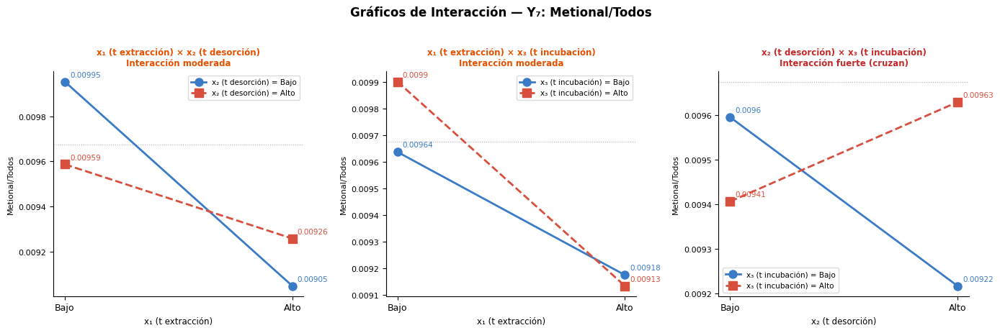

  Guardado: Graficos/interaccion_Y7_Metional.png


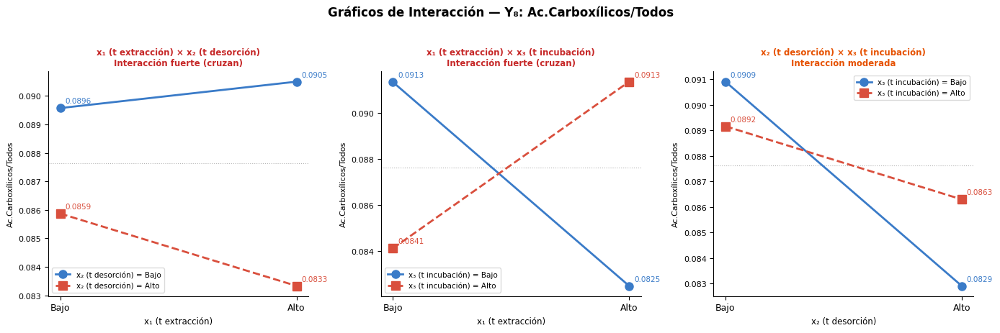

  Guardado: Graficos/interaccion_Y8_AcCarboxilicos.png


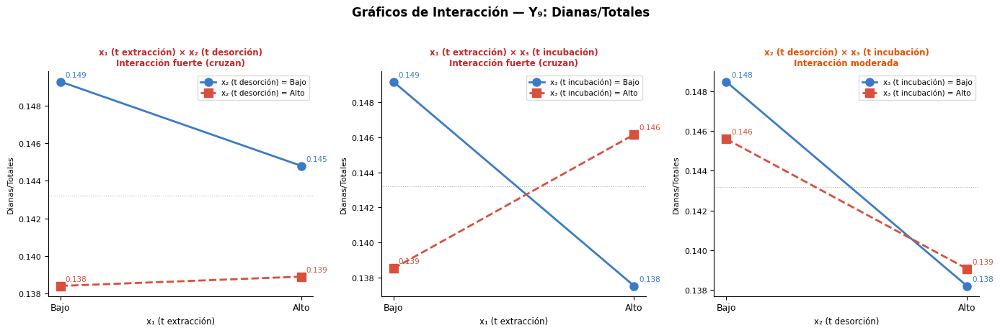

  Guardado: Graficos/interaccion_Y9_DianasTotales.png

Todas las figuras de interacción generadas.


In [14]:
# ============================================================
# INTERACTION PLOTS — 9 variables × 3 pares de factores
# ============================================================
# Lógica: para cada par (xA, xB), usamos sólo los puntos
# donde AMBOS factores son "bajo" o "alto" (|x| > 0.5).
# Calculamos la media de Y en los 4 cuadrantes: (B,B) (B,A) (A,B) (A,A)
# y trazamos dos líneas: una para xB=Bajo, otra para xB=Alto.
# ============================================================

THRESH = 0.5   # umbral para clasificar bajo/alto

# Pares de factores a estudiar
PARES = [
    ("x1", "x2", "x₁ (t extracción)", "x₂ (t desorción)"),
    ("x1", "x3", "x₁ (t extracción)", "x₃ (t incubación)"),
    ("x2", "x3", "x₂ (t desorción)",  "x₃ (t incubación)"),
]

C_BAJO = "#3a7bc8"   # azul  → nivel bajo del factor en eje X
C_ALTO = "#d94f3d"   # rojo  → nivel alto del factor en eje X
MARKERS = {"Bajo": "o", "Alto": "s"}

registros_int = []   # para tabla resumen

# ── Función: clasificar interacción a partir de 4 medias ────────────────
def clasificar_interaccion(m_BB, m_AB, m_BA, m_AA):
    """
    m_xA_xB: media de Y cuando xA=nivel_xA y xB=nivel_xB
    Línea xB=Bajo: pendiente = m_AB - m_BB   (varía xA de Bajo a Alto)
    Línea xB=Alto: pendiente = m_AA - m_BA
    """
    if any(np.isnan(x) for x in [m_BB, m_AB, m_BA, m_AA]):
        return "Sin datos suficientes"
    pend_bajo = m_AB - m_BB   # pendiente línea xB=Bajo
    pend_alto = m_AA - m_BA   # pendiente línea xB=Alto

    # Ratio de paralelismo: si ambas pendientes tienen el mismo signo
    # y magnitudes similares → paralelas
    if abs(pend_bajo) < 1e-12 and abs(pend_alto) < 1e-12:
        return "Sin interacción (planas)"

    diferencia = abs(pend_alto - pend_bajo)
    escala     = max(abs(pend_bajo), abs(pend_alto), 1e-12)
    ratio      = diferencia / escala

    if ratio < 0.25:
        return "Sin interacción (paralelas)"
    elif ratio < 0.75:
        return "Interacción moderada"
    else:
        # Cruzan si signos opuestos
        if pend_bajo * pend_alto < 0:
            return "Interacción fuerte (cruzan)"
        else:
            return "Interacción fuerte (divergen)"

# ── Bucle principal ──────────────────────────────────────────────────────
for col in Y_COLS:
    label = Y_LABELS[col]
    fig, axes = plt.subplots(1, 3, figsize=(14, 4.5))
    fig.suptitle(f"Gráficos de Interacción — {label}",
                 fontsize=12, fontweight="bold", y=1.02)

    fila_res = {"Variable": label}

    for ax, (xA, xB, lxA, lxB) in zip(axes, PARES):
        # ── Filtrar sólo puntos factoriales para ambos factores ──────
        mask = (df_full[xA].abs() > THRESH) & (df_full[xB].abs() > THRESH)
        sub  = df_full[mask].copy()

        # Asignar etiquetas de nivel
        sub["niv_xA"] = sub[xA].apply(lambda v: "Bajo" if v < 0 else "Alto")
        sub["niv_xB"] = sub[xB].apply(lambda v: "Bajo" if v < 0 else "Alto")

        # Calcular medias en los 4 cuadrantes
        medias = (
            sub.groupby(["niv_xA", "niv_xB"])[col]
            .mean()
            .reindex(pd.MultiIndex.from_tuples(
                [("Bajo","Bajo"),("Bajo","Alto"),("Alto","Bajo"),("Alto","Alto")],
                names=["niv_xA","niv_xB"]
            ))
        )

        m_BB = medias.get(("Bajo","Bajo"), np.nan)
        m_BA = medias.get(("Bajo","Alto"), np.nan)
        m_AB = medias.get(("Alto","Bajo"), np.nan)
        m_AA = medias.get(("Alto","Alto"), np.nan)

        # ── Trazar líneas ─────────────────────────────────────────────
        x_pos   = [0, 1]   # Bajo=0, Alto=1 para xA en eje X
        x_ticks = ["Bajo", "Alto"]

        ax.plot(x_pos, [m_BB, m_AB],
                color=C_BAJO, marker="o", markersize=8,
                linewidth=2, label=f"{lxB} = Bajo", zorder=5)
        ax.plot(x_pos, [m_BA, m_AA],
                color=C_ALTO, marker="s", markersize=8,
                linewidth=2, linestyle="--", label=f"{lxB} = Alto", zorder=5)

        # Anotar valores de media sobre cada punto
        for xi, yi, col_ann in [(0, m_BB, C_BAJO), (1, m_AB, C_BAJO),
                                 (0, m_BA, C_ALTO), (1, m_AA, C_ALTO)]:
            if not np.isnan(yi):
                ax.annotate(f"{yi:.3g}", xy=(xi, yi),
                            xytext=(5, 5), textcoords="offset points",
                            fontsize=7.5, color=col_ann)

        # ── Clasificación de interacción ──────────────────────────────
        clase = clasificar_interaccion(m_BB, m_AB, m_BA, m_AA)
        fila_res[f"{lxA.split('(')[0].strip()} vs {lxB.split('(')[0].strip()}"] = clase

        # Color del título según tipo de interacción
        if "fuerte" in clase.lower():
            col_titulo = "#c62828"
        elif "moderada" in clase.lower():
            col_titulo = "#e65100"
        else:
            col_titulo = "#2e7d32"

        ax.set_title(f"{lxA} × {lxB}\n{clase}",
                     fontsize=8.5, color=col_titulo, fontweight="bold")

        # ── Estilo ────────────────────────────────────────────────────
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_ticks, fontsize=9)
        ax.set_xlabel(lxA, fontsize=8.5)
        ax.set_ylabel(label.split(":")[1].strip() if ":" in label else label,
                      fontsize=8)
        ax.tick_params(axis="y", labelsize=8)
        ax.legend(fontsize=7.5, loc="best", framealpha=0.7)
        for spine in ["top", "right"]:
            ax.spines[spine].set_visible(False)

        # Línea horizontal de referencia (media global)
        ax.axhline(df_full[col].mean(), color="gray",
                   linewidth=0.8, linestyle=":", alpha=0.6)

    registros_int.append(fila_res)
    plt.tight_layout()
    fname = f"Graficos/interaccion_{col}.png"
    plt.savefig(fname, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"  Guardado: {fname}")

print("\nTodas las figuras de interacción generadas.")

In [15]:
# ============================================================
# TABLA RESUMEN DE INTERACCIONES + EXPORTACIÓN
# ============================================================
df_int = pd.DataFrame(registros_int)

# Columnas de pares de factores
pares_cols = [c for c in df_int.columns if c != "Variable"]

# Columna de interpretación global por variable
def interpretar_global(row):
    valores = [row[c] for c in pares_cols]
    n_fuerte   = sum("fuerte"   in v.lower() for v in valores)
    n_moderada = sum("moderada" in v.lower() for v in valores)
    if n_fuerte >= 2:
        return "Múltiples interacciones fuertes"
    elif n_fuerte == 1:
        return "Una interacción fuerte"
    elif n_moderada >= 1:
        return "Interacciones moderadas"
    else:
        return "Sin interacciones relevantes"

df_int["Interpretación global"] = df_int.apply(interpretar_global, axis=1)

# ── Imprimir tabla ────────────────────────────────────────────
print("=" * 105)
print("RESUMEN DE INTERACCIONES")
print("=" * 105)
print(df_int.to_string(index=False))
print("=" * 105)

# ── Exportar a Excel con colores ──────────────────────────────
from openpyxl.styles import PatternFill, Font, Alignment

FILL_MAP = {
    "fuerte":    PatternFill("solid", fgColor="FFCDD2"),   # rojo claro
    "moderada":  PatternFill("solid", fgColor="FFF9C4"),   # amarillo
    "paralelas": PatternFill("solid", fgColor="C8E6C9"),   # verde
    "planas":    PatternFill("solid", fgColor="C8E6C9"),
    "sin datos": PatternFill("solid", fgColor="F5F5F5"),
}

def get_fill(texto):
    t = texto.lower()
    for key, fill in FILL_MAP.items():
        if key in t:
            return fill
    return PatternFill("solid", fgColor="E8F5E9")

with pd.ExcelWriter("resumen_interacciones.xlsx", engine="openpyxl") as writer:
    df_int.to_excel(writer, sheet_name="Interacciones", index=False)
    ws = writer.sheets["Interacciones"]

    bold   = Font(bold=True)
    center = Alignment(horizontal="center", vertical="center", wrap_text=True)

    # Cabecera
    for cell in ws[1]:
        cell.font  = bold
        cell.alignment = center
        cell.fill  = PatternFill("solid", fgColor="90A4AE")

    # Filas de datos — colorear celda por celda según contenido
    for row in ws.iter_rows(min_row=2, max_row=ws.max_row):
        for cell in row:
            cell.alignment = center
            if cell.value and isinstance(cell.value, str):
                cell.fill = get_fill(cell.value)

    # Ancho de columnas
    for col in ws.columns:
        max_len = max((len(str(c.value)) if c.value else 0) for c in col)
        ws.column_dimensions[col[0].column_letter].width = min(max_len + 3, 38)
    ws.row_dimensions[1].height = 28

print("Tabla exportada: resumen_interacciones.xlsx")

# ── Resumen ejecutivo ──────────────────────────────────────────
print("\n" + "─" * 65)
print("RESUMEN EJECUTIVO DE INTERACCIONES")
print("─" * 65)
for _, row in df_int.iterrows():
    fuertes = [c for c in pares_cols if "fuerte" in str(row[c]).lower()]
    mods    = [c for c in pares_cols if "moderada" in str(row[c]).lower()]
    print(f"  {row['Variable']:<35}  {row['Interpretación global']}")
    if fuertes:
        print(f"    → Fuertes:   {', '.join(fuertes)}")
    if mods:
        print(f"    → Moderadas: {', '.join(mods)}")
print("─" * 65)

RESUMEN DE INTERACCIONES
                  Variable                      x₁ vs x₂                    x₁ vs x₃                    x₂ vs x₃           Interpretación global
  Y₁: Nº Metabolitos Diana          Interacción moderada Interacción fuerte (cruzan)        Interacción moderada          Una interacción fuerte
Y₂: Nº Metabolitos Totales          Interacción moderada        Interacción moderada Interacción fuerte (cruzan)          Una interacción fuerte
            Y₃: %RSD Todos   Interacción fuerte (cruzan) Interacción fuerte (cruzan) Interacción fuerte (cruzan) Múltiples interacciones fuertes
            Y₄: %RSD Diana Interacción fuerte (divergen) Interacción fuerte (cruzan) Sin interacción (paralelas) Múltiples interacciones fuertes
           Y₅: Indol/Todos   Interacción fuerte (cruzan) Interacción fuerte (cruzan)        Interacción moderada Múltiples interacciones fuertes
          Y₆: Cresol/Todos          Interacción moderada        Interacción moderada Interacción fuerte (

# Análisis de Correlaciones y Residuos Preliminares

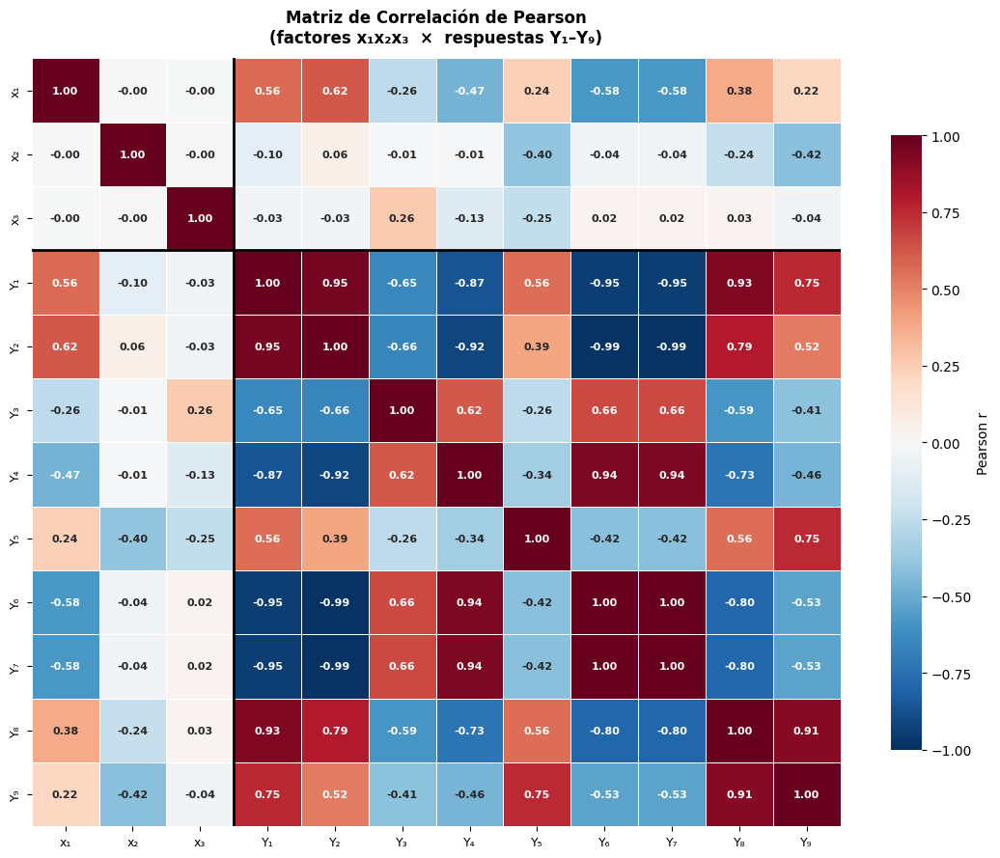

Heatmap guardado: correlacion_heatmap.png / .pdf


In [16]:
# ============================================================
# LIBRERÍAS ADICIONALES
# ============================================================
import seaborn as sns
from sklearn.linear_model import LinearRegression
from scipy.stats import shapiro, norm as sp_norm

# Columnas a usar (ya tenemos df_full del bloque anterior)
YCOLS = [c for c in Y_COLS]   # Y1..Y9 con nombres largos
XCOLS = ["x1", "x2", "x3"]

# Etiquetas cortas para los ejes del heatmap
SHORT = {
    "x1": "x₁", "x2": "x₂", "x3": "x₃",
    "Y1_MetabDiana":     "Y₁",
    "Y2_MetabTotales":   "Y₂",
    "Y3_RSD_Todos":      "Y₃",
    "Y4_RSD_Diana":      "Y₄",
    "Y5_Indol":          "Y₅",
    "Y6_Cresol":         "Y₆",
    "Y7_Metional":       "Y₇",
    "Y8_AcCarboxilicos": "Y₈",
    "Y9_DianasTotales":  "Y₉",
}

ALL_COLS = XCOLS + YCOLS

# ============================================================
# 1. MATRIZ DE CORRELACIÓN DE PEARSON + HEATMAP
# ============================================================
corr = df_full[ALL_COLS].corr()
corr_label = corr.rename(index=SHORT, columns=SHORT)

fig, ax = plt.subplots(figsize=(11, 9))

sns.heatmap(
    corr_label,
    ax=ax,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    vmin=-1, vmax=1, center=0,
    linewidths=0.4,
    linecolor="white",
    annot_kws={"size": 8, "weight": "bold"},
    cbar_kws={"shrink": 0.8, "label": "Pearson r"},
)

# Líneas divisorias para separar bloque Factores | Respuestas
ax.axhline(3, color="black", linewidth=2)
ax.axvline(3, color="black", linewidth=2)

ax.set_title(
    "Matriz de Correlación de Pearson\n(factores x₁x₂x₃  ×  respuestas Y₁–Y₉)",
    fontsize=12, fontweight="bold", pad=12,
)
ax.tick_params(axis="both", labelsize=9)
plt.tight_layout()
plt.savefig("Graficos/correlacion_heatmap.png", dpi=150, bbox_inches="tight")
plt.savefig("Graficos/correlacion_heatmap.pdf", bbox_inches="tight")
plt.show()
print("Heatmap guardado: correlacion_heatmap.png / .pdf")

COLINEALIDAD ENTRE FACTORES (criterio |r| > 0.8)
  x₁ – x₂:  r = -0.0000   ✓ OK
  x₁ – x₃:  r = -0.0024   ✓ OK
  x₂ – x₃:  r = -0.0000   ✓ OK

  ✓ CCD es ortogonal — factores no correlacionados entre sí.

CORRELACIONES ALTAS ENTRE RESPUESTAS (|r| > 0.8)
  Y₁ – Y₂:  r = +0.9543  (positiva)  → posiblemente redundantes
  Y₁ – Y₄:  r = -0.8667  (negativa)  → posiblemente redundantes
  Y₁ – Y₆:  r = -0.9484  (negativa)  → posiblemente redundantes
  Y₁ – Y₇:  r = -0.9484  (negativa)  → posiblemente redundantes
  Y₁ – Y₈:  r = +0.9287  (positiva)  → posiblemente redundantes
  Y₂ – Y₄:  r = -0.9205  (negativa)  → posiblemente redundantes
  Y₂ – Y₆:  r = -0.9916  (negativa)  → posiblemente redundantes
  Y₂ – Y₇:  r = -0.9916  (negativa)  → posiblemente redundantes
  Y₄ – Y₆:  r = +0.9411  (positiva)  → posiblemente redundantes
  Y₄ – Y₇:  r = +0.9411  (positiva)  → posiblemente redundantes
  Y₆ – Y₇:  r = +1.0000  (positiva)  → posiblemente redundantes
  Y₈ – Y₉:  r = +0.9083  (positiva)  → pos

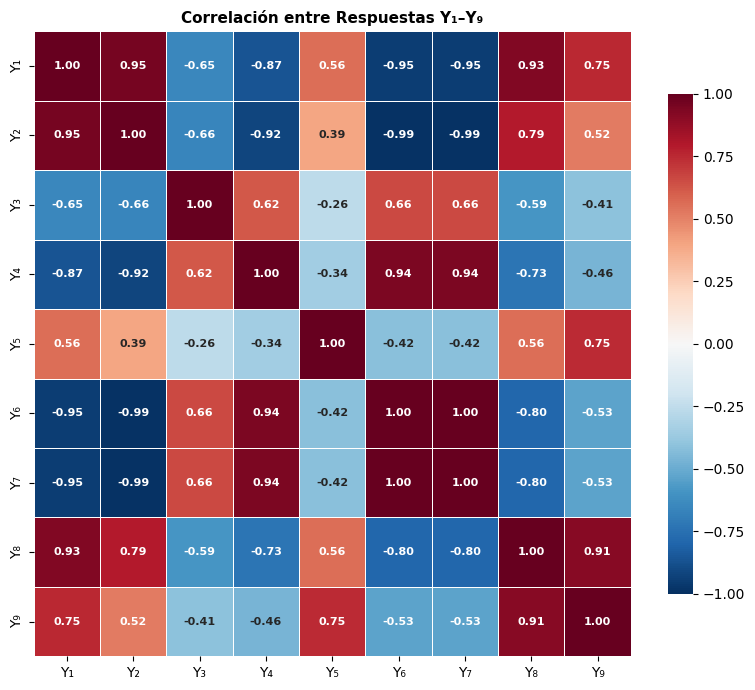


Heatmap Y vs Y guardado: correlacion_YvsY.png


In [17]:
# ============================================================
# 2. ANÁLISIS DE COLINEALIDAD (factores entre sí)
# ============================================================
print("=" * 55)
print("COLINEALIDAD ENTRE FACTORES (criterio |r| > 0.8)")
print("=" * 55)
pares_fact = [("x1","x2"), ("x1","x3"), ("x2","x3")]
hay_colin = False
for a, b in pares_fact:
    r = corr.loc[a, b]
    flag = "✗ COLINEALIDAD" if abs(r) > 0.8 else "✓ OK"
    print(f"  {SHORT[a]} – {SHORT[b]}:  r = {r:+.4f}   {flag}")
    if abs(r) > 0.8:
        hay_colin = True

print()
if hay_colin:
    print("  ⚠ Se detectó colinealidad entre factores.")
else:
    print("  ✓ CCD es ortogonal — factores no correlacionados entre sí.")

# ============================================================
# 3. CORRELACIONES ENTRE RESPUESTAS Y vs Y
# ============================================================
print()
print("=" * 65)
print("CORRELACIONES ALTAS ENTRE RESPUESTAS (|r| > 0.8)")
print("=" * 65)

corr_yy = df_full[YCOLS].corr()
altas = []
for i, ya in enumerate(YCOLS):
    for yb in YCOLS[i+1:]:
        r = corr_yy.loc[ya, yb]
        if abs(r) > 0.8:
            tipo = "positiva" if r > 0 else "negativa"
            altas.append({"Y_a": SHORT[ya], "Y_b": SHORT[yb],
                          "r": round(r, 4), "Tipo": tipo})
            print(f"  {SHORT[ya]} – {SHORT[yb]}:  r = {r:+.4f}  ({tipo})  → posiblemente redundantes")

if not altas:
    print("  Ninguna correlación > 0.8 entre respuestas.")
else:
    print(f"\n  → {len(altas)} par(es) con alta correlación. Considerar reducción de variables.")

# Heatmap solo Y vs Y
fig, ax = plt.subplots(figsize=(8, 7))
corr_yy_label = corr_yy.rename(index=SHORT, columns=SHORT)
sns.heatmap(corr_yy_label, ax=ax, annot=True, fmt=".2f",
            cmap="RdBu_r", vmin=-1, vmax=1, center=0,
            linewidths=0.4, linecolor="white",
            annot_kws={"size": 8, "weight": "bold"},
            cbar_kws={"shrink": 0.8})
ax.set_title("Correlación entre Respuestas Y₁–Y₉", fontsize=11, fontweight="bold")
plt.tight_layout()
plt.savefig("Graficos/correlacion_YvsY.png", dpi=150, bbox_inches="tight")
plt.show()
print("\nHeatmap Y vs Y guardado: correlacion_YvsY.png")

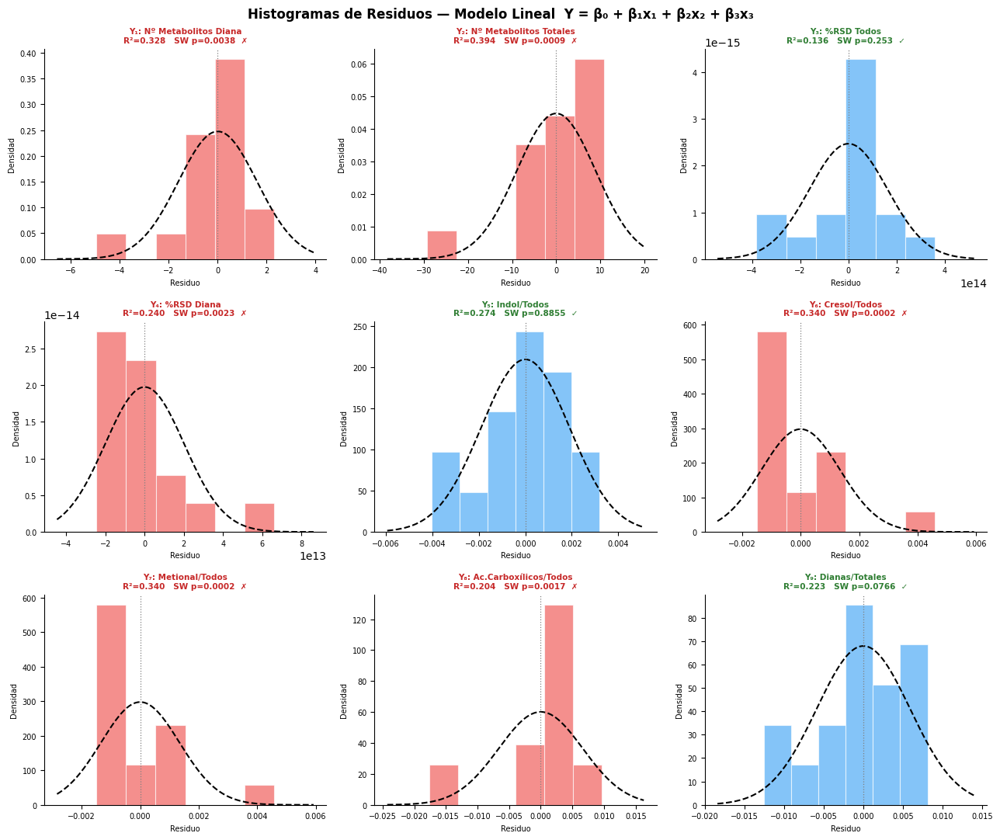

Guardado: residuos_histogramas.png / .pdf


In [18]:
# ============================================================
# 4. MODELOS LINEALES PRELIMINARES + HISTOGRAMAS DE RESIDUOS
# ============================================================
X_mat = df_full[XCOLS].values

modelos = {}
for col in YCOLS:
    y     = df_full[col].values
    model = LinearRegression().fit(X_mat, y)
    pred  = model.predict(X_mat)
    res   = y - pred
    _, p_sw = shapiro(res)
    modelos[col] = {
        "model":     model,
        "pred":      pred,
        "res":       res,
        "r2":        model.score(X_mat, y),
        "coef":      dict(zip(XCOLS, model.coef_)),
        "intercept": model.intercept_,
        "shapiro_p": round(p_sw, 4),
    }

# ── Grid 3×3 histogramas de residuos ─────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(13, 11))
fig.suptitle(
    "Histogramas de Residuos — Modelo Lineal  Y = β₀ + β₁x₁ + β₂x₂ + β₃x₃",
    fontsize=12, fontweight="bold"
)

for ax, col in zip(axes.flatten(), YCOLS):
    res   = modelos[col]["res"]
    p_sw  = modelos[col]["shapiro_p"]
    r2    = modelos[col]["r2"]
    es_norm = p_sw > 0.05

    color = "#42a5f5" if es_norm else "#ef5350"
    ax.hist(res, bins=6, density=True, color=color,
            alpha=0.65, edgecolor="white", linewidth=0.8)

    # Curva normal superpuesta
    mu, sig = res.mean(), res.std()
    xn = np.linspace(res.min() - sig, res.max() + sig, 200)
    ax.plot(xn, sp_norm.pdf(xn, mu, sig), "k--", linewidth=1.5)

    # Línea en 0
    ax.axvline(0, color="gray", linewidth=0.9, linestyle=":")

    marca = "✓" if es_norm else "✗"
    c_tit = "#2e7d32" if es_norm else "#c62828"
    ax.set_title(
        f"{Y_LABELS[col]}\nR²={r2:.3f}   SW p={p_sw}  {marca}",
        fontsize=7.5, color=c_tit, fontweight="bold"
    )
    ax.set_xlabel("Residuo", fontsize=7)
    ax.set_ylabel("Densidad", fontsize=7)
    ax.tick_params(labelsize=7)
    for s in ["top", "right"]:
        ax.spines[s].set_visible(False)

plt.tight_layout()
plt.savefig("Graficos/residuos_histogramas.png", dpi=150, bbox_inches="tight")
plt.savefig("Graficos/residuos_histogramas.pdf", bbox_inches="tight")
plt.show()
print("Guardado: residuos_histogramas.png / .pdf")

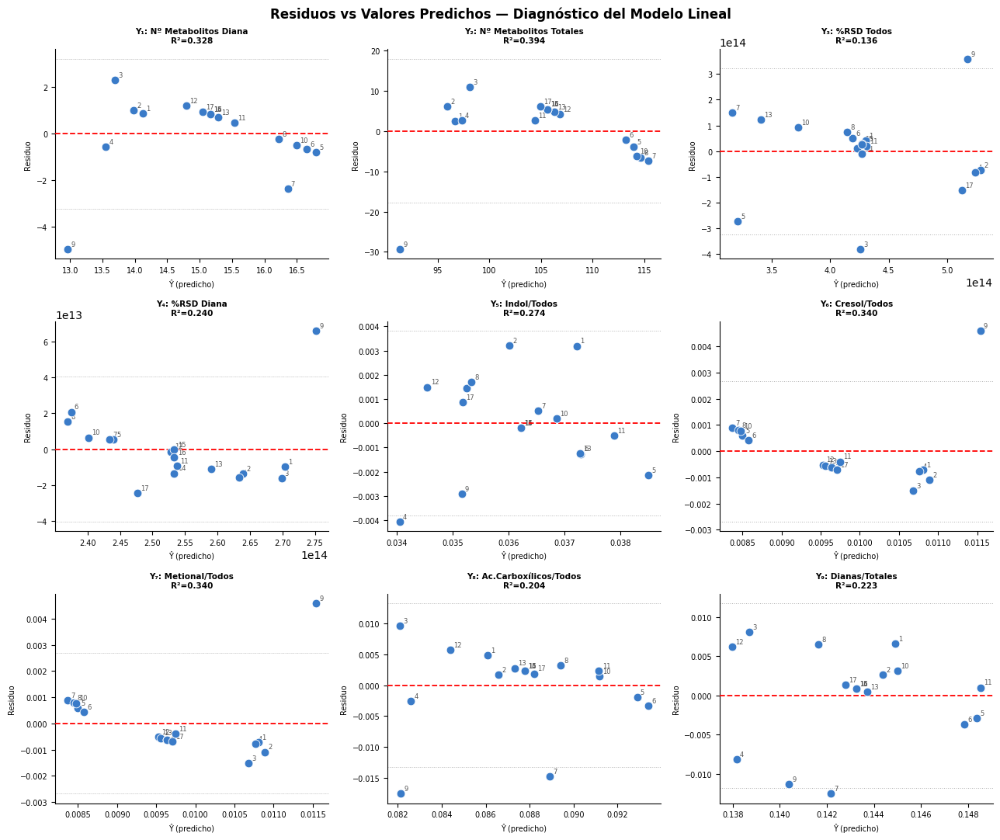

Guardado: residuos_vs_predichos.png / .pdf


In [19]:
# ============================================================
# 5. SCATTER RESIDUOS vs PREDICHOS
# ============================================================
fig, axes = plt.subplots(3, 3, figsize=(13, 11))
fig.suptitle(
    "Residuos vs Valores Predichos — Diagnóstico del Modelo Lineal",
    fontsize=12, fontweight="bold"
)

for ax, col in zip(axes.flatten(), YCOLS):
    pred = modelos[col]["pred"]
    res  = modelos[col]["res"]
    r2   = modelos[col]["r2"]

    ax.scatter(pred, res, color="#3a7bc8", s=60,
               edgecolors="white", linewidths=0.6, zorder=5)
    ax.axhline(0, color="red", linewidth=1.3, linestyle="--", zorder=4)

    # Banda ±2σ (referencia)
    sig = res.std()
    ax.axhline( 2*sig, color="gray", linewidth=0.7, linestyle=":", alpha=0.6)
    ax.axhline(-2*sig, color="gray", linewidth=0.7, linestyle=":", alpha=0.6)

    # Anotar número de experimento en cada punto
    for i, (xp, yp) in enumerate(zip(pred, res)):
        exp_n = df_full["Experimento"].iloc[i]
        ax.annotate(str(exp_n), (xp, yp),
                    xytext=(3, 3), textcoords="offset points",
                    fontsize=6, color="#555555")

    ax.set_title(f"{Y_LABELS[col]}\nR²={r2:.3f}",
                 fontsize=7.5, fontweight="bold")
    ax.set_xlabel("Ŷ (predicho)", fontsize=7)
    ax.set_ylabel("Residuo", fontsize=7)
    ax.tick_params(labelsize=7)
    for s in ["top", "right"]:
        ax.spines[s].set_visible(False)

plt.tight_layout()
plt.savefig("Graficos/residuos_vs_predichos.png", dpi=150, bbox_inches="tight")
plt.savefig("Graficos/residuos_vs_predichos.pdf", bbox_inches="tight")
plt.show()
print("Guardado: residuos_vs_predichos.png / .pdf")

In [20]:
# ============================================================
# 6. TABLA RESUMEN + EXPORTACIÓN A EXCEL
# ============================================================
from openpyxl.styles import PatternFill, Font, Alignment

# ── Tabla 1: Colinealidad entre factores ─────────────────────
rows_colin = []
for a, b in [("x1","x2"),("x1","x3"),("x2","x3")]:
    r = corr.loc[a, b]
    rows_colin.append({
        "Par": f"{SHORT[a]} – {SHORT[b]}",
        "r Pearson": round(r, 4),
        "Colinealidad": "SÍ ✗" if abs(r) > 0.8 else "NO ✓",
    })
df_colin = pd.DataFrame(rows_colin)

# ── Tabla 2: Correlaciones altas Y vs Y ──────────────────────
rows_yy = []
for i, ya in enumerate(YCOLS):
    for yb in YCOLS[i+1:]:
        r = corr_yy.loc[ya, yb]
        rows_yy.append({
            "Par": f"{SHORT[ya]} – {SHORT[yb]}",
            "r Pearson": round(r, 4),
            "Alta (>0.8)": "SÍ" if abs(r) > 0.8 else "NO",
            "Redundantes": "Posiblemente" if abs(r) > 0.8 else "—",
        })
df_yy = pd.DataFrame(rows_yy)

# ── Tabla 3: Residuos por variable ───────────────────────────
rows_res = []
for col in YCOLS:
    m = modelos[col]
    p = m["shapiro_p"]
    rows_res.append({
        "Variable":          Y_LABELS[col],
        "R² modelo lineal":  round(m["r2"], 4),
        "β₁ (x₁)":           round(m["coef"]["x1"], 5),
        "β₂ (x₂)":           round(m["coef"]["x2"], 5),
        "β₃ (x₃)":           round(m["coef"]["x3"], 5),
        "Shapiro-Wilk p":    p,
        "Residuos normales": "SÍ ✓" if p > 0.05 else "NO ✗",
        "Diagnóstico":       "Modelo lineal insuficiente (R² bajo)" if m["r2"] < 0.5
                             else "Modelo lineal aceptable",
    })
df_res = pd.DataFrame(rows_res)

# ── Imprimir ──────────────────────────────────────────────────
print("COLINEALIDAD ENTRE FACTORES")
print(df_colin.to_string(index=False))
print()
print("CORRELACIONES ALTAS Y vs Y (|r|>0.8)")
print(df_yy[df_yy["Alta (>0.8)"]=="SÍ"].to_string(index=False) if (df_yy["Alta (>0.8)"]=="SÍ").any()
      else "  Ninguna")
print()
print("RESUMEN DE MODELOS LINEALES Y RESIDUOS")
print(df_res[["Variable","R² modelo lineal","Shapiro-Wilk p","Residuos normales","Diagnóstico"]].to_string(index=False))

# ── Exportar Excel ────────────────────────────────────────────
VERDE  = PatternFill("solid", fgColor="C8E6C9")
ROJO   = PatternFill("solid", fgColor="FFCDD2")
AMARI  = PatternFill("solid", fgColor="FFF9C4")
GRIS   = PatternFill("solid", fgColor="B0BEC5")
bold   = Font(bold=True)
center = Alignment(horizontal="center", vertical="center", wrap_text=True)

with pd.ExcelWriter("resumen_correlaciones_residuos.xlsx", engine="openpyxl") as writer:

    # Hoja 1: Colinealidad
    df_colin.to_excel(writer, sheet_name="Colinealidad", index=False)
    ws = writer.sheets["Colinealidad"]
    for cell in ws[1]: cell.font = bold; cell.fill = GRIS; cell.alignment = center
    for row in ws.iter_rows(min_row=2, max_row=ws.max_row):
        fill = VERDE if "NO" in str(row[2].value) else ROJO
        for cell in row: cell.fill = fill; cell.alignment = center

    # Hoja 2: Correlaciones Y vs Y
    df_yy.to_excel(writer, sheet_name="Corr_YvsY", index=False)
    ws2 = writer.sheets["Corr_YvsY"]
    for cell in ws2[1]: cell.font = bold; cell.fill = GRIS; cell.alignment = center
    for row in ws2.iter_rows(min_row=2, max_row=ws2.max_row):
        r_val = abs(float(row[1].value)) if row[1].value else 0
        fill = ROJO if r_val > 0.8 else (AMARI if r_val > 0.6 else VERDE)
        for cell in row: cell.fill = fill; cell.alignment = center

    # Hoja 3: Modelos y residuos
    df_res.to_excel(writer, sheet_name="Modelos_Residuos", index=False)
    ws3 = writer.sheets["Modelos_Residuos"]
    for cell in ws3[1]: cell.font = bold; cell.fill = GRIS; cell.alignment = center
    for row in ws3.iter_rows(min_row=2, max_row=ws3.max_row):
        norm_val = str(row[6].value)
        fill = VERDE if "SÍ" in norm_val else ROJO
        for cell in row: cell.fill = fill; cell.alignment = center

    # Ajustar anchos en todas las hojas
    for ws_i in [ws, ws2, ws3]:
        for col in ws_i.columns:
            mx = max((len(str(c.value)) if c.value else 0) for c in col)
            ws_i.column_dimensions[col[0].column_letter].width = min(mx + 3, 40)

print("\nExportado: resumen_correlaciones_residuos.xlsx")
print("  → Hoja 'Colinealidad'")
print("  → Hoja 'Corr_YvsY'")
print("  → Hoja 'Modelos_Residuos'")

COLINEALIDAD ENTRE FACTORES
    Par  r Pearson Colinealidad
x₁ – x₂    -0.0000         NO ✓
x₁ – x₃    -0.0024         NO ✓
x₂ – x₃    -0.0000         NO ✓

CORRELACIONES ALTAS Y vs Y (|r|>0.8)
    Par  r Pearson Alta (>0.8)  Redundantes
Y₁ – Y₂     0.9543          SÍ Posiblemente
Y₁ – Y₄    -0.8667          SÍ Posiblemente
Y₁ – Y₆    -0.9484          SÍ Posiblemente
Y₁ – Y₇    -0.9484          SÍ Posiblemente
Y₁ – Y₈     0.9287          SÍ Posiblemente
Y₂ – Y₄    -0.9205          SÍ Posiblemente
Y₂ – Y₆    -0.9916          SÍ Posiblemente
Y₂ – Y₇    -0.9916          SÍ Posiblemente
Y₄ – Y₆     0.9411          SÍ Posiblemente
Y₄ – Y₇     0.9411          SÍ Posiblemente
Y₆ – Y₇     1.0000          SÍ Posiblemente
Y₈ – Y₉     0.9083          SÍ Posiblemente

RESUMEN DE MODELOS LINEALES Y RESIDUOS
                  Variable  R² modelo lineal  Shapiro-Wilk p Residuos normales                          Diagnóstico
  Y₁: Nº Metabolitos Diana            0.3284          0.0038              NO ✗

# FASE 3 — Modelos Preliminares (intuición previa a Chemoface)

> **Propósito:** Estos modelos NO son el modelo RSM final. Sirven para:
> - Detectar qué factores tienen efecto lineal significativo sobre cada Y
> - Cuantificar cuánto añaden las interacciones sobre el modelo lineal puro
> - Orientar las expectativas antes del ajuste cuadrático completo en Chemoface

---

## 3.1 Modelo Lineal sin Interacciones
`Y = β₀ + β₁x₁ + β₂x₂ + β₃x₃`

## 3.2 Modelo con Interacciones de Primer Orden
`Y = β₀ + β₁x₁ + β₂x₂ + β₃x₃ + β₁₂x₁x₂ + β₁₃x₁x₃ + β₂₃x₂x₃`

In [21]:
# ============================================================
# FASE 3 — SETUP: términos de interacción + librería OLS
# ============================================================
import statsmodels.api as sm

# Añadir columnas de interacción al dataset (producto de factores codificados)
df_full["x1x2"] = df_full["x1"] * df_full["x2"]
df_full["x1x3"] = df_full["x1"] * df_full["x3"]
df_full["x2x3"] = df_full["x2"] * df_full["x3"]

XCOLS_LIN = ["x1", "x2", "x3"]
XCOLS_INT = ["x1", "x2", "x3", "x1x2", "x1x3", "x2x3"]

TERM_LABELS_LIN = ["β₀ (intercepto)", "β₁ (x₁)", "β₂ (x₂)", "β₃ (x₃)"]
TERM_LABELS_INT = TERM_LABELS_LIN + ["β₁₂ (x₁x₂)", "β₁₃ (x₁x₃)", "β₂₃ (x₂x₃)"]

# ── Ajustar ambos modelos para todas las Y ────────────────────
resultados_3 = {}

for col in Y_COLS:
    y      = df_full[col].values
    X_lin  = sm.add_constant(df_full[XCOLS_LIN], has_constant="add")
    X_int  = sm.add_constant(df_full[XCOLS_INT], has_constant="add")
    m_lin  = sm.OLS(y, X_lin).fit()
    m_int  = sm.OLS(y, X_int).fit()

    # Test F de mejora al añadir interacciones
    # RSS_red (lineal) vs RSS_full (interacciones)
    rss_lin = m_lin.ssr
    rss_int = m_int.ssr
    n       = len(y)
    q       = 3          # términos añadidos (x1x2, x1x3, x2x3)
    p_full  = 7          # parámetros modelo interacciones
    F_delta = ((rss_lin - rss_int) / q) / (rss_int / (n - p_full))
    from scipy.stats import f as f_dist
    p_F     = f_dist.sf(F_delta, q, n - p_full)

    resultados_3[col] = {
        "m_lin":     m_lin,
        "m_int":     m_int,
        "R2_lin":    round(m_lin.rsquared, 4),
        "R2_int":    round(m_int.rsquared, 4),
        "AIC_lin":   round(m_lin.aic, 2),
        "AIC_int":   round(m_int.aic, 2),
        "F_delta":   round(F_delta, 3),
        "p_F_delta": round(p_F, 4),
        "mejora":    "SÍ ✓" if p_F < 0.05 else "NO ✗",
    }

print("Modelos ajustados para todas las variables Y.")
print(f"  Dataset: {df_full.shape[0]} obs. | Modelo lineal: 4 param. | Con interacciones: 7 param.")

Modelos ajustados para todas las variables Y.
  Dataset: 17 obs. | Modelo lineal: 4 param. | Con interacciones: 7 param.


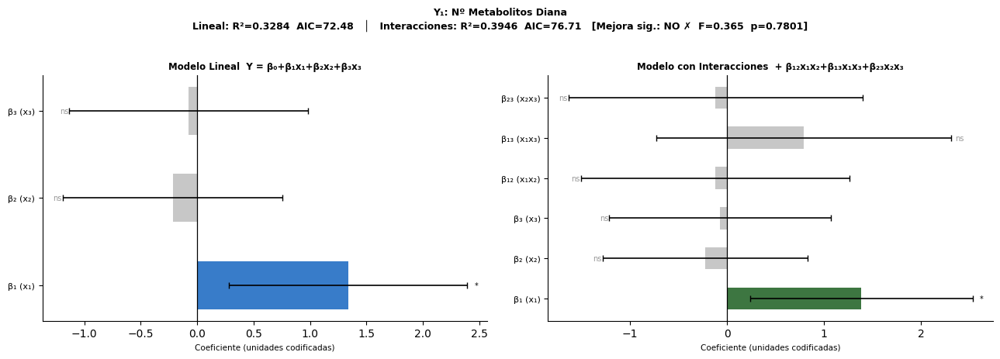

  Y₁: Nº Metabolitos Diana        R²_lin=0.3284  R²_int=0.3946  mejora=NO ✗


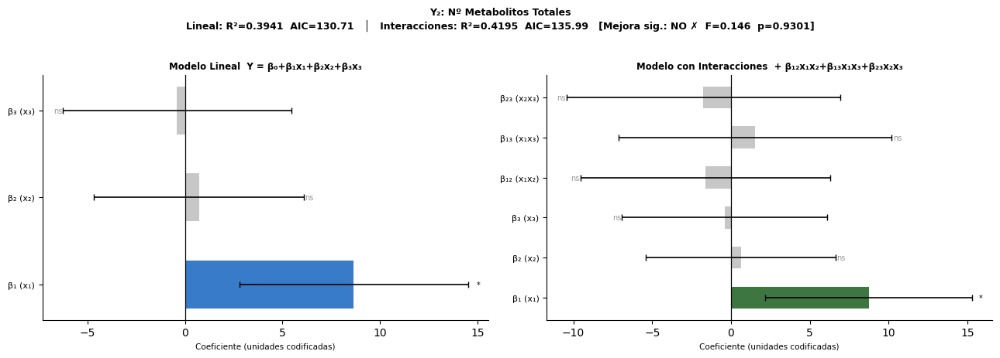

  Y₂: Nº Metabolitos Totales      R²_lin=0.3941  R²_int=0.4195  mejora=NO ✗


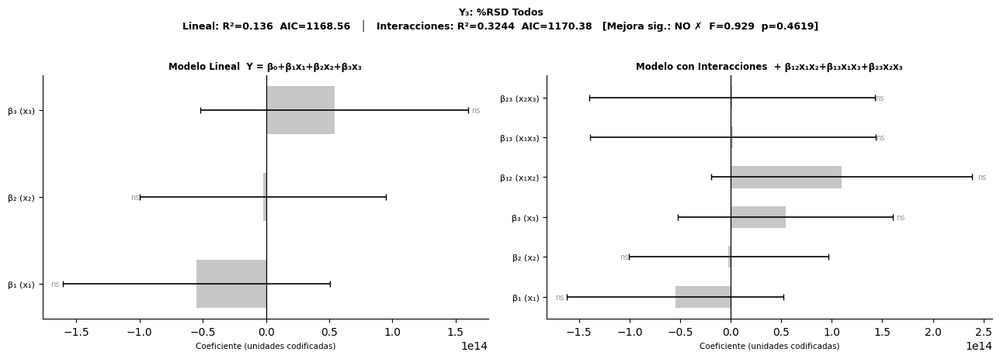

  Y₃: %RSD Todos                  R²_lin=0.136  R²_int=0.3244  mejora=NO ✗


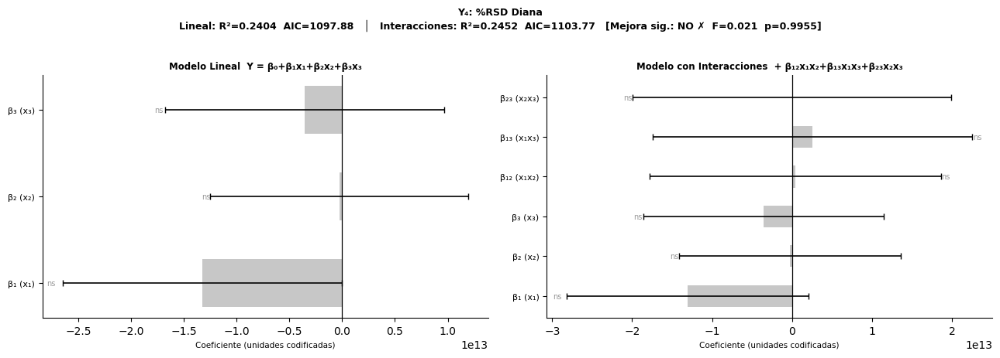

  Y₄: %RSD Diana                  R²_lin=0.2404  R²_int=0.2452  mejora=NO ✗


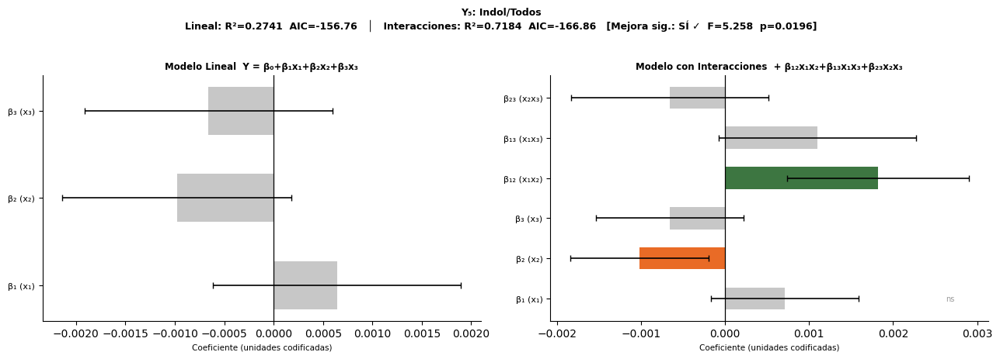

  Y₅: Indol/Todos                 R²_lin=0.2741  R²_int=0.7184  mejora=SÍ ✓


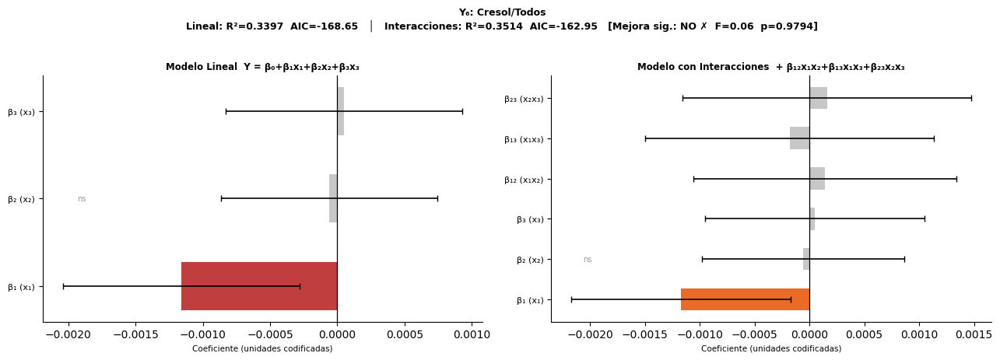

  Y₆: Cresol/Todos                R²_lin=0.3397  R²_int=0.3514  mejora=NO ✗


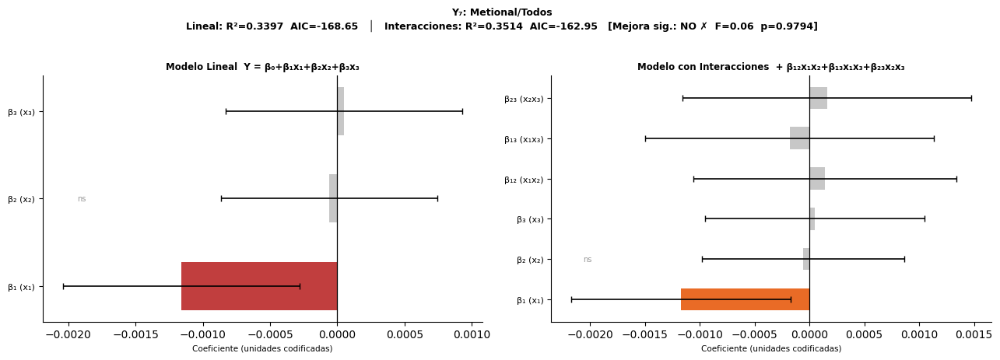

  Y₇: Metional/Todos              R²_lin=0.3397  R²_int=0.3514  mejora=NO ✗


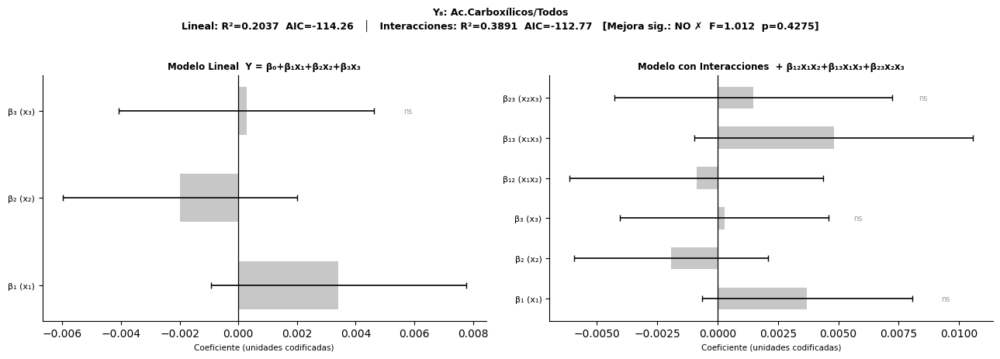

  Y₈: Ac.Carboxílicos/Todos       R²_lin=0.2037  R²_int=0.3891  mejora=NO ✗


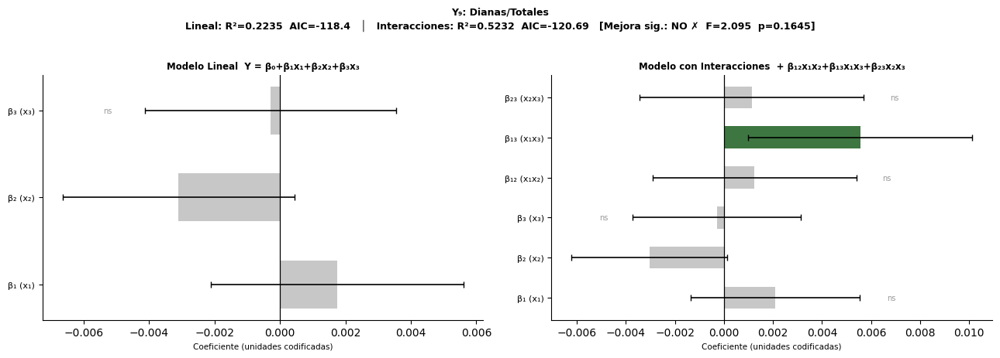

  Y₉: Dianas/Totales              R²_lin=0.2235  R²_int=0.5232  mejora=NO ✗

Figuras guardadas en Graficos/fase3_modelos_*.png


In [22]:
# ============================================================
# 3.1 + 3.2 — TABLA DE COEFICIENTES Y SIGNIFICANCIA
#             (una figura por variable Y, con ambos modelos)
# ============================================================

def tabla_coef(model, labels):
    """Devuelve DataFrame con coef, std, t, p para un modelo OLS."""
    return pd.DataFrame({
        "Término":   labels,
        "Coef":      model.params.values,
        "Std Err":   model.bse.values,
        "t":         model.tvalues.values,
        "p-valor":   model.pvalues.values,
        "Sig":       ["***" if p < 0.001 else "**" if p < 0.01
                      else "*" if p < 0.05 else "ns"
                      for p in model.pvalues],
    }).round({"Coef": 5, "Std Err": 5, "t": 3, "p-valor": 4})

def plot_coef(ax, coefs, title, color_pos, color_neg):
    """Barplot horizontal de coeficientes con IC 95%."""
    terms = coefs["Término"].tolist()[1:]   # excluir intercepto
    vals  = coefs["Coef"].values[1:]
    errs  = coefs["Std Err"].values[1:] * 1.96
    pvals = coefs["p-valor"].values[1:]
    sigs  = coefs["Sig"].values[1:]

    colors = []
    for v, p in zip(vals, pvals):
        if p < 0.05:
            colors.append(color_pos if v > 0 else color_neg)
        else:
            colors.append("#bdbdbd")

    y_pos = range(len(terms))
    bars  = ax.barh(y_pos, vals, xerr=errs, color=colors, alpha=0.85,
                    height=0.55, error_kw={"elinewidth": 1.2, "capsize": 3})
    ax.axvline(0, color="black", linewidth=0.9)
    ax.set_yticks(y_pos)
    ax.set_yticklabels(terms, fontsize=8)
    ax.set_xlabel("Coeficiente (unidades codificadas)", fontsize=7.5)
    ax.set_title(title, fontsize=8.5, fontweight="bold")

    # Anotar significancia
    for i, (v, s, e) in enumerate(zip(vals, sigs, errs)):
        offset = e + abs(v) * 0.05 + 0.001
        xpos   = v + offset if v >= 0 else v - offset
        ha     = "left" if v >= 0 else "right"
        ax.annotate(s, xy=(xpos, i), fontsize=7, ha=ha, va="center",
                    color="black" if s != "ns" else "#999999")
    for s in ["top", "right"]:
        ax.spines[s].set_visible(False)

# ── Una figura por variable Y ─────────────────────────────────
for col in Y_COLS:
    label  = Y_LABELS[col]
    res    = resultados_3[col]
    t_lin  = tabla_coef(res["m_lin"], TERM_LABELS_LIN)
    t_int  = tabla_coef(res["m_int"], TERM_LABELS_INT)

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
    fig.suptitle(
        f"{label}\n"
        f"Lineal: R²={res['R2_lin']}  AIC={res['AIC_lin']}   │   "
        f"Interacciones: R²={res['R2_int']}  AIC={res['AIC_int']}   "
        f"[Mejora sig.: {res['mejora']}  F={res['F_delta']}  p={res['p_F_delta']}]",
        fontsize=9, fontweight="bold", y=1.02
    )

    plot_coef(axes[0], t_lin,
              "Modelo Lineal  Y = β₀+β₁x₁+β₂x₂+β₃x₃",
              "#1565c0", "#b71c1c")
    plot_coef(axes[1], t_int,
              "Modelo con Interacciones  + β₁₂x₁x₂+β₁₃x₁x₃+β₂₃x₂x₃",
              "#1b5e20", "#e65100")

    plt.tight_layout()
    fname = f"Graficos/fase3_modelos_{col}.png"
    plt.savefig(fname, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"  {label[:30]:<30}  R²_lin={res['R2_lin']}  R²_int={res['R2_int']}  mejora={res['mejora']}")

print("\nFiguras guardadas en Graficos/fase3_modelos_*.png")

In [23]:
# ============================================================
# 3.3 — TABLA RESUMEN COMPARATIVA + EXPORTACIÓN A EXCEL
# ============================================================

# ── Tabla resumen de ambos modelos ───────────────────────────
filas_res3 = []
for col in Y_COLS:
    res    = resultados_3[col]
    m_lin  = res["m_lin"]
    m_int  = res["m_int"]
    t_lin  = tabla_coef(m_lin, TERM_LABELS_LIN)
    t_int  = tabla_coef(m_int, TERM_LABELS_INT)

    # Términos significativos en cada modelo
    sig_lin = t_lin[t_lin["Sig"] != "ns"]["Término"].tolist()[1:]  # excluir intercepto
    sig_int = t_int[t_int["Sig"] != "ns"]["Término"].tolist()[1:]

    filas_res3.append({
        "Variable":                Y_LABELS[col],
        "R² lineal":               res["R2_lin"],
        "R² interacciones":        res["R2_int"],
        "ΔR²":                     round(res["R2_int"] - res["R2_lin"], 4),
        "AIC lineal":              res["AIC_lin"],
        "AIC interacciones":       res["AIC_int"],
        "F mejora":                res["F_delta"],
        "p mejora":                res["p_F_delta"],
        "Interacc. sig. mejoran":  res["mejora"],
        "Efectos sig. (lineal)":   ", ".join(sig_lin) if sig_lin else "ninguno",
        "Efectos sig. (interacc)": ", ".join(sig_int) if sig_int else "ninguno",
        "Diagnóstico":             ("Lineal suficiente" if res["R2_int"] < 0.5
                                    else "Modelo interacciones útil") +
                                   " → Requiere cuadrático (Chemoface)",
    })

df_res3 = pd.DataFrame(filas_res3)

# ── Imprimir resumen ──────────────────────────────────────────
print("=" * 90)
print("RESUMEN FASE 3 — COMPARACIÓN MODELOS LINEAL vs. INTERACCIONES")
print("=" * 90)
cols_print = ["Variable","R² lineal","R² interacciones","ΔR²","p mejora","Interacc. sig. mejoran"]
print(df_res3[cols_print].to_string(index=False))
print("=" * 90)
print()
print("Efectos lineales significativos (p<0.05):")
for _, row in df_res3.iterrows():
    print(f"  {row['Variable'][:35]:<35}  {row['Efectos sig. (lineal)']}")

# ── Exportar Excel ────────────────────────────────────────────
from openpyxl.styles import PatternFill, Font, Alignment

VERDE = PatternFill("solid", fgColor="C8E6C9")
AMARI = PatternFill("solid", fgColor="FFF9C4")
ROJO  = PatternFill("solid", fgColor="FFCDD2")
GRIS  = PatternFill("solid", fgColor="B0BEC5")
bold  = Font(bold=True)
cen   = Alignment(horizontal="center", vertical="center", wrap_text=True)

with pd.ExcelWriter("fase3_modelos_preliminares.xlsx", engine="openpyxl") as writer:

    # ─ Hoja 1: Resumen comparativo ─────────────────────────────
    df_res3.to_excel(writer, sheet_name="Resumen", index=False)
    ws = writer.sheets["Resumen"]
    for cell in ws[1]: cell.font = bold; cell.fill = GRIS; cell.alignment = cen
    for row in ws.iter_rows(min_row=2, max_row=ws.max_row):
        mejora = str(row[8].value)
        fill = VERDE if "SÍ" in mejora else AMARI
        for cell in row: cell.fill = fill; cell.alignment = cen
    for col in ws.columns:
        mx = max((len(str(c.value)) if c.value else 0) for c in col)
        ws.column_dimensions[col[0].column_letter].width = min(mx + 3, 42)

    # ─ Hojas individuales: coef. de cada Y ─────────────────────
    for col in Y_COLS:
        res   = resultados_3[col]
        t_lin = tabla_coef(res["m_lin"], TERM_LABELS_LIN)
        t_int = tabla_coef(res["m_int"], TERM_LABELS_INT)
        nombre_hoja = col[:6] + "_coef"

        # Unir ambas tablas con separador
        sep   = pd.DataFrame([[""] * t_lin.shape[1]], columns=t_lin.columns)
        t_lin.insert(0, "Modelo", "Lineal")
        t_int.insert(0, "Modelo", "Interacciones")
        sep.insert(0, "Modelo", "")
        df_hoja = pd.concat([t_lin, sep, t_int], ignore_index=True)
        df_hoja.to_excel(writer, sheet_name=nombre_hoja, index=False)

        ws2 = writer.sheets[nombre_hoja]
        for cell in ws2[1]: cell.font = bold; cell.fill = GRIS; cell.alignment = cen
        for row in ws2.iter_rows(min_row=2, max_row=ws2.max_row):
            p_cell = row[5].value  # columna p-valor
            try:
                p = float(p_cell)
                fill = VERDE if p < 0.05 else (AMARI if p < 0.1 else PatternFill("solid", fgColor="F5F5F5"))
            except (TypeError, ValueError):
                fill = PatternFill("solid", fgColor="EEEEEE")
            for cell in row: cell.fill = fill; cell.alignment = cen
        for c in ws2.columns:
            mx = max((len(str(x.value)) if x.value else 0) for x in c)
            ws2.column_dimensions[c[0].column_letter].width = min(mx + 3, 30)

print("\nExportado: fase3_modelos_preliminares.xlsx")
print("  → Hoja 'Resumen': comparación R², AIC, mejora por interacciones")
print("  → Hojas Y1_coef … Y9_coef: coeficientes con p-valores coloreados")

RESUMEN FASE 3 — COMPARACIÓN MODELOS LINEAL vs. INTERACCIONES
                  Variable  R² lineal  R² interacciones    ΔR²  p mejora Interacc. sig. mejoran
  Y₁: Nº Metabolitos Diana     0.3284            0.3946 0.0662    0.7801                   NO ✗
Y₂: Nº Metabolitos Totales     0.3941            0.4195 0.0254    0.9301                   NO ✗
            Y₃: %RSD Todos     0.1360            0.3244 0.1884    0.4619                   NO ✗
            Y₄: %RSD Diana     0.2404            0.2452 0.0048    0.9955                   NO ✗
           Y₅: Indol/Todos     0.2741            0.7184 0.4443    0.0196                   SÍ ✓
          Y₆: Cresol/Todos     0.3397            0.3514 0.0117    0.9794                   NO ✗
        Y₇: Metional/Todos     0.3397            0.3514 0.0117    0.9794                   NO ✗
 Y₈: Ac.Carboxílicos/Todos     0.2037            0.3891 0.1854    0.4275                   NO ✗
        Y₉: Dianas/Totales     0.2235            0.5232 0.2997    0.1645  

In [24]:
# ============================================================
# 3.3 — DATASET LIMPIO PARA CHEMOFACE
# ============================================================
# Chemoface necesita: factores codificados + respuestas
# Formato: 17 filas × 12 columnas (x₁, x₂, x₃, Y₁…Y₉)
# ============================================================

cols_chemoface = ["Experimento"] + XCOLS + Y_COLS
df_chemoface   = df_full[cols_chemoface].copy()

# Renombrar a nombres cortos para compatibilidad con Chemoface
rename_map = {
    "x1": "x1", "x2": "x2", "x3": "x3",
    "Y1_MetabDiana":     "Y1",
    "Y2_MetabTotales":   "Y2",
    "Y3_RSD_Todos":      "Y3",
    "Y4_RSD_Diana":      "Y4",
    "Y5_Indol":          "Y5",
    "Y6_Cresol":         "Y6",
    "Y7_Metional":       "Y7",
    "Y8_AcCarboxilicos": "Y8",
    "Y9_DianasTotales":  "Y9",
}
df_chemoface = df_chemoface.rename(columns=rename_map)

# ── Exportar como Excel y CSV ─────────────────────────────────
df_chemoface.to_excel("dataset_chemoface.xlsx", index=False)
df_chemoface.to_csv("dataset_chemoface.csv",    index=False)

# ── Mostrar dataset final ─────────────────────────────────────
print("=" * 75)
print("DATASET LIMPIO PARA CHEMOFACE")
print(f"  {df_chemoface.shape[0]} experimentos × {df_chemoface.shape[1]-1} variables")
print("=" * 75)
print(df_chemoface.to_string(index=False))
print("=" * 75)
print()
print("Archivos exportados:")
print("  → dataset_chemoface.xlsx  (formato Excel)")
print("  → dataset_chemoface.csv   (formato texto, importable en Chemoface)")
print()

# ── Validación rápida ─────────────────────────────────────────
print("Validación:")
print(f"  Filas:         {len(df_chemoface)} (esperado: 17)")
print(f"  Factores:      x1 ∈ [{df_chemoface['x1'].min():.2f}, {df_chemoface['x1'].max():.2f}]  "
      f"x2 ∈ [{df_chemoface['x2'].min():.2f}, {df_chemoface['x2'].max():.2f}]  "
      f"x3 ∈ [{df_chemoface['x3'].min():.2f}, {df_chemoface['x3'].max():.2f}]")
print(f"  Valores NaN:   {df_chemoface.isna().sum().sum()} (esperado: 0)")
print(f"  Tipo factores: {df_chemoface['x1'].dtype}  ✓") 

DATASET LIMPIO PARA CHEMOFACE
  17 experimentos × 12 variables
 Experimento    x1   x2    x3  Y1  Y2              Y3              Y4       Y5       Y6       Y7       Y8       Y9
           1 -1.00 -1.0 -1.00  15  99 470556700004326 260526987409537 0.040404 0.010101 0.010101 0.090909 0.151515
           2 -1.00 -1.0  0.82  15 102 454971362460372 250368692971313 0.039216 0.009804 0.009804 0.088235 0.147059
           3 -1.00  1.0 -1.00  16 109  43970368256275 253733308637824 0.036697 0.009174 0.009174 0.091743 0.146789
           4 -1.00  1.0  0.82  13 100 439976237842035 247732145945806 0.030000 0.010000 0.010000 0.080000 0.130000
           5  1.00 -1.0 -1.00  16 110  46911463439374 249252923207968 0.036364 0.009091 0.009091 0.090909 0.145455
           6  1.00 -1.0  0.82  16 111 469279973340895 258336992739511 0.036036 0.009009 0.009009 0.090090 0.144144
           7  1.00  1.0 -1.00  14 108 465354422133095 248991374448807 0.037037 0.009259 0.009259 0.074074 0.129630
           8  1.0

---
# Ajuste RSM Cuadrático — Validación Completa (Partes 4.1–4.6)

Modelo cuadrático completo para Y₁ a Y₉:

402Y = eta_0 + eta_1 x_1 + eta_2 x_2 + eta_3 x_3 + eta_{11}x_1^2 + eta_{22}x_2^2 + eta_{33}x_3^2 + eta_{12}x_1x_2 + eta_{13}x_1x_3 + eta_{23}x_2x_3 + 

arepsilon402

**n=17** experimentos | **p=10** parámetros | **df_res=7** | Réplicas centrales: Exp 14, 15, 16

In [25]:
# ============================================================
# CELDA 1: IMPORTACIONES
# ============================================================
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import statsmodels.api as sm

from scipy import stats
from scipy.stats import f as f_dist, shapiro, probplot

import warnings, os
warnings.filterwarnings('ignore')

# Directorio de salida
OUT_DIR = 'RSM_Resultados'
os.makedirs(OUT_DIR, exist_ok=True)

print('Librerias cargadas correctamente.')
print(f'NumPy {np.__version__} | pandas {pd.__version__} | statsmodels {sm.__version__}')

Librerias cargadas correctamente.
NumPy 2.4.2 | pandas 3.0.0 | statsmodels 0.14.6


In [26]:
# ============================================================
# CELDA 2: CARGA DE DATOS Y VARIABLES CODIFICADAS
# ============================================================

# ---- 2.1 Cargar diseño experimental (selección por posición) -------
# El Excel tiene columnas duplicadas: [0]=Tipo, [1]=Exp,
#   [2]=t_ext(min), [3]=t_des(min), [4]=t_inc(min),
#   [5]=Minutos, [6]=Peso, [7]=t_ext(seg), [8]=t_des(seg), [9]=t_inc(seg)
# Usamos .iloc para tomar las columnas en MINUTOS inequívocamente.
design_raw = pd.read_excel('Diseño Experimental.xlsx', header=0)

t_ext = design_raw.iloc[:, 2].values.astype(float)  # t extracción (min)
t_des = design_raw.iloc[:, 3].values.astype(float)  # t desorción  (min)
t_inc = design_raw.iloc[:, 4].values.astype(float)  # t incubación (min)

# ---- 2.2 Variables codificadas (CCD estándar) -----------------------
# x = (valor_real - centro) / paso_factorial
#   x1: t_ext → centro=75 min, paso=(120-30)/2=45 min
#   x2: t_des → centro=2  min, paso=(3-1)/2  =1  min
#   x3: t_inc → centro=10 min, paso=(15-5)/2 =5  min
# NOTA: Las réplicas centrales se corrieron a t_inc=10.5 min
#       (desviación práctica leve; x3_centro ≈ 0.1, no 0.0 exacto).

C_EXT, S_EXT = 75.0, 45.0
C_DES, S_DES =  2.0,  1.0
C_INC, S_INC = 10.0,  5.0

x1 = (t_ext - C_EXT) / S_EXT   # shape (17,)
x2 = (t_des - C_DES) / S_DES
x3 = (t_inc - C_INC) / S_INC

# ---- 2.3 Tabla verificación ----------------------------------------
df_design = pd.DataFrame({
    'Exp':        range(1, 18),
    't_ext(min)': t_ext,
    't_des(min)': t_des,
    't_inc(min)': t_inc,
    'x1':         np.round(x1, 4),
    'x2':         np.round(x2, 4),
    'x3':         np.round(x3, 4)
})
print('Diseño experimental con variables codificadas:')
print(df_design.to_string(index=False))

n = len(x1)   # 17
print(f'\nTotal experimentos: {n}')
print('Puntos centrales (Exp 14-16) -> indices Python [13, 14, 15]')

Diseño experimental con variables codificadas:
 Exp  t_ext(min)  t_des(min)  t_inc(min)      x1   x2    x3
   1        30.0         1.0         5.0 -1.0000 -1.0 -1.00
   2        30.0         1.0        15.0 -1.0000 -1.0  1.00
   3        30.0         3.0         5.0 -1.0000  1.0 -1.00
   4        30.0         3.0        15.0 -1.0000  1.0  1.00
   5       120.0         1.0         5.0  1.0000 -1.0 -1.00
   6       120.0         1.0        15.0  1.0000 -1.0  1.00
   7       120.0         3.0         5.0  1.0000  1.0 -1.00
   8       120.0         3.0        15.0  1.0000  1.0  1.00
   9         0.6         2.0        10.5 -1.6533  0.0  0.10
  10       120.0         2.0        10.5  1.0000  0.0  0.10
  11        75.0         0.3        10.5  0.0000 -1.7  0.10
  12        75.0         3.7        10.5  0.0000  1.7  0.10
  13        75.0         2.0         1.7  0.0000  0.0 -1.66
  14        75.0         2.0        10.5  0.0000  0.0  0.10
  15        75.0         2.0        10.5  0.0000  0.0

In [27]:
# ============================================================
# CELDA 3: RESPUESTAS Y MATRIZ DE DISEÑO X
# ============================================================

# ---- 3.1 Variables respuesta (transformadas) -----------------------
df_y = pd.read_excel('datos_transformados.xlsx')
df_y.columns = df_y.columns.str.strip()

Y_COLS = [
    'Y1_MetabDiana_SQRT',
    'Y2_MetabTotales_SQRT',
    'Y3_RSD_Todos_SQRT',
    'Y4_RSD_Diana_LOG',
    'Y5_Indol_SQRT',
    'Y6_Cresol_LOG',
    'Y7_Metional_LOG',
    'Y8_AcCarboxilicos_SQRT',
    'Y9_DianasTotales_SQRT'
]
Y_SHORT  = ['Y1','Y2','Y3','Y4','Y5','Y6','Y7','Y8','Y9']
Y_LABELS = [
    'Y1: Met.Diana (sqrt)',
    'Y2: Met.Totales (sqrt)',
    'Y3: %RSD Todos (sqrt)',
    'Y4: %RSD Diana (log)',
    'Y5: Indol/Todos (sqrt)',
    'Y6: Cresol/Todos (log)',
    'Y7: Metional/Todos (log)',
    'Y8: Ac.Carbox. (sqrt)',
    'Y9: Dianas/Totales (sqrt)'
]

print('Primeras filas (datos transformados):')
print(df_y.head())

# ---- 3.2 Índices de puntos centrales (0-based) ----------------------
CENTER_IDX = [13, 14, 15]   # Experimentos 14, 15, 16

# Verificar valores en puntos centrales
print('\nValores en puntos centrales (replicas):')
for col in Y_COLS:
    vals = df_y[col].values[[13, 14, 15]]
    ss_pe = np.sum((vals - vals.mean())**2)
    rep = 'IDENTICAS' if ss_pe == 0 else f'SS_pe={ss_pe:.6f}'
    print(f'  {col[:25]:<25}: {np.round(vals, 6)}  [{rep}]')

# ---- 3.3 Matriz X (17x10) ------------------------------------------
#  Columnas: [1, x1, x2, x3, x1^2, x2^2, x3^2, x1x2, x1x3, x2x3]
X_matrix = np.column_stack([
    np.ones(n),            # beta0
    x1, x2, x3,            # beta1, beta2, beta3
    x1**2, x2**2, x3**2,   # beta11, beta22, beta33
    x1*x2, x1*x3, x2*x3   # beta12, beta13, beta23
])

TERM_SHORT = ['b0','x1','x2','x3','x1^2','x2^2','x3^2','x1x2','x1x3','x2x3']
TERM_NAMES = [
    'Intercept (b0)',
    'x1  [t_ext]',
    'x2  [t_des]',
    'x3  [t_inc]',
    'x1^2',
    'x2^2',
    'x3^2',
    'x1*x2',
    'x1*x3',
    'x2*x3'
]

print(f'\nMatriz X: {X_matrix.shape}  (n=17 obs, p=10 params)')
print('Rango de X:', np.linalg.matrix_rank(X_matrix))

Primeras filas (datos transformados):
   Experimento  Y1_MetabDiana_SQRT  Y2_MetabTotales_SQRT  Y3_RSD_Todos_SQRT  \
0            1            3.872983              9.949874       2.169232e+07   
1            2            3.872983             10.099505       2.133006e+07   
2            3            4.000000             10.440307       6.631016e+06   
3            4            3.605551             10.000000       2.097561e+07   
4            5            4.000000             10.488088       6.849194e+06   

   Y4_RSD_Diana_LOG  Y5_Indol_SQRT  Y6_Cresol_LOG  Y7_Metional_LOG  \
0         33.193728       0.201008      -4.595120        -4.595120   
1         33.153956       0.198030      -4.624973        -4.624973   
2         33.167305       0.191565      -4.691348        -4.691348   
3         33.143369       0.173205      -4.605170        -4.605170   
4         33.149489       0.190693      -4.700480        -4.700480   

   Y8_AcCarboxilicos_SQRT  Y9_DianasTotales_SQRT  
0              

In [28]:
# ============================================================
# CELDA 4: FUNCIONES AUXILIARES
# ============================================================

# ---- 4.1 Ajuste OLS ------------------------------------------------
def fit_rsm(X, y):
    """OLS con statsmodels. X ya incluye columna de 1s."""
    return sm.OLS(y, X).fit()


# ---- 4.2 ANOVA básico + desglose LOF -------------------------------
def compute_anova_lof(res, y, center_idx):
    """
    Tabla ANOVA completa con desglose Lack-of-Fit / Error Puro.
    Cuando SS_pe=0 (replicas identicas), F_lof se marca como NaN.
    """
    n_obs  = len(y)
    p      = int(res.df_model) + 1
    df_reg = int(res.df_model)
    df_res = int(res.df_resid)
    df_tot = n_obs - 1

    SS_res = float(res.ssr)
    SS_tot = float(np.sum((y - np.mean(y))**2))
    SS_reg = SS_tot - SS_res

    MS_reg = SS_reg / df_reg
    MS_res = SS_res / df_res
    F_reg  = MS_reg / MS_res
    p_reg  = float(f_dist.sf(F_reg, df_reg, df_res))

    y_ctr  = y[center_idx]
    mean_c = float(np.mean(y_ctr))
    SS_pe  = float(np.sum((y_ctr - mean_c)**2))
    df_pe  = len(center_idx) - 1
    SS_lof = SS_res - SS_pe
    df_lof = df_res - df_pe
    MS_pe_val = SS_pe / df_pe
    MS_lof    = SS_lof / df_lof

    lof_estimable = (SS_pe > 1e-15)
    if lof_estimable:
        F_lof = MS_lof / MS_pe_val
        p_lof = float(f_dist.sf(F_lof, df_lof, df_pe))
    else:
        F_lof = np.nan
        p_lof = np.nan

    return dict(
        n=n_obs, p=p,
        SS_reg=SS_reg, df_reg=df_reg, MS_reg=MS_reg, F_reg=F_reg, p_reg=p_reg,
        SS_res=SS_res, df_res=df_res, MS_res=MS_res,
        SS_tot=SS_tot, df_tot=df_tot,
        SS_lof=SS_lof, df_lof=df_lof, MS_lof=MS_lof, F_lof=F_lof, p_lof=p_lof,
        SS_pe=SS_pe,   df_pe=df_pe,   MS_pe=MS_pe_val,
        F_crit_reg=float(f_dist.ppf(0.95, df_reg, df_res)),
        F_crit_lof=float(f_dist.ppf(0.95, df_lof, df_pe)),
        lof_estimable=lof_estimable
    )


# ---- 4.3 Diagnósticos de residuos + figura 2x2 ---------------------
def compute_diagnostics(res, y, label, out_path):
    """
    Calcula residuos studentizados, Cook, Shapiro-Wilk.
    Genera figura 2x2, la guarda en disco Y la muestra inline.
    """
    influence  = res.get_influence()
    resid_std  = influence.resid_studentized_internal
    cooks_d    = influence.cooks_distance[0]
    y_hat      = np.array(res.fittedvalues)
    resid_raw  = np.array(res.resid)

    sw_stat, sw_p = shapiro(resid_raw)
    cook_thr  = 4.0 / len(y)
    out_idx   = np.where(np.abs(resid_std) > 2)[0]
    cook_idx  = np.where(cooks_d > cook_thr)[0]

    # ---- FIGURA 2x2 ------------------------------------------------
    fig = plt.figure(figsize=(13, 10))
    fig.suptitle(f'Diagnostico de Residuos — {label}',
                 fontsize=13, fontweight='bold', y=1.01)
    gs = gridspec.GridSpec(2, 2, figure=fig, hspace=0.42, wspace=0.35)

    # --- Q-Q plot ---------------------------------------------------
    ax1 = fig.add_subplot(gs[0, 0])
    (osm, osr), (slope, intercept, _) = probplot(resid_raw, dist='norm', fit=True)
    ax1.scatter(osm, osr, color='steelblue', edgecolors='navy', s=55, zorder=5)
    xl = np.array([osm.min(), osm.max()])
    ax1.plot(xl, slope*xl + intercept, color='crimson', lw=1.8, label='Ref.')
    ax1.set_xlabel('Cuantiles teoricos N(0,1)', fontsize=10)
    ax1.set_ylabel('Cuantiles observados',       fontsize=10)
    ax1.set_title(f'Q-Q Plot  (SW p={sw_p:.4f})',  fontsize=11)
    ax1.legend(fontsize=9); ax1.grid(True, alpha=0.3)
    sw_txt = 'Normales OK' if sw_p > 0.05 else 'NO normales'
    sw_col = 'green' if sw_p > 0.05 else 'red'
    ax1.text(0.97, 0.04, sw_txt, transform=ax1.transAxes, ha='right',
             fontsize=9, color=sw_col,
             bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', alpha=0.8))

    # --- Residuos vs Predichos --------------------------------------
    ax2 = fig.add_subplot(gs[0, 1])
    clrs = ['red' if abs(r) > 2 else 'steelblue' for r in resid_std]
    ax2.scatter(y_hat, resid_std, c=clrs, edgecolors='navy', s=55, zorder=5)
    ax2.axhline(0,  color='crimson', lw=1.5, ls='--')
    ax2.axhline(2,  color='orange',  lw=1.0, ls=':', label='|r|=2')
    ax2.axhline(-2, color='orange',  lw=1.0, ls=':')
    for i in out_idx:
        ax2.annotate(f'E{i+1}', (y_hat[i], resid_std[i]),
                     textcoords='offset points', xytext=(5, 4),
                     fontsize=8, color='red', fontweight='bold')
    ax2.set_xlabel('Valores Predichos',      fontsize=10)
    ax2.set_ylabel('Residuos Studentizados', fontsize=10)
    ax2.set_title('Residuos vs Predichos',   fontsize=11)
    ax2.legend(fontsize=9); ax2.grid(True, alpha=0.3)

    # --- Histograma -------------------------------------------------
    ax3 = fig.add_subplot(gs[1, 0])
    nb_bins = min(8, max(4, len(resid_raw)//2))
    ax3.hist(resid_raw, bins=nb_bins, color='steelblue',
             edgecolor='navy', alpha=0.75, density=True)
    xr = np.linspace(resid_raw.min() - abs(resid_raw.std()),
                     resid_raw.max() + abs(resid_raw.std()), 120)
    ax3.plot(xr, stats.norm.pdf(xr, resid_raw.mean(), resid_raw.std()),
             'r-', lw=2, label='N(mu,sigma)')
    ax3.set_xlabel('Residuos',  fontsize=10)
    ax3.set_ylabel('Densidad',  fontsize=10)
    ax3.set_title('Histograma de Residuos', fontsize=11)
    ax3.legend(fontsize=9); ax3.grid(True, alpha=0.3)

    # --- Scale-Location ---------------------------------------------
    ax4 = fig.add_subplot(gs[1, 1])
    sqrt_abs = np.sqrt(np.abs(resid_std))
    ax4.scatter(y_hat, sqrt_abs, c=clrs, edgecolors='navy', s=55, zorder=5)
    lowess = sm.nonparametric.lowess(sqrt_abs, y_hat, frac=0.75)
    ax4.plot(lowess[:, 0], lowess[:, 1], 'r-', lw=2, label='LOWESS')
    for i in cook_idx:
        ax4.annotate(f'E{i+1} D={cooks_d[i]:.2f}',
                     (y_hat[i], sqrt_abs[i]),
                     textcoords='offset points', xytext=(4, 3),
                     fontsize=8, color='red')
    ax4.set_xlabel('Valores Predichos',              fontsize=10)
    ax4.set_ylabel('sqrt(|Residuos Studentizados|)', fontsize=10)
    ax4.set_title('Scale-Location (Cook)',           fontsize=11)
    ax4.legend(fontsize=9); ax4.grid(True, alpha=0.3)

    plt.savefig(out_path, dpi=150, bbox_inches='tight')
    plt.show()          # <-- mostrar inline en el notebook
    plt.close(fig)

    return dict(
        sw_stat=float(sw_stat), sw_p=float(sw_p),
        resid_std=resid_std, cooks_d=cooks_d,
        outlier_idx=out_idx, cook_idx=cook_idx,
        cook_thr=cook_thr
    )


# ---- 4.4 Tabla de coeficientes -------------------------------------
def build_coef_table(res):
    sig = []
    for pv in res.pvalues:
        if   pv < 0.001: sig.append('***')
        elif pv < 0.01:  sig.append('**')
        elif pv < 0.05:  sig.append('*')
        else:            sig.append('')
    return pd.DataFrame({
        'Termino':     TERM_SHORT,
        'Descripcion': TERM_NAMES,
        'Coeficiente': np.round(res.params,  6),
        'Std_Error':   np.round(res.bse,     6),
        't_valor':     np.round(res.tvalues, 4),
        'p_valor':     np.round(res.pvalues, 6),
        'Sig':         sig
    })


print('Funciones auxiliares definidas.')

Funciones auxiliares definidas.



  Y1: Y1_MetabDiana_SQRT


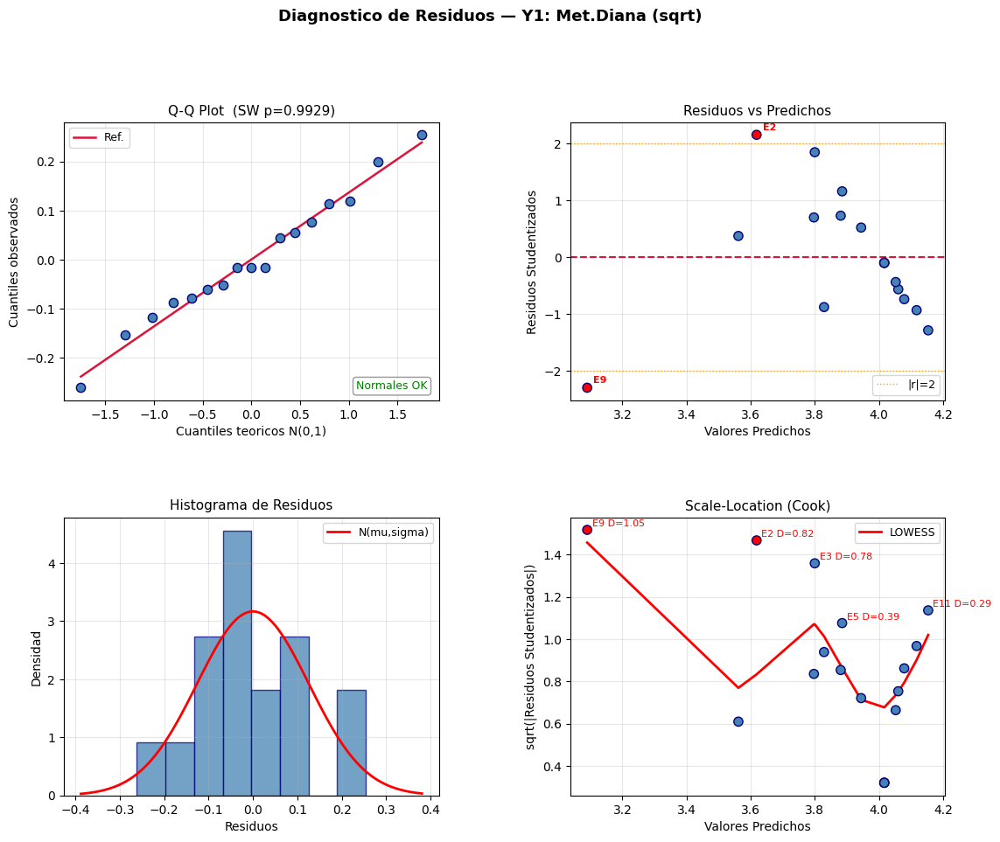

  R2     = 0.8035   R2-adj = 0.5508
  F_reg  = 3.1795  F_crit=3.677  p=0.07069    no sig.
  F_lof  = N/A  (replicas centrales identicas — SS_pe=0)
  SW_p   = 0.9929    Residuos normales
  Outliers (|r|>2): ['E2', 'E9']
  Influyentes Cook: ['E2(D=0.818)', 'E3(D=0.781)', 'E5(D=0.393)', 'E9(D=1.054)', 'E11(D=0.287)']

Termino  Coeficiente  Std_Error  t_valor  p_valor Sig
     b0     4.018145   0.107574  37.3525 0.000000 ***
     x1     0.117725   0.060383   1.9496 0.092216    
     x2    -0.028314   0.052973  -0.5345 0.609547    
     x3    -0.015793   0.052279  -0.3021 0.771361    
   x1^2    -0.262478   0.073443  -3.5739 0.009049  **
   x2^2     0.029864   0.055996   0.5333 0.610318    
   x3^2     0.026599   0.053098   0.5009 0.631778    
   x1x2    -0.014741   0.069420  -0.2123 0.837889    
   x1x3     0.088495   0.069335   1.2763 0.242551    
   x2x3    -0.014860   0.069275  -0.2145 0.836264    
  -> Excel: RSM_Resultados\Y1\Y1_RSM_resultados.xlsx

  Y2: Y2_MetabTotales_SQRT


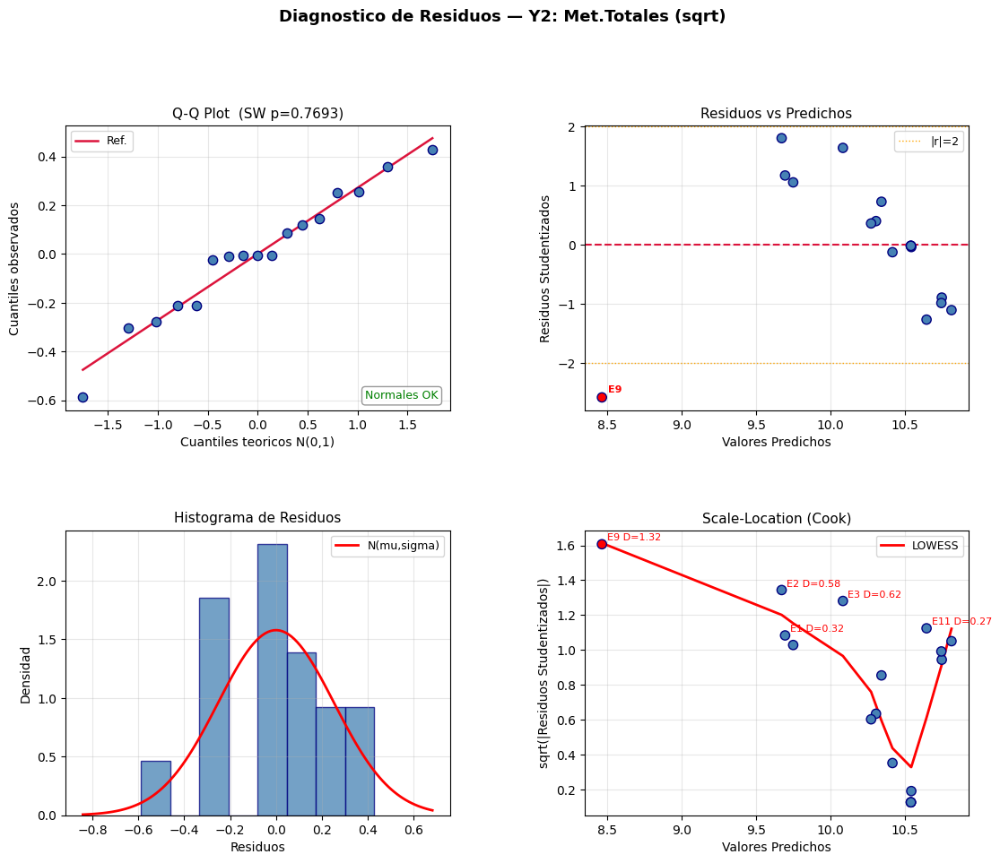

  R2     = 0.8341   R2-adj = 0.6209
  F_reg  = 3.9114  F_crit=3.677  p=0.04291    SIGNIFICATIVO
  F_lof  = N/A  (replicas centrales identicas — SS_pe=0)
  SW_p   = 0.7693    Residuos normales
  Outliers (|r|>2): ['E9']
  Influyentes Cook: ['E1(D=0.316)', 'E2(D=0.575)', 'E3(D=0.617)', 'E9(D=1.323)', 'E11(D=0.275)']

Termino  Coeficiente  Std_Error  t_valor  p_valor Sig
     b0    10.543528   0.215892  48.8370 0.000000 ***
     x1     0.301350   0.121184   2.4867 0.041797   *
     x2     0.037912   0.106314   0.3566 0.731892    
     x3    -0.033501   0.104921  -0.3193 0.758817    
   x1^2    -0.574698   0.147394  -3.8991 0.005906  **
   x2^2     0.054198   0.112381   0.4823 0.644325    
   x3^2     0.078021   0.106564   0.7322 0.487860    
   x1x2    -0.078757   0.139321  -0.5653 0.589522    
   x1x3     0.055932   0.139151   0.4020 0.699710    
   x2x3    -0.077794   0.139029  -0.5596 0.593230    
  -> Excel: RSM_Resultados\Y2\Y2_RSM_resultados.xlsx

  Y3: Y3_RSD_Todos_SQRT


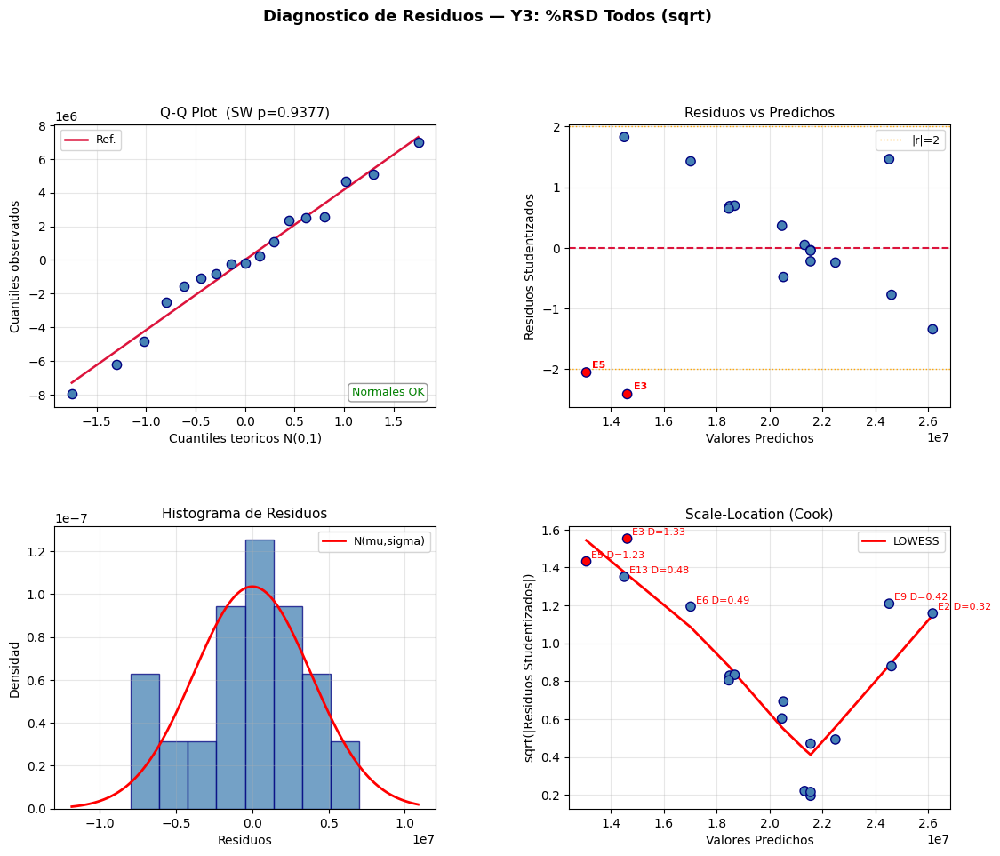

  R2     = 0.4635   R2-adj = -0.2262
  F_reg  = 0.6720  F_crit=3.677  p=0.71680    no sig.
  F_lof  = 186.1719  F_crit=19.296  p=0.00535    LOF SIGNIFICATIVO
  SW_p   = 0.9377    Residuos normales
  Outliers (|r|>2): ['E3', 'E5']
  Influyentes Cook: ['E2(D=0.317)', 'E3(D=1.329)', 'E5(D=1.233)', 'E6(D=0.486)', 'E9(D=0.424)', 'E13(D=0.480)']

Termino   Coeficiente    Std_Error  t_valor  p_valor Sig
     b0  2.137235e+07 3.291831e+06   6.4925 0.000336 ***
     x1 -8.257983e+05 1.847763e+06  -0.4469 0.668434    
     x2 -6.972354e+04 1.621029e+06  -0.0430 0.966893    
     x3  1.957228e+06 1.599787e+06   1.2234 0.260749    
   x1^2  5.925629e+05 2.247400e+06   0.2637 0.799631    
   x2^2 -1.033119e+06 1.713533e+06  -0.6029 0.565577    
   x3^2 -1.313897e+06 1.624839e+06  -0.8086 0.445336    
   x1x2  3.821707e+06 2.124300e+06   1.7990 0.115046    
   x1x3  6.765225e+04 2.121714e+06   0.0319 0.975453    
   x2x3  4.862531e+04 2.119859e+06   0.0229 0.982340    
  -> Excel: RSM_Resultados\Y3\

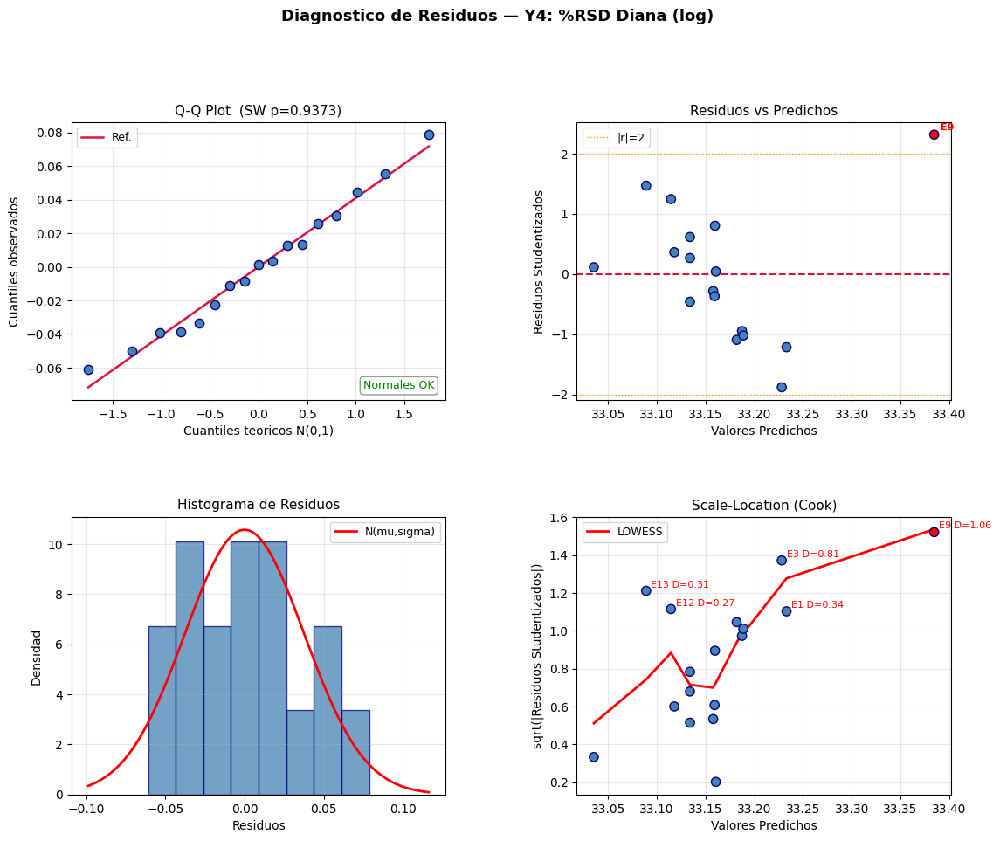

  R2     = 0.7853   R2-adj = 0.5094
  F_reg  = 2.8457  F_crit=3.677  p=0.09091    no sig.
  F_lof  = 6.2422  F_crit=19.296  p=0.14382    LOF no sig. OK
  SW_p   = 0.9373    Residuos normales
  Outliers (|r|>2): ['E9']
  Influyentes Cook: ['E1(D=0.338)', 'E3(D=0.809)', 'E9(D=1.062)', 'E12(D=0.265)', 'E13(D=0.309)']

Termino  Coeficiente  Std_Error   t_valor  p_valor Sig
     b0    33.135435   0.032219 1028.4329 0.000000 ***
     x1    -0.024159   0.018085   -1.3358 0.223403    
     x2    -0.000994   0.015866   -0.0626 0.951808    
     x3    -0.011109   0.015658   -0.7095 0.500973    
   x1^2     0.077791   0.021997    3.5364 0.009515  **
   x2^2    -0.006144   0.016771   -0.3663 0.724940    
   x3^2    -0.023501   0.015903   -1.4778 0.182996    
   x1x2     0.001575   0.020792    0.0758 0.941729    
   x1x3     0.011873   0.020767    0.5718 0.585369    
   x2x3    -0.000141   0.020748   -0.0068 0.994782    
  -> Excel: RSM_Resultados\Y4\Y4_RSM_resultados.xlsx

  Y5: Y5_Indol_SQRT


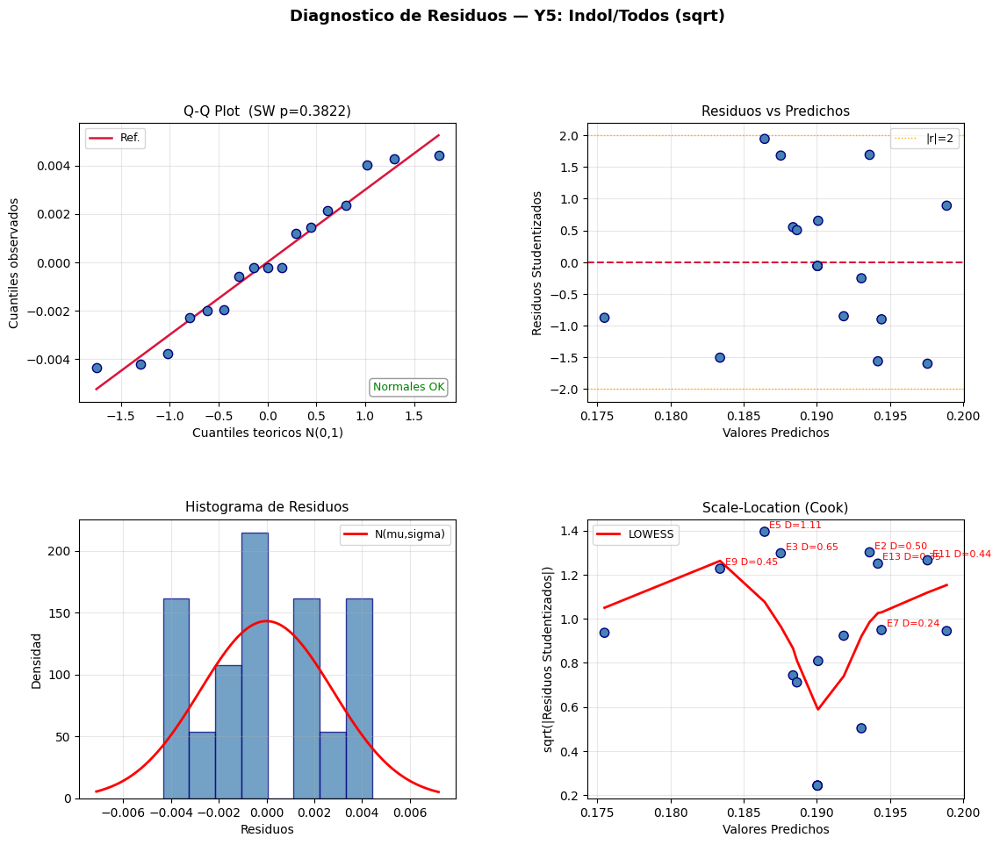

  R2     = 0.7825   R2-adj = 0.5028
  F_reg  = 2.7976  F_crit=3.677  p=0.09439    no sig.
  F_lof  = N/A  (replicas centrales identicas — SS_pe=0)
  SW_p   = 0.3822    Residuos normales
  Influyentes Cook: ['E2(D=0.505)', 'E3(D=0.647)', 'E5(D=1.107)', 'E7(D=0.237)', 'E9(D=0.449)', 'E11(D=0.440)', 'E13(D=0.351)']

Termino  Coeficiente  Std_Error  t_valor  p_valor Sig
     b0     0.190208   0.002380  79.9137 0.000000 ***
     x1     0.001279   0.001336   0.9570 0.370439    
     x2    -0.002532   0.001172  -2.1600 0.067603    
     x3    -0.001660   0.001157  -1.4352 0.194369    
   x1^2    -0.001502   0.001625  -0.9241 0.386164    
   x2^2     0.001011   0.001239   0.8163 0.441220    
   x3^2     0.000439   0.001175   0.3736 0.719786    
   x1x2     0.004830   0.001536   3.1448 0.016270   *
   x1x3     0.002667   0.001534   1.7387 0.125653    
   x2x3    -0.001695   0.001533  -1.1056 0.305428    
  -> Excel: RSM_Resultados\Y5\Y5_RSM_resultados.xlsx

  Y6: Y6_Cresol_LOG


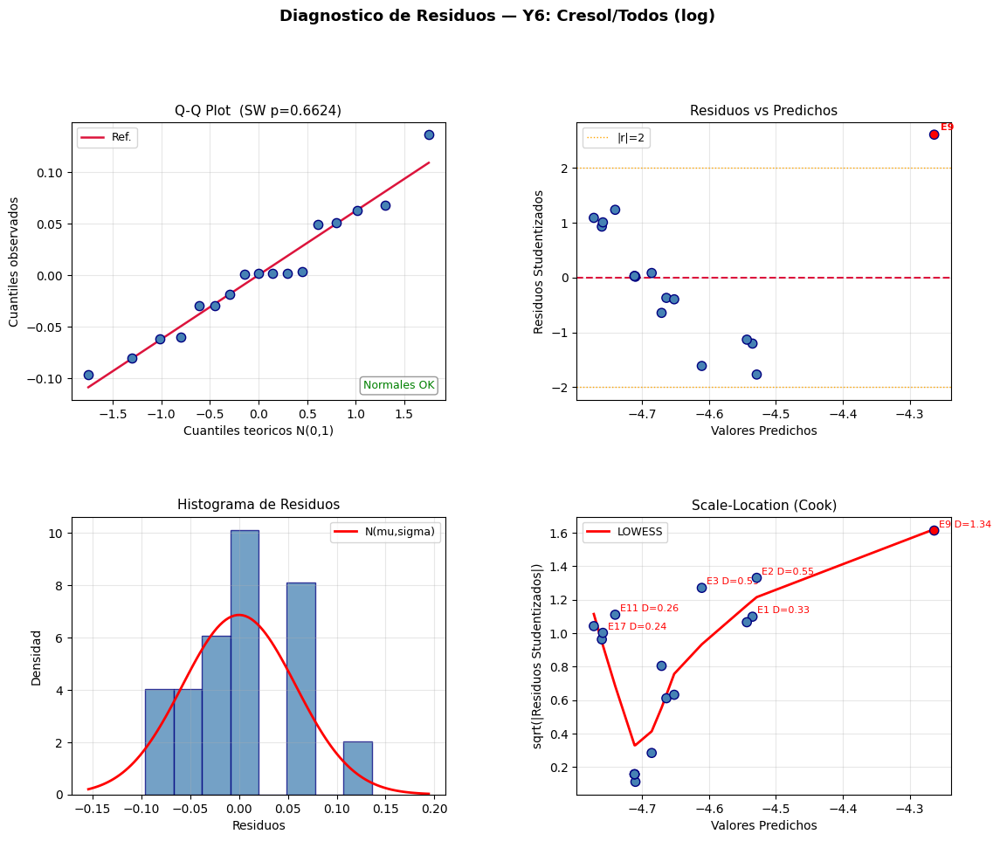

  R2     = 0.8160   R2-adj = 0.5795
  F_reg  = 3.4497  F_crit=3.677  p=0.05833    no sig.
  F_lof  = N/A  (replicas centrales identicas — SS_pe=0)
  SW_p   = 0.6624    Residuos normales
  Outliers (|r|>2): ['E9']
  Influyentes Cook: ['E1(D=0.332)', 'E2(D=0.551)', 'E3(D=0.595)', 'E9(D=1.342)', 'E11(D=0.260)', 'E17(D=0.241)']

Termino  Coeficiente  Std_Error  t_valor  p_valor Sig
     b0    -4.711909   0.049589 -95.0200 0.000000 ***
     x1    -0.064092   0.027835  -2.3026 0.054783    
     x2    -0.007395   0.024419  -0.3028 0.770823    
     x3     0.007069   0.024099   0.2933 0.777763    
   x1^2     0.124482   0.033855   3.6769 0.007892  **
   x2^2    -0.013491   0.025813  -0.5226 0.617360    
   x3^2    -0.017680   0.024477  -0.7223 0.493530    
   x1x2     0.015272   0.032001   0.4772 0.647739    
   x1x3    -0.011360   0.031962  -0.3554 0.732736    
   x2x3     0.015279   0.031934   0.4785 0.646906    
  -> Excel: RSM_Resultados\Y6\Y6_RSM_resultados.xlsx

  Y7: Y7_Metional_LOG


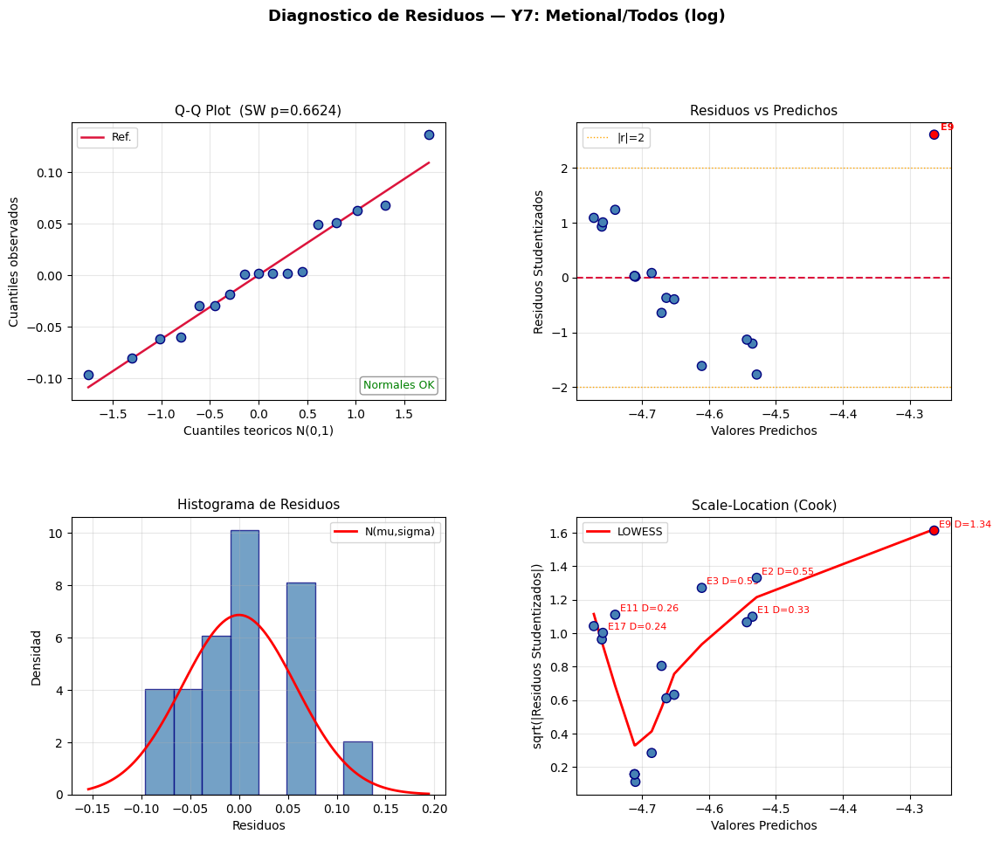

  R2     = 0.8160   R2-adj = 0.5795
  F_reg  = 3.4497  F_crit=3.677  p=0.05833    no sig.
  F_lof  = N/A  (replicas centrales identicas — SS_pe=0)
  SW_p   = 0.6624    Residuos normales
  Outliers (|r|>2): ['E9']
  Influyentes Cook: ['E1(D=0.332)', 'E2(D=0.551)', 'E3(D=0.595)', 'E9(D=1.342)', 'E11(D=0.260)', 'E17(D=0.241)']

Termino  Coeficiente  Std_Error  t_valor  p_valor Sig
     b0    -4.711909   0.049589 -95.0200 0.000000 ***
     x1    -0.064092   0.027835  -2.3026 0.054783    
     x2    -0.007395   0.024419  -0.3028 0.770823    
     x3     0.007069   0.024099   0.2933 0.777763    
   x1^2     0.124482   0.033855   3.6769 0.007892  **
   x2^2    -0.013491   0.025813  -0.5226 0.617360    
   x3^2    -0.017680   0.024477  -0.7223 0.493530    
   x1x2     0.015272   0.032001   0.4772 0.647739    
   x1x3    -0.011360   0.031962  -0.3554 0.732736    
   x2x3     0.015279   0.031934   0.4785 0.646906    
  -> Excel: RSM_Resultados\Y7\Y7_RSM_resultados.xlsx

  Y8: Y8_AcCarboxilicos_S

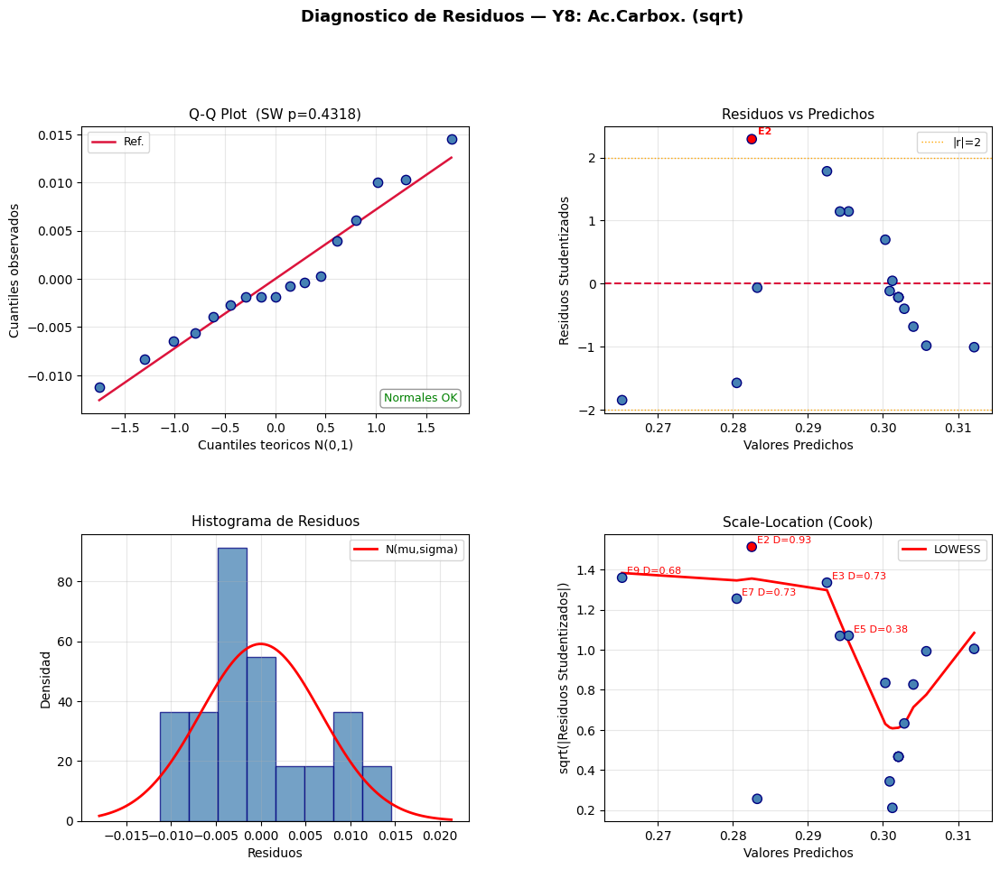

  R2     = 0.7386   R2-adj = 0.4026
  F_reg  = 2.1982  F_crit=3.677  p=0.15580    no sig.
  F_lof  = N/A  (replicas centrales identicas — SS_pe=0)
  SW_p   = 0.4318    Residuos normales
  Outliers (|r|>2): ['E2']
  Influyentes Cook: ['E2(D=0.927)', 'E3(D=0.728)', 'E5(D=0.385)', 'E7(D=0.728)', 'E9(D=0.680)']

Termino  Coeficiente  Std_Error  t_valor  p_valor Sig
     b0     0.302033   0.005765  52.3920 0.000000 ***
     x1     0.002808   0.003236   0.8678 0.414255    
     x2    -0.003544   0.002839  -1.2485 0.251983    
     x3     0.000265   0.002802   0.0944 0.927403    
   x1^2    -0.011325   0.003936  -2.8774 0.023741   *
   x2^2     0.001543   0.003001   0.5142 0.622970    
   x3^2     0.000453   0.002846   0.1591 0.878077    
   x1x2    -0.001548   0.003720  -0.4161 0.689795    
   x1x3     0.007268   0.003716   1.9560 0.091357    
   x2x3     0.002359   0.003712   0.6354 0.545355    
  -> Excel: RSM_Resultados\Y8\Y8_RSM_resultados.xlsx

  Y9: Y9_DianasTotales_SQRT


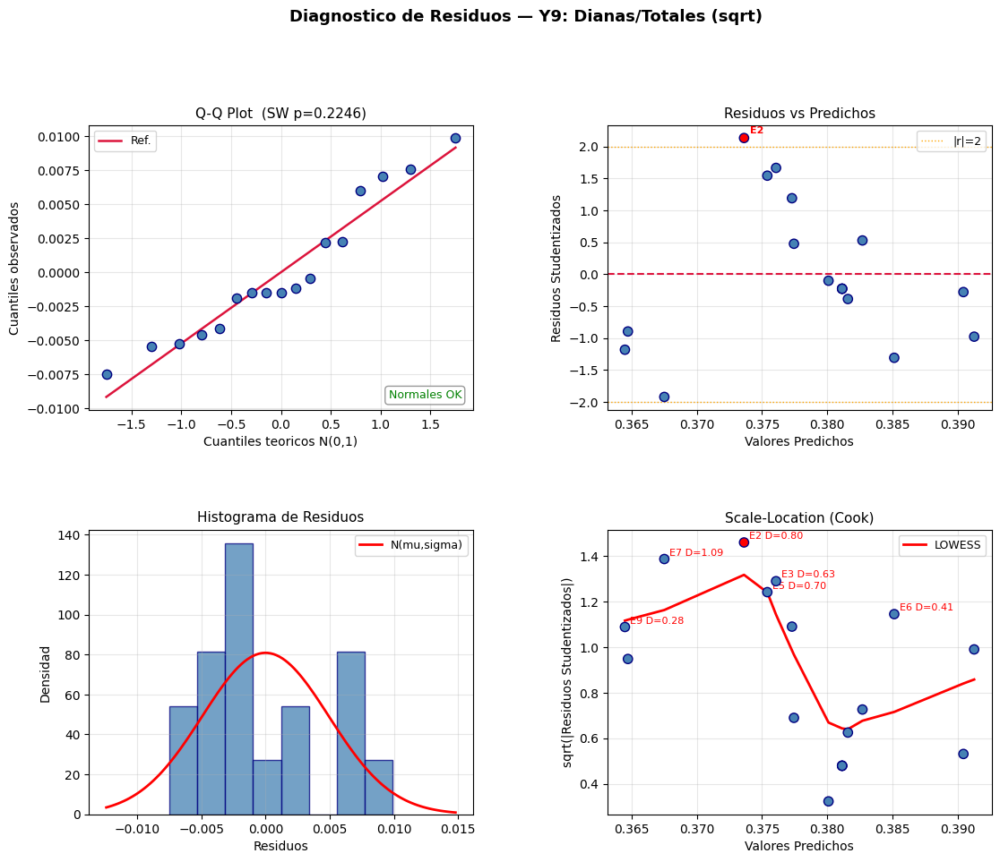

  R2     = 0.6963   R2-adj = 0.3058
  F_reg  = 1.7829  F_crit=3.677  p=0.22903    no sig.
  F_lof  = N/A  (replicas centrales identicas — SS_pe=0)
  SW_p   = 0.2246    Residuos normales
  Outliers (|r|>2): ['E2']
  Influyentes Cook: ['E2(D=0.802)', 'E3(D=0.634)', 'E5(D=0.697)', 'E6(D=0.412)', 'E7(D=1.086)', 'E9(D=0.279)']

Termino  Coeficiente  Std_Error  t_valor  p_valor Sig
     b0     0.381181   0.004213  90.4753 0.000000 ***
     x1     0.000737   0.002365   0.3116 0.764396    
     x2    -0.004201   0.002075  -2.0251 0.082508    
     x3    -0.000407   0.002048  -0.1989 0.847968    
   x1^2    -0.005246   0.002876  -1.8238 0.110949    
   x2^2     0.001113   0.002193   0.5076 0.627333    
   x3^2    -0.000099   0.002080  -0.0476 0.963383    
   x1x2     0.001617   0.002719   0.5949 0.570631    
   x1x3     0.006639   0.002716   2.4448 0.044442   *
   x2x3     0.001366   0.002713   0.5034 0.630125    
  -> Excel: RSM_Resultados\Y9\Y9_RSM_resultados.xlsx

   ANALISIS COMPLETO — TODA

In [29]:
# ============================================================
# CELDA 5: BUCLE PRINCIPAL — Y1 a Y9
# ============================================================

summary_rows = []

for col, label, short in zip(Y_COLS, Y_LABELS, Y_SHORT):

    print(f'\n{"="*65}')
    print(f'  {short}: {col}')
    print('='*65)

    y_dir = os.path.join(OUT_DIR, short)
    os.makedirs(y_dir, exist_ok=True)

    y = df_y[col].values.astype(float)

    # ---- PARTE 4.1: Ajuste -----------------------------------------
    res  = fit_rsm(X_matrix, y)

    # ---- PARTE 4.2: ANOVA + LOF ------------------------------------
    anov = compute_anova_lof(res, y, CENTER_IDX)

    # ---- PARTE 4.3: Diagnósticos -----------------------------------
    fig_path = os.path.join(y_dir, f'{short}_diagnosticos.png')
    diag = compute_diagnostics(res, y, label, fig_path)

    # ---- PARTE 4.4: Tabla coeficientes -----------------------------
    df_coef = build_coef_table(res)

    # ---- Impresión resumen -----------------------------------------
    print(f'  R2     = {res.rsquared:.4f}   R2-adj = {res.rsquared_adj:.4f}')
    print(f'  F_reg  = {anov["F_reg"]:.4f}  F_crit={anov["F_crit_reg"]:.3f}  p={anov["p_reg"]:.5f}  '
          f'  {"SIGNIFICATIVO" if anov["p_reg"]<0.05 else "no sig."}')
    if anov['lof_estimable']:
        print(f'  F_lof  = {anov["F_lof"]:.4f}  F_crit={anov["F_crit_lof"]:.3f}  p={anov["p_lof"]:.5f}  '
              f'  {"LOF no sig. OK" if anov["p_lof"]>0.05 else "LOF SIGNIFICATIVO"}')
    else:
        print(f'  F_lof  = N/A  (replicas centrales identicas — SS_pe=0)')
    print(f'  SW_p   = {diag["sw_p"]:.4f}  '
          f'  {"Residuos normales" if diag["sw_p"]>0.05 else "NO normales"}')
    if len(diag['outlier_idx']) > 0:
        exps = [f'E{i+1}' for i in diag['outlier_idx']]
        print(f'  Outliers (|r|>2): {exps}')
    if len(diag['cook_idx']) > 0:
        exps = [f'E{i+1}(D={diag["cooks_d"][i]:.3f})' for i in diag['cook_idx']]
        print(f'  Influyentes Cook: {exps}')
    print()
    print(df_coef[['Termino','Coeficiente','Std_Error','t_valor','p_valor','Sig']].to_string(index=False))

    # ---- ANOVA DataFrames para exportar ----------------------------
    anov_basic_df = pd.DataFrame([
        {'Fuente':'Regresion',
         'SS': round(anov['SS_reg'],6), 'gl': anov['df_reg'],
         'MS': round(anov['MS_reg'],6), 'F':  round(anov['F_reg'],4),
         'p_valor': round(anov['p_reg'],6),
         'Decision': 'Significativo' if anov['p_reg']<0.05 else 'No sig.'},
        {'Fuente':'Residual',
         'SS': round(anov['SS_res'],6), 'gl': anov['df_res'],
         'MS': round(anov['MS_res'],6), 'F':'', 'p_valor':'', 'Decision':''},
        {'Fuente':'Total',
         'SS': round(anov['SS_tot'],6), 'gl': anov['df_tot'],
         'MS':'', 'F':'', 'p_valor':'', 'Decision':''},
    ])

    if anov['lof_estimable']:
        lof_f   = round(anov['F_lof'], 4)
        lof_p   = round(anov['p_lof'], 6)
        lof_dec = 'LOF no sig. OK' if anov['p_lof']>0.05 else 'LOF SIGNIFICATIVO'
    else:
        lof_f = lof_p = 'N/A'
        lof_dec = 'Replicas identicas — no estimable'

    anov_lof_df = pd.DataFrame([
        {'Fuente':'Lack of Fit',
         'SS': round(anov['SS_lof'],6), 'gl': anov['df_lof'],
         'MS': round(anov['MS_lof'],6), 'F':  lof_f,
         'p_valor': lof_p, 'Decision': lof_dec},
        {'Fuente':'Error Puro',
         'SS': round(anov['SS_pe'],6),  'gl': anov['df_pe'],
         'MS': round(anov['MS_pe'],6),  'F':'', 'p_valor':'', 'Decision':''},
        {'Fuente':'Residual (total)',
         'SS': round(anov['SS_res'],6), 'gl': anov['df_res'],
         'MS':'', 'F':'', 'p_valor':'', 'Decision':''},
    ])

    # ---- PARTE 5: Exportar a Excel ---------------------------------
    excel_path = os.path.join(y_dir, f'{short}_RSM_resultados.xlsx')
    metrics_df = pd.DataFrame([
        {'Metrica':'R2',         'Valor': round(res.rsquared,     6)},
        {'Metrica':'R2_adj',     'Valor': round(res.rsquared_adj, 6)},
        {'Metrica':'F_reg',      'Valor': round(anov['F_reg'],     4)},
        {'Metrica':'p_reg',      'Valor': round(anov['p_reg'],     6)},
        {'Metrica':'F_crit_reg', 'Valor': round(anov['F_crit_reg'],4)},
        {'Metrica':'F_lof',      'Valor': lof_f},
        {'Metrica':'p_lof',      'Valor': lof_p},
        {'Metrica':'F_crit_lof', 'Valor': round(anov['F_crit_lof'],4)},
        {'Metrica':'SW_stat',    'Valor': round(diag['sw_stat'],   6)},
        {'Metrica':'SW_p',       'Valor': round(diag['sw_p'],      6)},
        {'Metrica':'Modelo_OK',  'Valor':
            'SI' if (anov['p_reg']<0.05 and diag['sw_p']>0.05) else 'REVISAR'},
    ])
    with pd.ExcelWriter(excel_path, engine='openpyxl') as writer:
        df_coef.to_excel(      writer, sheet_name='Coeficientes', index=False)
        anov_basic_df.to_excel(writer, sheet_name='ANOVA_basico', index=False)
        anov_lof_df.to_excel(  writer, sheet_name='ANOVA_LOF',    index=False)
        metrics_df.to_excel(   writer, sheet_name='Metricas',      index=False)
    print(f'  -> Excel: {excel_path}')

    # ---- Acumular para resumen -------------------------------------
    sig_terms = df_coef[df_coef['Sig'] != '']['Termino'].tolist()
    if anov['lof_estimable']:
        lof_ok_str  = 'OK' if anov['p_lof'] > 0.05 else 'LOF!'
        p_lof_str   = round(anov['p_lof'], 4)
        f_lof_str   = round(anov['F_lof'], 4)
    else:
        lof_ok_str = 'N/A'
        p_lof_str  = 'N/A'
        f_lof_str  = 'N/A'

    summary_rows.append({
        'Y':           short,
        'R2':          round(res.rsquared,     4),
        'R2_adj':      round(res.rsquared_adj, 4),
        'F_reg':       round(anov['F_reg'],    4),
        'p_reg':       round(anov['p_reg'],    4),
        'F_lof':       f_lof_str,
        'p_lof':       p_lof_str,
        'SW_p':        round(diag['sw_p'],     4),
        'Mod_sig':     'SI'   if anov['p_reg'] < 0.05 else 'NO',
        'LOF_status':  lof_ok_str,
        'Res_normal':  'SI'   if diag['sw_p'] > 0.05  else 'NO',
        'Terminos_sig':  ', '.join(sig_terms) if sig_terms else '—',
        'Modelo_OK':   'SI'   if (anov['p_reg']<0.05 and diag['sw_p']>0.05) else 'REVISAR'
    })

print('\n' + '='*65)
print('   ANALISIS COMPLETO — TODAS LAS RESPUESTAS PROCESADAS')
print('='*65)

In [30]:
# ============================================================
# CELDA 6: TABLA MAESTRA COMPARATIVA
# ============================================================

df_summary = pd.DataFrame(summary_rows)

print('\n' + '='*85)
print('  TABLA MAESTRA — COMPARACION DE LAS 9 RESPUESTAS RSM')
print('='*85)
cols_show = ['Y','R2','R2_adj','F_reg','p_reg','F_lof','p_lof',
             'SW_p','Mod_sig','LOF_status','Res_normal','Modelo_OK']
print(df_summary[cols_show].to_string(index=False))

print('\nTerminos significativos (p<0.05) por variable:')
for _, row in df_summary.iterrows():
    print(f'  {row["Y"]:3s}: {row["Terminos_sig"]}')

# Exportar
summary_path = os.path.join(OUT_DIR, 'Resumen_Comparativo_RSM.xlsx')
df_summary.to_excel(summary_path, index=False)
print(f'\nTabla maestra -> {summary_path}')


  TABLA MAESTRA — COMPARACION DE LAS 9 RESPUESTAS RSM
 Y     R2  R2_adj  F_reg  p_reg     F_lof   p_lof   SW_p Mod_sig LOF_status Res_normal Modelo_OK
Y1 0.8035  0.5508 3.1795 0.0707       N/A     N/A 0.9929      NO        N/A         SI   REVISAR
Y2 0.8341  0.6209 3.9114 0.0429       N/A     N/A 0.7693      SI        N/A         SI        SI
Y3 0.4635 -0.2262 0.6720 0.7168  186.1719  0.0054 0.9377      NO       LOF!         SI   REVISAR
Y4 0.7853  0.5094 2.8457 0.0909    6.2422  0.1438 0.9373      NO         OK         SI   REVISAR
Y5 0.7825  0.5028 2.7976 0.0944       N/A     N/A 0.3822      NO        N/A         SI   REVISAR
Y6 0.8160  0.5795 3.4497 0.0583       N/A     N/A 0.6624      NO        N/A         SI   REVISAR
Y7 0.8160  0.5795 3.4497 0.0583       N/A     N/A 0.6624      NO        N/A         SI   REVISAR
Y8 0.7386  0.4026 2.1982 0.1558       N/A     N/A 0.4318      NO        N/A         SI   REVISAR
Y9 0.6963  0.3058 1.7829 0.2290       N/A     N/A 0.2246      NO        

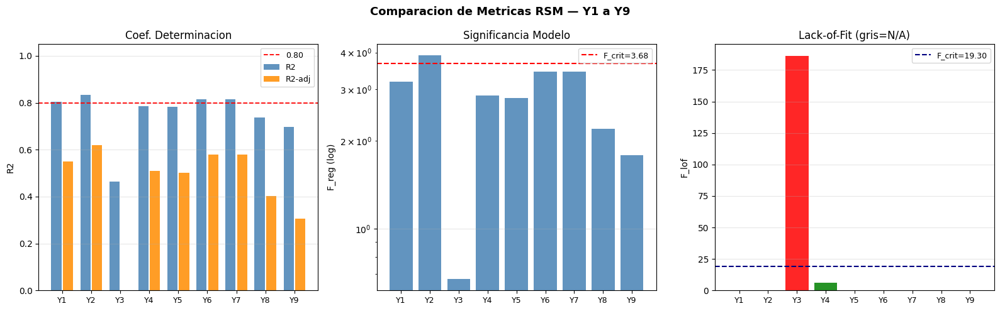

Figura comparativa -> RSM_Resultados\Comparacion_RSM.png


In [31]:
# ============================================================
# CELDA 7: FIGURA COMPARATIVA R², F_reg, F_lof
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle('Comparacion de Metricas RSM — Y1 a Y9',
             fontsize=13, fontweight='bold')

xi = np.arange(len(Y_SHORT))

# ---- R² y R²-adj -------------------------------------------
r2     = df_summary['R2'].values.astype(float)
r2_adj = df_summary['R2_adj'].values.astype(float)
axes[0].bar(xi - 0.2, r2,     0.35, label='R2',     color='steelblue',  alpha=0.85)
axes[0].bar(xi + 0.2, r2_adj, 0.35, label='R2-adj', color='darkorange', alpha=0.85)
axes[0].axhline(0.80, color='red', ls='--', lw=1.3, label='0.80')
axes[0].set_xticks(xi); axes[0].set_xticklabels(Y_SHORT, fontsize=9)
axes[0].set_ylim(0, 1.05)
axes[0].set_ylabel('R2'); axes[0].set_title('Coef. Determinacion')
axes[0].legend(fontsize=9); axes[0].grid(axis='y', alpha=0.3)

# ---- F_reg (log) -------------------------------------------
f_reg_v = df_summary['F_reg'].values.astype(float)
axes[1].bar(xi, f_reg_v, color='steelblue', alpha=0.85)
f_cr = float(f_dist.ppf(0.95, 9, 7))
axes[1].axhline(f_cr, color='red', ls='--', lw=1.5, label=f'F_crit={f_cr:.2f}')
axes[1].set_xticks(xi); axes[1].set_xticklabels(Y_SHORT, fontsize=9)
axes[1].set_yscale('log')
axes[1].set_ylabel('F_reg (log)'); axes[1].set_title('Significancia Modelo')
axes[1].legend(fontsize=9); axes[1].grid(axis='y', alpha=0.3)

# ---- F_lof (solo Y3, Y4 con LOF estimable) -----------------
lof_vals   = []
lof_colors = []
for _, row in df_summary.iterrows():
    fv = row['F_lof']
    pv = row['p_lof']
    if fv == 'N/A':
        lof_vals.append(0)
        lof_colors.append('gray')
    else:
        lof_vals.append(float(fv))
        lof_colors.append('green' if float(pv) > 0.05 else 'red')

axes[2].bar(xi, lof_vals, color=lof_colors, alpha=0.85)
f_cl = float(f_dist.ppf(0.95, 5, 2))
axes[2].axhline(f_cl, color='navy', ls='--', lw=1.5, label=f'F_crit={f_cl:.2f}')
axes[2].set_xticks(xi); axes[2].set_xticklabels(Y_SHORT, fontsize=9)
axes[2].set_ylabel('F_lof'); axes[2].set_title('Lack-of-Fit (gris=N/A)')
axes[2].legend(fontsize=9); axes[2].grid(axis='y', alpha=0.3)

plt.tight_layout()
comp_fig = os.path.join(OUT_DIR, 'Comparacion_RSM.png')
plt.savefig(comp_fig, dpi=150, bbox_inches='tight')
plt.show()          # <-- mostrar inline en el notebook
plt.close(fig)
print(f'Figura comparativa -> {comp_fig}')

In [32]:
# ============================================================
# CELDA 8: TABLAS ANOVA DETALLADAS (impresion en pantalla)
# ============================================================

print('TABLAS ANOVA COMPLETAS — n=17, p=10')
print('df_reg=9, df_res=7, df_tot=16 | df_lof=5, df_pe=2')

for col, short in zip(Y_COLS, Y_SHORT):
    y   = df_y[col].values.astype(float)
    res  = fit_rsm(X_matrix, y)
    anov = compute_anova_lof(res, y, CENTER_IDX)

    h = '-' * 62
    print(f'\n{h}')
    print(f'  {short}  |  R2={res.rsquared:.4f}  R2-adj={res.rsquared_adj:.4f}')
    print(h)
    print(f'  {"Fuente":<16} {"SS":>12} {"gl":>4} {"MS":>13} {"F":>9} {"p":>10}')
    print(f'  {"-"*58}')
    print(f'  {"Regresion":<16} {anov["SS_reg"]:>12.6f} {anov["df_reg"]:>4d} '
          f'{anov["MS_reg"]:>13.6f} {anov["F_reg"]:>9.4f} {anov["p_reg"]:>10.5f}')
    print(f'  {"Residual":<16} {anov["SS_res"]:>12.6f} {anov["df_res"]:>4d} '
          f'{anov["MS_res"]:>13.6f}')
    print(f'  {"Total":<16} {anov["SS_tot"]:>12.6f} {anov["df_tot"]:>4d}')
    sig_reg = 'SIGNIFICATIVO ✓' if anov['p_reg'] < 0.05 else 'No sig. ✗'
    print(f'  F_reg={anov["F_reg"]:.4f} vs F_crit={anov["F_crit_reg"]:.3f} → {sig_reg}')
    print()
    print(f'  Desglose residual:')
    print(f'  {"Fuente":<16} {"SS":>12} {"gl":>4} {"MS":>13} {"F":>9} {"p":>10}')
    print(f'  {"-"*58}')
    if anov['lof_estimable']:
        print(f'  {"Lack of Fit":<16} {anov["SS_lof"]:>12.6f} {anov["df_lof"]:>4d} '
              f'{anov["MS_lof"]:>13.6f} {anov["F_lof"]:>9.4f} {anov["p_lof"]:>10.5f}')
        lof_dec = 'LOF no sig. ✓' if anov['p_lof'] > 0.05 else 'LOF SIGNIFICATIVO ✗'
        print(f'  {"Error Puro":<16} {anov["SS_pe"]:>12.6f} {anov["df_pe"]:>4d} '
              f'{anov["MS_pe"]:>13.6f}')
        print(f'  F_lof={anov["F_lof"]:.4f} vs F_crit={anov["F_crit_lof"]:.3f} → {lof_dec}')
    else:
        print(f'  {"Lack of Fit":<16} {anov["SS_lof"]:>12.6f} {anov["df_lof"]:>4d} '
              f'{anov["MS_lof"]:>13.6f}   N/A        N/A')
        print(f'  {"Error Puro":<16} {anov["SS_pe"]:>12.6f} {anov["df_pe"]:>4d}   0.000000')
        print(f'  F_lof = N/A  (SS_pe=0: replicas identicas → LOF no estimable)')

TABLAS ANOVA COMPLETAS — n=17, p=10
df_reg=9, df_res=7, df_tot=16 | df_lof=5, df_pe=2

--------------------------------------------------------------
  Y1  |  R2=0.8035  R2-adj=0.5508
--------------------------------------------------------------
  Fuente                     SS   gl            MS         F          p
  ----------------------------------------------------------
  Regresion            1.103207    9      0.122579    3.1795    0.07069
  Residual             0.269871    7      0.038553
  Total                1.373078   16
  F_reg=3.1795 vs F_crit=3.677 → No sig. ✗

  Desglose residual:
  Fuente                     SS   gl            MS         F          p
  ----------------------------------------------------------
  Lack of Fit          0.269871    5      0.053974   N/A        N/A
  Error Puro           0.000000    2   0.000000
  F_lof = N/A  (SS_pe=0: replicas identicas → LOF no estimable)

--------------------------------------------------------------
  Y2  |  R2=0.8341

In [33]:
# ============================================================
# CELDA 9: TABLAS DE COEFICIENTES COMPLETAS
# ============================================================

print('TABLAS DE COEFICIENTES — RSM Cuadratico')
print('Significancia: *** p<0.001  ** p<0.01  * p<0.05')

for col, short in zip(Y_COLS, Y_SHORT):
    y   = df_y[col].values.astype(float)
    res = fit_rsm(X_matrix, y)
    df_c = build_coef_table(res)

    print(f'\n{"─"*72}')
    print(f'  {short} | {col}')
    print(f'  R2={res.rsquared:.4f}   R2-adj={res.rsquared_adj:.4f}')
    print(f'  {"─"*68}')
    print(f'  {"Termino":<8} {"Coef":>13} {"Std Err":>12} {"t":>9} {"p":>11} {"Sig":>5}')
    print(f'  {"─"*62}')
    for _, row in df_c.iterrows():
        mark = ' <' if row['Sig'] != '' else ''
        print(f'  {row["Termino"]:<8} {row["Coeficiente"]:>13.6f} '
              f'{row["Std_Error"]:>12.6f} {row["t_valor"]:>9.4f} '
              f'{row["p_valor"]:>11.6f} {row["Sig"]:>5}{mark}')

TABLAS DE COEFICIENTES — RSM Cuadratico
Significancia: *** p<0.001  ** p<0.01  * p<0.05

────────────────────────────────────────────────────────────────────────
  Y1 | Y1_MetabDiana_SQRT
  R2=0.8035   R2-adj=0.5508
  ────────────────────────────────────────────────────────────────────
  Termino           Coef      Std Err         t           p   Sig
  ──────────────────────────────────────────────────────────────
  b0            4.018145     0.107574   37.3525    0.000000   *** <
  x1            0.117725     0.060383    1.9496    0.092216      
  x2           -0.028314     0.052973   -0.5345    0.609547      
  x3           -0.015793     0.052279   -0.3021    0.771361      
  x1^2         -0.262478     0.073443   -3.5739    0.009049    ** <
  x2^2          0.029864     0.055996    0.5333    0.610318      
  x3^2          0.026599     0.053098    0.5009    0.631778      
  x1x2         -0.014741     0.069420   -0.2123    0.837889      
  x1x3          0.088495     0.069335    1.2763   

In [34]:
# ============================================================
# CELDA 10: EXCEL MAESTRO CON TODAS LAS RESPUESTAS
# ============================================================

master_path = os.path.join(OUT_DIR, 'RSM_Completo_Todos_Y.xlsx')

with pd.ExcelWriter(master_path, engine='openpyxl') as writer:

    # Hoja 0: Diseño codificado
    df_design.to_excel(writer, sheet_name='Diseno_Codificado', index=False)

    # Hoja 1: Resumen comparativo
    df_summary.to_excel(writer, sheet_name='Resumen_Comparativo', index=False)

    # Una hoja de coeficientes + una de ANOVA por Y
    for col, short in zip(Y_COLS, Y_SHORT):
        y    = df_y[col].values.astype(float)
        res  = fit_rsm(X_matrix, y)
        anov = compute_anova_lof(res, y, CENTER_IDX)
        df_c = build_coef_table(res)

        df_c.to_excel(writer, sheet_name=f'{short}_Coef', index=False)

        if anov['lof_estimable']:
            lf, lp = round(anov['F_lof'],4), round(anov['p_lof'],6)
        else:
            lf, lp = 'N/A', 'N/A'

        anov_df = pd.DataFrame([
            {'Fuente':'Regresion',
             'SS':round(anov['SS_reg'],6),'gl':anov['df_reg'],
             'MS':round(anov['MS_reg'],6),'F':round(anov['F_reg'],4),
             'p':round(anov['p_reg'],6)},
            {'Fuente':'Residual',
             'SS':round(anov['SS_res'],6),'gl':anov['df_res'],
             'MS':round(anov['MS_res'],6),'F':'','p':''},
            {'Fuente':'Total',
             'SS':round(anov['SS_tot'],6),'gl':anov['df_tot'],
             'MS':'','F':'','p':''},
            {'Fuente':'---LOF---','SS':'','gl':'','MS':'','F':'','p':''},
            {'Fuente':'Lack of Fit',
             'SS':round(anov['SS_lof'],6),'gl':anov['df_lof'],
             'MS':round(anov['MS_lof'],6),'F':lf,'p':lp},
            {'Fuente':'Error Puro',
             'SS':round(anov['SS_pe'],6), 'gl':anov['df_pe'],
             'MS':round(anov['MS_pe'],6), 'F':'','p':''},
        ])
        anov_df.to_excel(writer, sheet_name=f'{short}_ANOVA', index=False)

print(f'Excel maestro -> {master_path}')

# ---- Resumen estructura de archivos ----------------------------
print(f'\nArchivos generados en {OUT_DIR}/')
for root, dirs, files in os.walk(OUT_DIR):
    lvl = root.replace(OUT_DIR, '').count(os.sep)
    indent = '  ' * lvl
    print(f'{indent}{os.path.basename(root)}/')
    for f in sorted(files):
        print(f'{indent}  {f}')

Excel maestro -> RSM_Resultados\RSM_Completo_Todos_Y.xlsx

Archivos generados en RSM_Resultados/
RSM_Resultados/
  Comparacion_RSM.png
  Desirabilidad_por_Experimento.png
  Fase6_Hessianos.png
  Fase7_Deseabilidades.png
  Fase7_Optimo_Global.png
  Fase7_Sensibilidad.png
  PredVsObs_Todas.png
  RSM_Completo_Todos_Y.xlsx
  Resultados_RSM_Fases567.xlsx
  Resumen_Comparativo_RSM.xlsx
  Y1_Pareto.png
  Y1_Superficies.png
  Y2_Pareto.png
  Y2_Superficies.png
  Y3_Pareto.png
  Y3_Superficies.png
  Y4_Pareto.png
  Y4_Superficies.png
  Y5_Indol_Interaccion.png
  Y5_Indol_Superficies.png
  Y5_Pareto.png
  Y5_Superficies.png
  Y6_Pareto.png
  Y6_Superficies.png
  Y7_Pareto.png
  Y7_Superficies.png
  Y8_Pareto.png
  Y8_Superficies.png
  Y9_Pareto.png
  Y9_Superficies.png
  Y1/
    Y1_RSM_resultados.xlsx
    Y1_diagnosticos.png
  Y2/
    Y2_RSM_resultados.xlsx
    Y2_diagnosticos.png
  Y3/
    Y3_RSM_resultados.xlsx
    Y3_diagnosticos.png
  Y4/
    Y4_RSM_resultados.xlsx
    Y4_diagnosticos.png
  

---
## Notas de interpretación

### Grados de libertad (n=17, p=10)
| Fuente | gl |
|--------|----|
| Regresión | 9 |
| Residual total | 7 |
| Total | 16 |
| Lack-of-Fit | 5 |
| Error Puro (3 réplicas) | 2 |

### Variables codificadas
| Factor | Real | Codificada |
|--------|------|------------|
| t extracción | 30–120 min | x₁ = (t − 75) / 45 |
| t desorción | 1–3 min | x₂ = (t − 2) / 1 |
| t incubación | 5–15 min | x₃ = (t − 10) / 5 |

### Criterios de validación
| Criterio | Condición | Interpretación |
|----------|-----------|----------------|
| Modelo significativo | p_reg < 0.05 | El modelo explica variabilidad real |
| LOF aceptable | p_lof > 0.05 | Forma cuadrática adecuada |
| LOF no estimable | SS_pe = 0 | Réplicas idénticas → no hay error puro |
| Normalidad residuos | SW p > 0.05 | Supuesto paramétrico cumplido |
| R² recomendado | R² > 0.80 | Buena capacidad predictiva |
| Outlier | \|r_std\| > 2 | Precaución; > 3 = outlier confirmado |
| Influyente (Cook) | D > 4/n ≈ 0.24 | Revisión necesaria |

---
# Análisis en Profundidad — Y₅: Indol/Todos

El indol es el único metabolito diana cuya fracción relativa está controlada por una **interacción significativa x₁×x₂** (t extracción × t desorción, p=0.016).  
Objetivo: encontrar las condiciones que **maximizan** la proporción Indol/Todos.

In [35]:
# ============================================================
# ANÁLISIS Y5 — COEFICIENTES Y OPTIMIZACIÓN
# ============================================================
import numpy as np, pandas as pd, statsmodels.api as sm
from scipy.stats import f as f_dist, shapiro
from scipy.optimize import differential_evolution
import warnings; warnings.filterwarnings('ignore')

# ---- Datos (reutiliza variables del bloque RSM anterior) ----
design_raw = pd.read_excel('Diseño Experimental.xlsx', header=0)
t_ext_d = design_raw.iloc[:, 2].values.astype(float)
t_des_d = design_raw.iloc[:, 3].values.astype(float)
t_inc_d = design_raw.iloc[:, 4].values.astype(float)
x1 = (t_ext_d - 75) / 45
x2 = (t_des_d -  2) /  1
x3 = (t_inc_d - 10) /  5
n_d = 17
X_d = np.column_stack([np.ones(n_d), x1, x2, x3,
                        x1**2, x2**2, x3**2, x1*x2, x1*x3, x2*x3])
TERMS_D = ['b0','x1','x2','x3','x1²','x2²','x3²','x1×x2','x1×x3','x2×x3']

df_y_d = pd.read_excel('datos_transformados.xlsx')
y5 = df_y_d['Y5_Indol_SQRT'].values.astype(float)
res5 = sm.OLS(y5, X_d).fit()
b = res5.params

# ---- Tabla de coeficientes ------------------------------------
print('=== Y5: Indol/Todos (transformada: √) ===')
print(f'R² = {res5.rsquared:.4f}   R²-adj = {res5.rsquared_adj:.4f}\n')
print(f"{'Término':<9} {'Coef':>12} {'Std Err':>11} {'t':>9} {'p':>10} {'Sig':>5}")
print('─' * 58)
for t, c, se, tv, pv in zip(TERMS_D, b, res5.bse, res5.tvalues, res5.pvalues):
    s = '***' if pv<0.001 else '**' if pv<0.01 else '*' if pv<0.05 else ''
    mark = '  ← sig.' if s else ''
    print(f'{t:<9} {c:>12.6f} {se:>11.6f} {tv:>9.4f} {pv:>10.6f} {s:>5}{mark}')

# ---- Función de predicción (escala real) ----------------------
def pred5(x1v, x2v, x3v):
    sqrt_val = (b[0] + b[1]*x1v + b[2]*x2v + b[3]*x3v +
                b[4]*x1v**2 + b[5]*x2v**2 + b[6]*x3v**2 +
                b[7]*x1v*x2v + b[8]*x1v*x3v + b[9]*x2v*x3v)
    return sqrt_val**2   # deshacer √ → Indol/Todos real

# ---- Optimización (espacio del diseño: x ∈ [-1.7, +1.7]) -----
bounds = [(-1.7, 1.7), (-1.7, 1.7), (-1.7, 1.7)]
result = differential_evolution(lambda xv: -pred5(*xv), bounds, seed=42)
x1o, x2o, x3o = result.x
y5_max = pred5(x1o, x2o, x3o)

t_ext_opt = x1o * 45 + 75
t_des_opt = x2o *  1 +  2
t_inc_opt = x3o *  5 + 10

print(f'\n=== CONDICIONES ÓPTIMAS (maximizar Indol/Todos) ===')
print(f'  t extracción = {t_ext_opt:6.1f} min  (x1 = {x1o:+.3f})')
print(f'  t desorción  = {t_des_opt:6.2f} min  (x2 = {x2o:+.3f})')
print(f'  t incubación = {t_inc_opt:6.1f} min  (x3 = {x3o:+.3f})')
print(f'  Indol/Todos predicho = {y5_max*100:.4f} %')

# ---- Comparar con valor máximo observado ----------------------
df_orig = pd.read_excel('Variables_y.xlsx')
y5_obs  = df_orig['Y_5(Indol/Todos)'].dropna().values[:17]
print(f'\n  Máximo observado     = {y5_obs.max()*100:.4f} % (Exp {y5_obs.argmax()+1})')
print(f'  Media observada      = {y5_obs.mean()*100:.4f} %')
print(f'  Ganancia vs. media   = +{(y5_max - y5_obs.mean())*100:.4f} pp')

=== Y5: Indol/Todos (transformada: √) ===
R² = 0.7825   R²-adj = 0.5028

Término           Coef     Std Err         t          p   Sig
──────────────────────────────────────────────────────────
b0            0.190208    0.002380   79.9137   0.000000   ***  ← sig.
x1            0.001279    0.001336    0.9570   0.370439      
x2           -0.002532    0.001172   -2.1600   0.067603      
x3           -0.001660    0.001157   -1.4352   0.194369      
x1²          -0.001502    0.001625   -0.9241   0.386164      
x2²           0.001011    0.001239    0.8163   0.441220      
x3²           0.000439    0.001175    0.3736   0.719786      
x1×x2         0.004830    0.001536    3.1448   0.016270     *  ← sig.
x1×x3         0.002667    0.001534    1.7387   0.125653      
x2×x3        -0.001695    0.001533   -1.1056   0.305428      

=== CONDICIONES ÓPTIMAS (maximizar Indol/Todos) ===
  t extracción =   -1.5 min  (x1 = -1.700)
  t desorción  =   0.30 min  (x2 = -1.700)
  t incubación =    1.5 min  (x

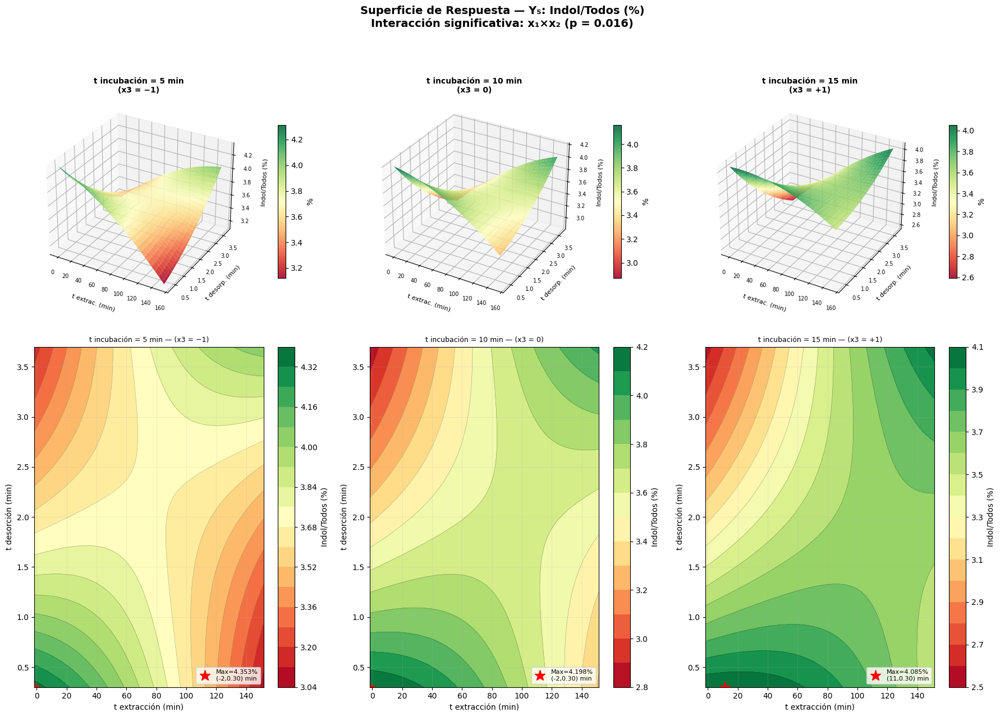

Figura guardada: RSM_Resultados/Y5_Indol_Superficies.png


In [36]:
# ============================================================
# ANÁLISIS Y5 — SUPERFICIES DE RESPUESTA 3D + CONTORNOS
# ============================================================
from mpl_toolkits.mplot3d import Axes3D

grid  = np.linspace(-1.7, 1.7, 60)
X1g, X2g = np.meshgrid(grid, grid)

x3_levels = [-1,  0,  1]
x3_labels = ['t incubación = 5 min\n(x3 = −1)',
              't incubación = 10 min\n(x3 = 0)',
              't incubación = 15 min\n(x3 = +1)']

fig = plt.figure(figsize=(18, 13))
fig.suptitle('Superficie de Respuesta — Y₅: Indol/Todos (%)\n'
             'Interacción significativa: x₁×x₂ (p = 0.016)',
             fontsize=14, fontweight='bold')

for col, (x3v, x3lbl) in enumerate(zip(x3_levels, x3_labels)):
    Yg = pred5(X1g, X2g, x3v) * 100   # en %

    # ---- Superficie 3D (fila superior) -------------------------
    ax3d = fig.add_subplot(2, 3, col+1, projection='3d')
    surf = ax3d.plot_surface(X1g*45+75, X2g+2, Yg,
                             cmap='RdYlGn', alpha=0.88, edgecolor='none')
    ax3d.set_xlabel('t extrac. (min)', fontsize=8, labelpad=6)
    ax3d.set_ylabel('t desorp. (min)', fontsize=8, labelpad=6)
    ax3d.set_zlabel('Indol/Todos (%)', fontsize=8, labelpad=5)
    ax3d.set_title(x3lbl, fontsize=10, fontweight='bold')
    ax3d.tick_params(labelsize=7)
    fig.colorbar(surf, ax=ax3d, shrink=0.45, pad=0.12, label='%')

    # ---- Contorno 2D (fila inferior) ---------------------------
    ax2d = fig.add_subplot(2, 3, col+4)
    cp = ax2d.contourf(X1g*45+75, X2g+2, Yg, levels=15, cmap='RdYlGn')
    ax2d.contour( X1g*45+75, X2g+2, Yg, levels=15,
                  colors='k', linewidths=0.4, alpha=0.35)
    fig.colorbar(cp, ax=ax2d, label='Indol/Todos (%)')

    # Marcar máximo local
    idx = np.unravel_index(Yg.argmax(), Yg.shape)
    t_ext_mx = X1g[idx]*45 + 75
    t_des_mx = X2g[idx] + 2
    ax2d.plot(t_ext_mx, t_des_mx, 'r*', ms=14,
              label=f'Max={Yg.max():.3f}%\n({t_ext_mx:.0f},{t_des_mx:.2f}) min')
    ax2d.set_xlabel('t extracción (min)', fontsize=10)
    ax2d.set_ylabel('t desorción (min)',  fontsize=10)
    ax2d.set_title(x3lbl.replace('\n', ' — '), fontsize=9)
    ax2d.legend(fontsize=8, loc='lower right')
    ax2d.grid(True, alpha=0.2)

plt.tight_layout()
plt.savefig('RSM_Resultados/Y5_Indol_Superficies.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)
print('Figura guardada: RSM_Resultados/Y5_Indol_Superficies.png')

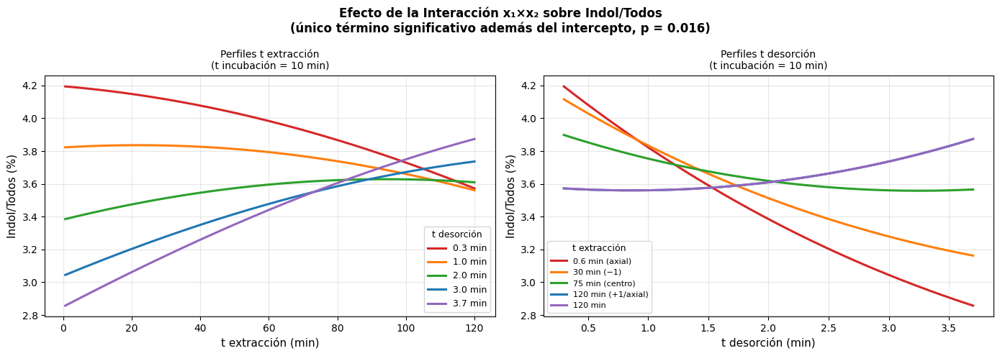

Figura guardada: RSM_Resultados/Y5_Indol_Interaccion.png


In [37]:
# ============================================================
# ANÁLISIS Y5 — GRÁFICO DE INTERACCIÓN x1×x2
# ============================================================

fig2, axes = plt.subplots(1, 2, figsize=(14, 5))
fig2.suptitle('Efecto de la Interacción x₁×x₂ sobre Indol/Todos\n'
              '(único término significativo además del intercepto, p = 0.016)',
              fontsize=12, fontweight='bold')

t_ext_range = np.linspace(0.6, 120, 200)
x1_range    = (t_ext_range - 75) / 45

# 5 perfiles de t_desorción
x2_levels  = [-1.7, -1.0,  0.0,  1.0,  1.7]
t_des_vals = [ 0.3,  1.0,  2.0,  3.0,  3.7]
palette    = ['#d62728','#ff7f0e','#2ca02c','#1f77b4','#9467bd']

for x2v, t_desv, col in zip(x2_levels, t_des_vals, palette):
    y_line = pred5(x1_range, x2v, 0) * 100    # escala real, x3=0
    axes[0].plot(t_ext_range, y_line, color=col, lw=2.2,
                 label=f'{t_desv} min')

axes[0].set_xlabel('t extracción (min)', fontsize=11)
axes[0].set_ylabel('Indol/Todos (%)',    fontsize=11)
axes[0].set_title('Perfiles t extracción\n(t incubación = 10 min)', fontsize=10)
axes[0].legend(title='t desorción', fontsize=9, title_fontsize=9)
axes[0].grid(True, alpha=0.3)

# Panel derecho: perfiles de t_desorción en función de sí misma
t_des_range = np.linspace(0.3, 3.7, 200)
x2_range    = (t_des_range - 2) / 1

x1_levels  = [-1.653, -1.0,  0.0,  1.0,  1.0]
t_ext_vals = [  0.6,  30.0, 75.0, 120.0, 120.0]
labels_ext = ['0.6 min (axial)', '30 min (−1)', '75 min (centro)',
              '120 min (+1/axial)', '120 min']

for x1v, t_extv, col, lbl in zip(x1_levels, t_ext_vals, palette, labels_ext):
    y_line = pred5(x1v, x2_range, 0) * 100
    axes[1].plot(t_des_range, y_line, color=col, lw=2.2, label=lbl)

axes[1].set_xlabel('t desorción (min)', fontsize=11)
axes[1].set_ylabel('Indol/Todos (%)',   fontsize=11)
axes[1].set_title('Perfiles t desorción\n(t incubación = 10 min)', fontsize=10)
axes[1].legend(title='t extracción', fontsize=8, title_fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('RSM_Resultados/Y5_Indol_Interaccion.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig2)
print('Figura guardada: RSM_Resultados/Y5_Indol_Interaccion.png')

---
# FASE 5 — Interpretación de Efectos
## 5.1 · Pareto de efectos &nbsp;|&nbsp; 5.2–5.3 · Superficies 3D + Contornos &nbsp;|&nbsp; 5.4 · Predicción vs Observado

In [38]:
# ============================================================
# FASE 5 — SETUP COMPARTIDO (datos, modelo, helpers)
# ============================================================
%matplotlib inline
from IPython.display import display as ipy_display

import numpy as np, pandas as pd, matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec, statsmodels.api as sm
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import f as f_dist, t as t_dist
from scipy.optimize import differential_evolution, minimize
import warnings, os; warnings.filterwarnings('ignore')

OUT = 'RSM_Resultados'; os.makedirs(OUT, exist_ok=True)

# ── Factores codificados ──────────────────────────────────────
design  = pd.read_excel('Diseño Experimental.xlsx', header=0)
t_ext_a = design.iloc[:, 2].values.astype(float)
t_des_a = design.iloc[:, 3].values.astype(float)
t_inc_a = design.iloc[:, 4].values.astype(float)

C = np.array([75.0, 2.0, 10.0])   # centros
S = np.array([45.0, 1.0,  5.0])   # pasos

x1 = (t_ext_a - C[0]) / S[0]
x2 = (t_des_a - C[1]) / S[1]
x3 = (t_inc_a - C[2]) / S[2]
N  = 17

X_full = np.column_stack([np.ones(N), x1, x2, x3,
                           x1**2, x2**2, x3**2,
                           x1*x2, x1*x3, x2*x3])

TNAMES  = ['β₀','x₁','x₂','x₃','x₁²','x₂²','x₃²','x₁x₂','x₁x₃','x₂x₃']
FLABELS = ['t extracción (min)','t desorción (min)','t incubación (min)']

# ── Respuestas transformadas ──────────────────────────────────
df_y   = pd.read_excel('datos_transformados.xlsx')
Y_COLS = [c for c in df_y.columns if c.startswith('Y')]
Y_TAGS = ['Y1','Y2','Y3','Y4','Y5','Y6','Y7','Y8','Y9']
Y_DESC = ['Metab.Diana √','Metab.Tot √','%RSD Todos log','%RSD Diana log',
          'Indol/Todos √','Cresol/Todos log','Metional/Todos log',
          'AcCarbox √','Dianas/Totales √']

MODELS = {}
for tag, col in zip(Y_TAGS, Y_COLS):
    MODELS[tag] = sm.OLS(df_y[col].values.astype(float), X_full).fit()

def predict_y(model, x1v, x2v, x3v):
    b = model.params
    return (b[0] + b[1]*x1v + b[2]*x2v + b[3]*x3v
            + b[4]*x1v**2 + b[5]*x2v**2 + b[6]*x3v**2
            + b[7]*x1v*x2v + b[8]*x1v*x3v + b[9]*x2v*x3v)

def decode(xv):
    return xv * S + C

print(f'Modelos ajustados para {len(MODELS)} respuestas.')
for tag in Y_TAGS:
    r = MODELS[tag]
    print(f'  {tag}: R²={r.rsquared:.4f}  R²-adj={r.rsquared_adj:.4f}')

Modelos ajustados para 9 respuestas.
  Y1: R²=0.8035  R²-adj=0.5508
  Y2: R²=0.8341  R²-adj=0.6209
  Y3: R²=0.4635  R²-adj=-0.2262
  Y4: R²=0.7853  R²-adj=0.5094
  Y5: R²=0.7825  R²-adj=0.5028
  Y6: R²=0.8160  R²-adj=0.5795
  Y7: R²=0.8160  R²-adj=0.5795
  Y8: R²=0.7386  R²-adj=0.4026
  Y9: R²=0.6963  R²-adj=0.3058


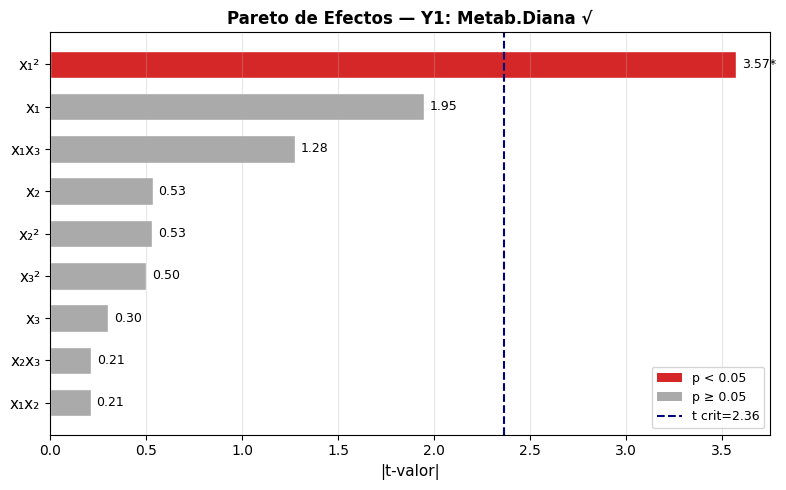

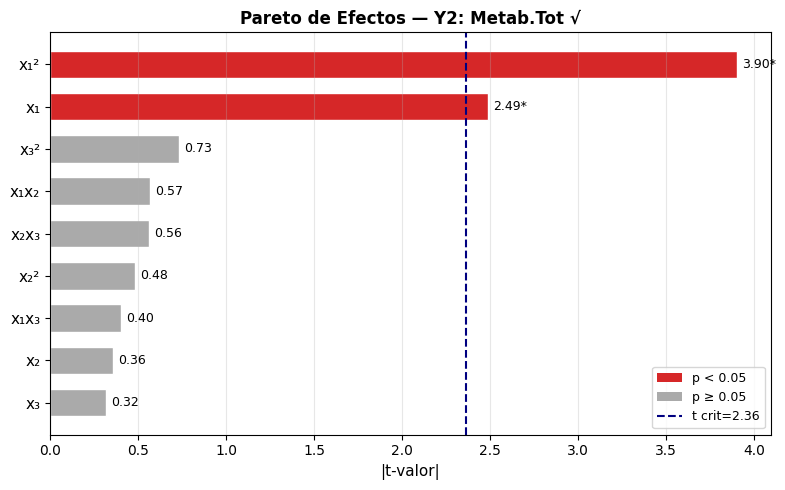

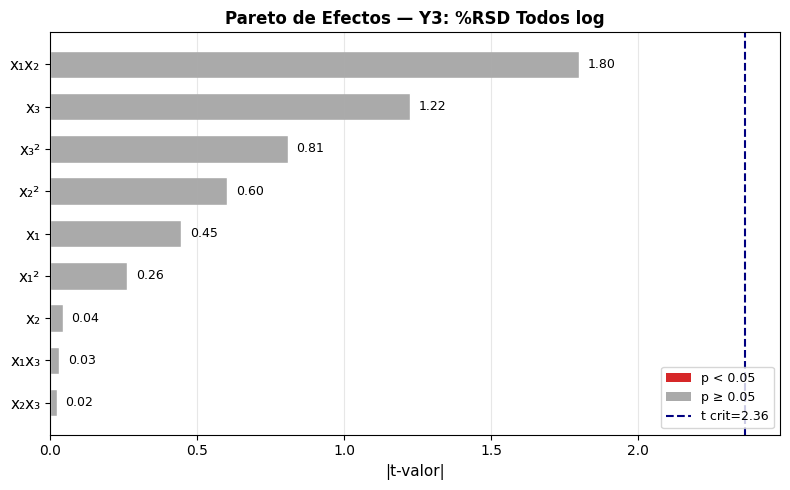

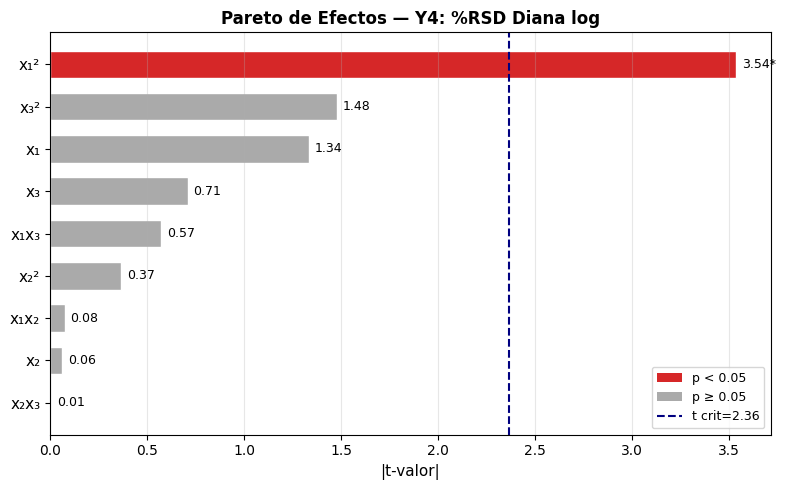

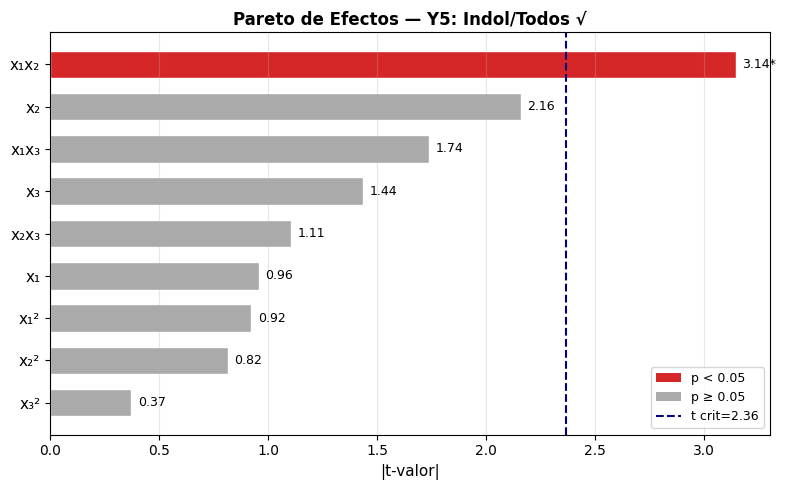

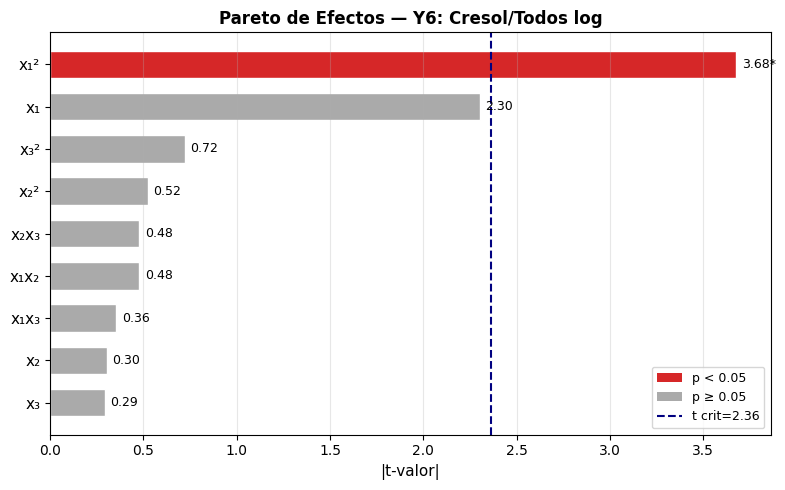

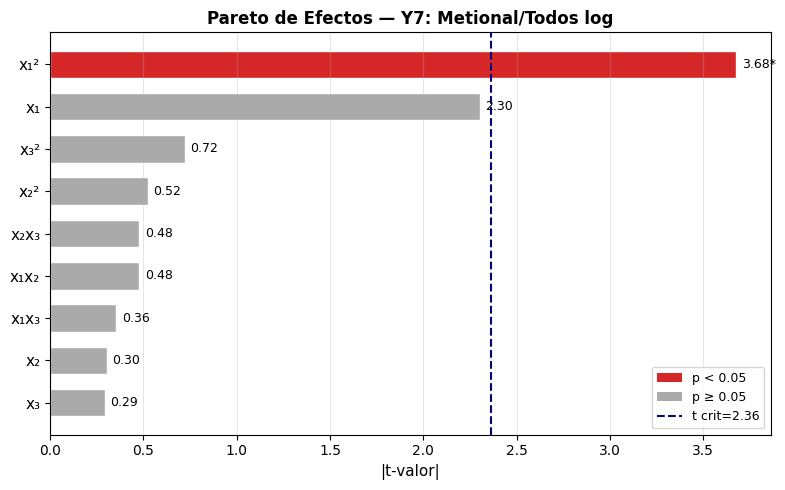

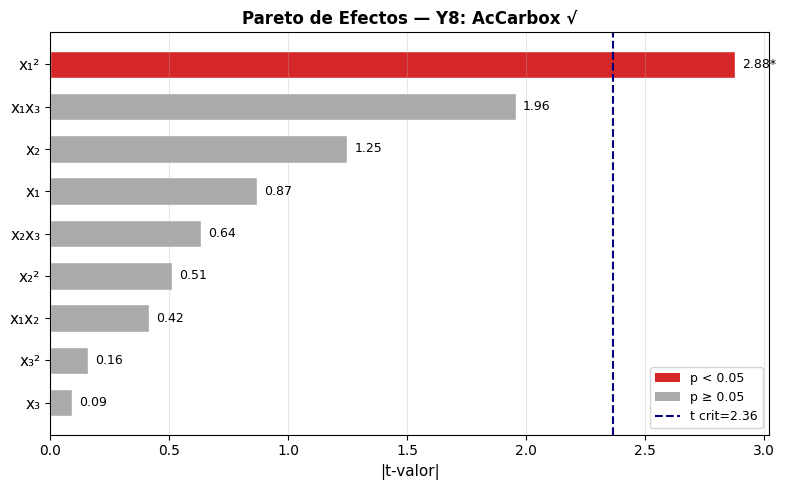

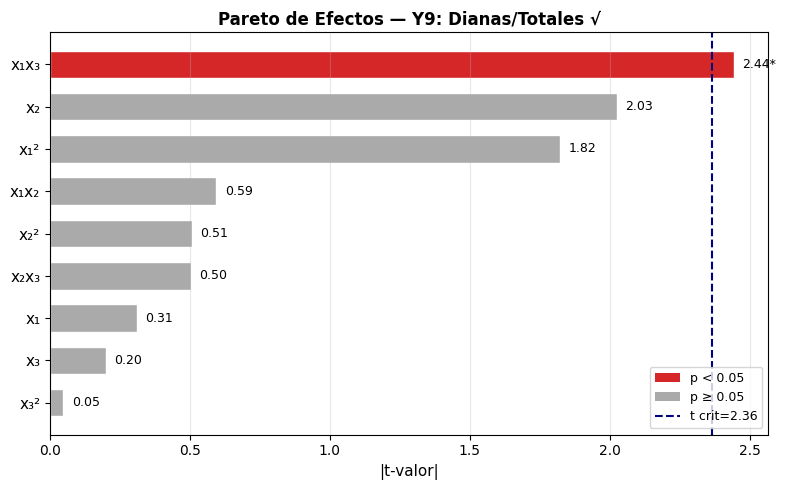

✓ Pareto completado para Y1–Y9.


In [39]:
# ============================================================
# FASE 5.1 — PARETO DE EFECTOS (9 figuras, una por Y)
# ============================================================
from matplotlib.patches import Patch

df_crit_t = float(t_dist.ppf(0.975, N - 10))

for tag, desc in zip(Y_TAGS, Y_DESC):
    res = MODELS[tag]
    terms = TNAMES[1:]
    tvals = np.abs(res.tvalues[1:])
    pvals = res.pvalues[1:]

    order  = np.argsort(tvals)[::-1]
    t_ord  = tvals[order]
    p_ord  = pvals[order]
    lbl    = [terms[i] for i in order]
    colors = ['#d62728' if p < 0.05 else '#aaaaaa' for p in p_ord]

    fig, ax = plt.subplots(figsize=(8, 5))
    ax.barh(range(len(lbl)), t_ord, color=colors, edgecolor='white', height=0.65)
    ax.axvline(df_crit_t, color='navy', ls='--', lw=1.5)
    ax.set_yticks(range(len(lbl)))
    ax.set_yticklabels(lbl, fontsize=11)
    ax.set_xlabel('|t-valor|', fontsize=11)
    ax.set_title(f'Pareto de Efectos — {tag}: {desc}', fontsize=12, fontweight='bold')
    ax.grid(axis='x', alpha=0.3)
    ax.invert_yaxis()
    for i, (tv, pv) in enumerate(zip(t_ord, p_ord)):
        ax.text(tv + 0.03, i, f'{tv:.2f}{"*" if pv<0.05 else ""}',
                va='center', fontsize=9)
    ax.legend(handles=[
        Patch(fc='#d62728', label='p < 0.05'),
        Patch(fc='#aaaaaa', label='p ≥ 0.05'),
        plt.Line2D([0],[0], color='navy', ls='--', lw=1.5,
                   label=f't crit={df_crit_t:.2f}')
    ], fontsize=9, loc='lower right')

    fig.tight_layout()
    fig.savefig(f'{OUT}/{tag}_Pareto.png', dpi=150, bbox_inches='tight')
    ipy_display(fig)       # ← fuerza visualización por iteración
    plt.close(fig)

print('✓ Pareto completado para Y1–Y9.')

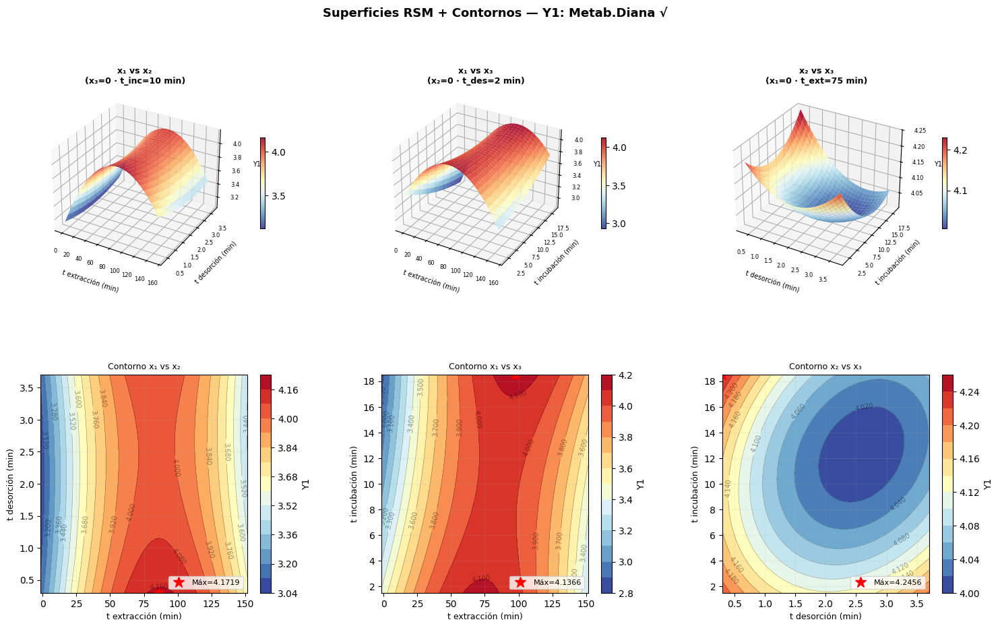

  Y1 ✓


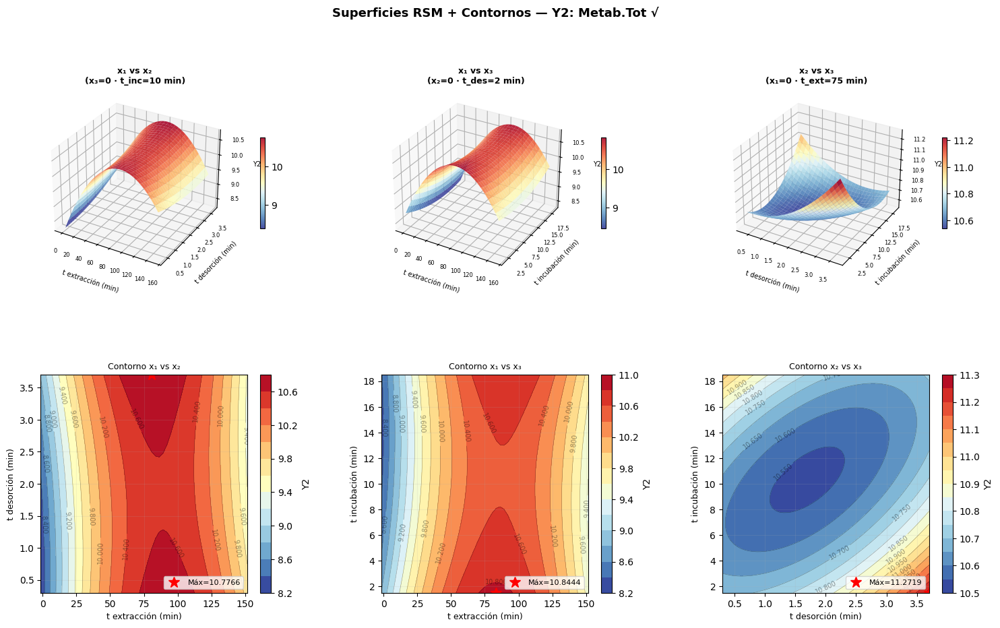

  Y2 ✓


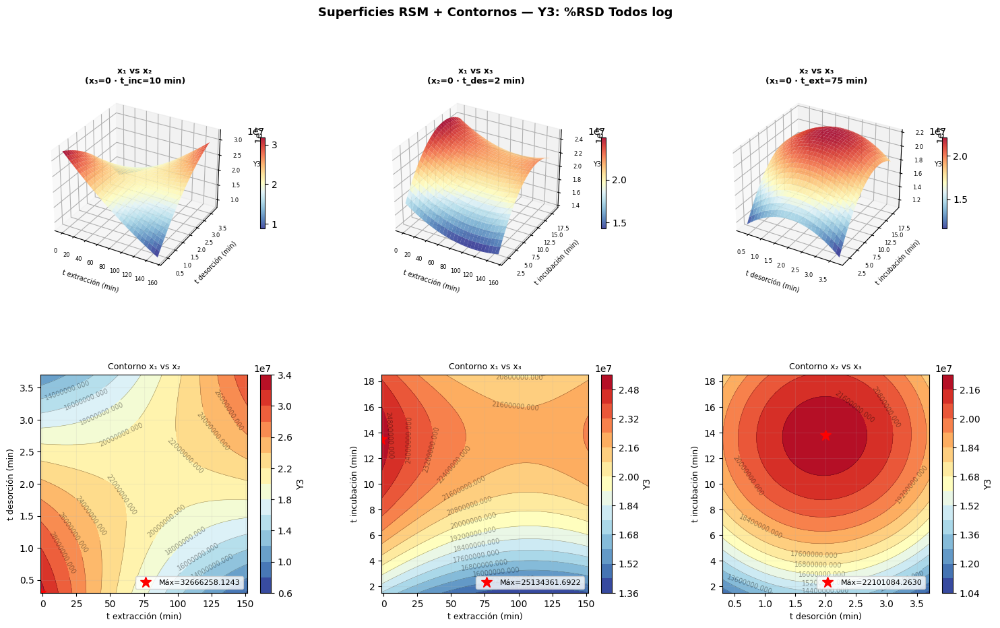

  Y3 ✓


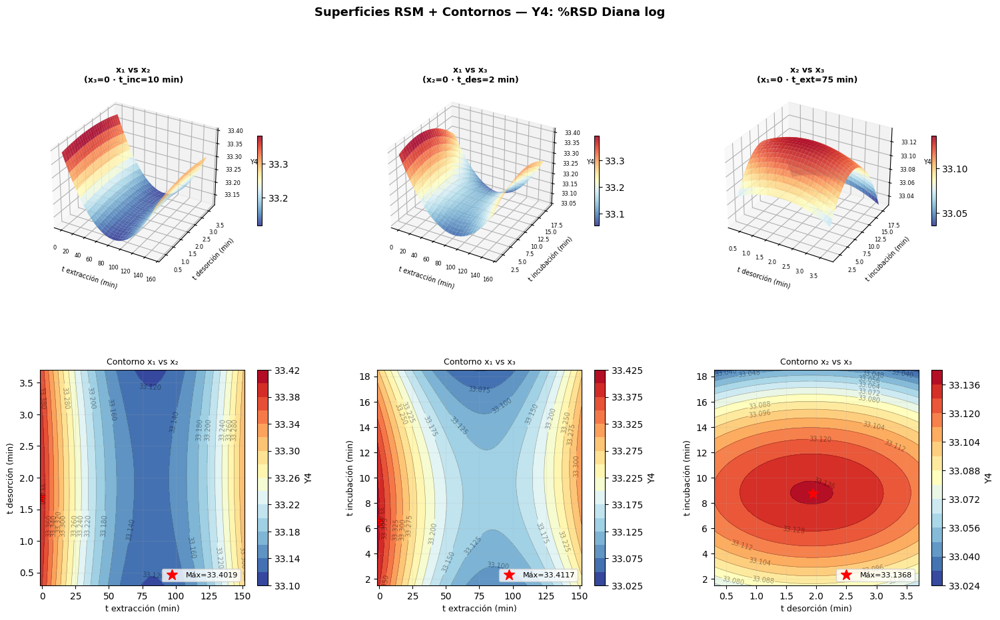

  Y4 ✓


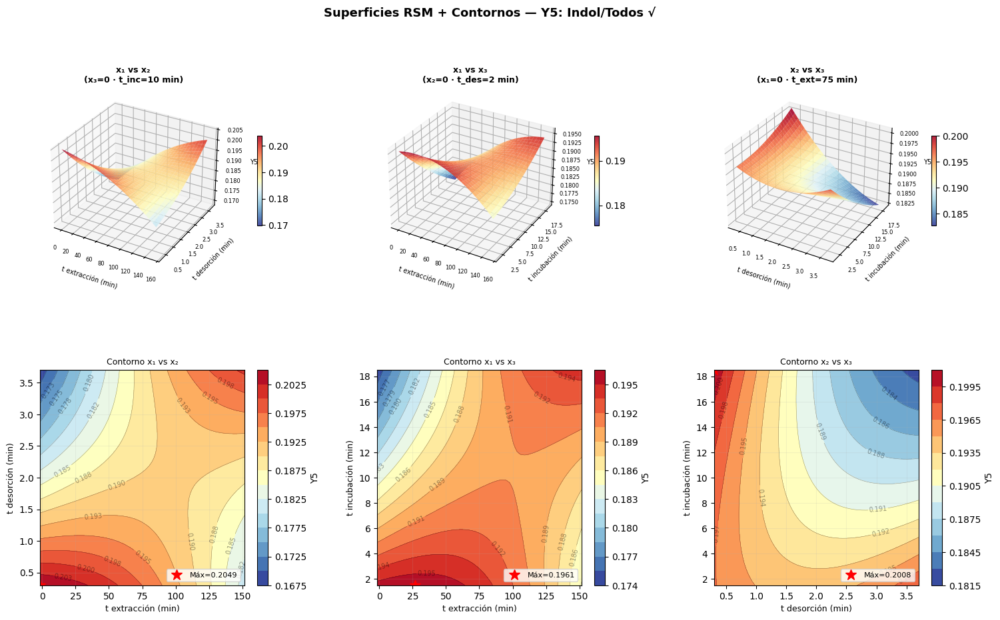

  Y5 ✓


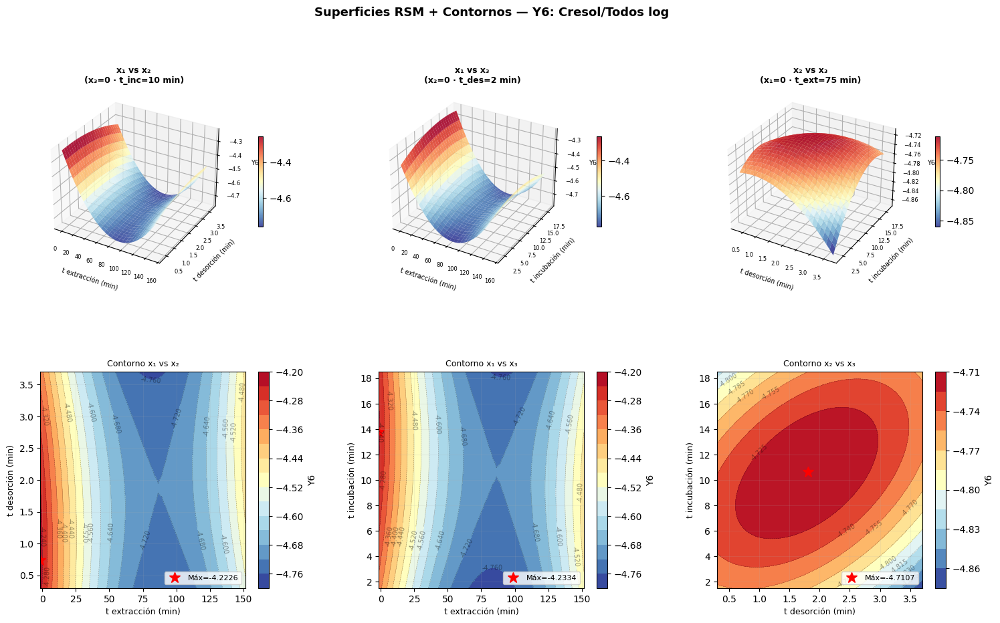

  Y6 ✓


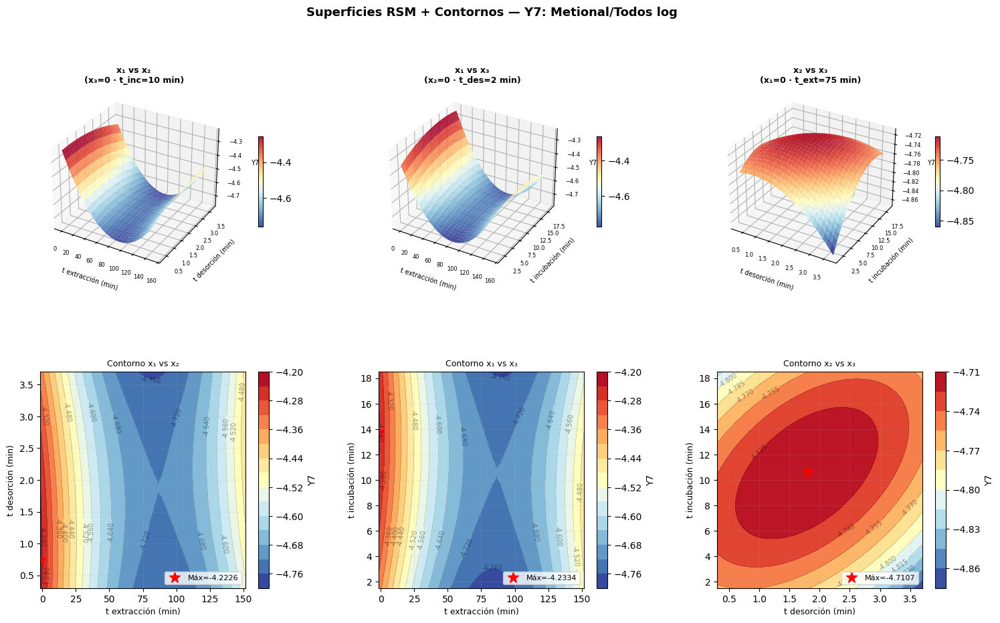

  Y7 ✓


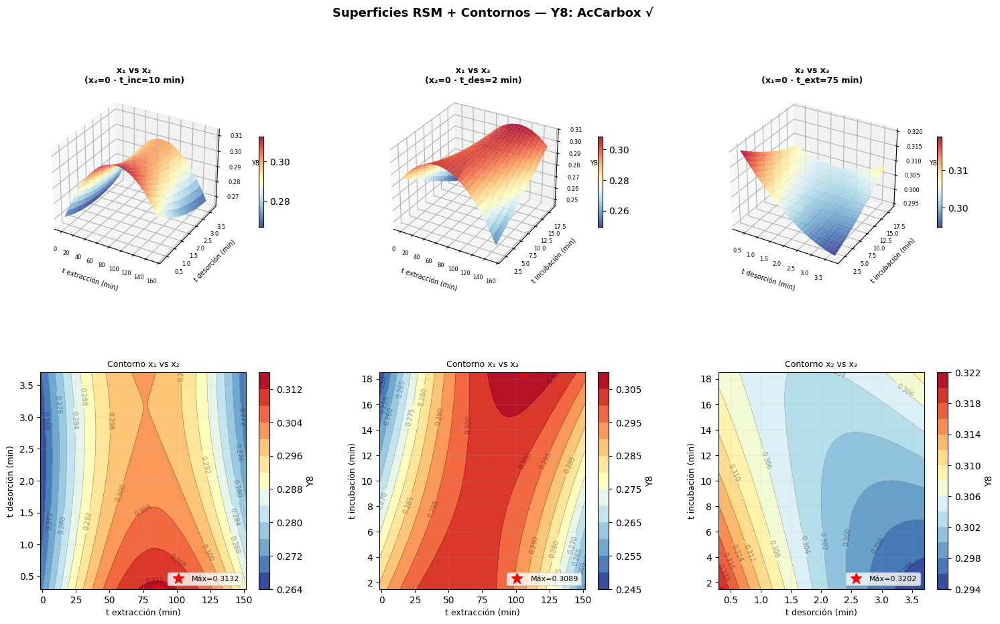

  Y8 ✓


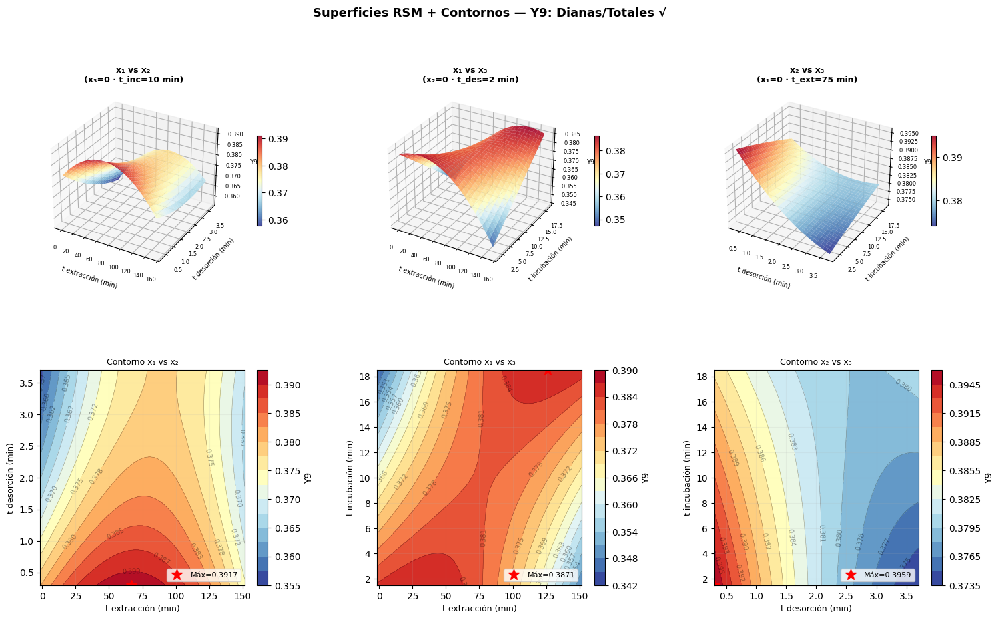

  Y9 ✓

✓ Superficies y contornos completados para Y1–Y9.


In [40]:
# ============================================================
# FASE 5.2 + 5.3 — SUPERFICIES 3D Y CONTORNOS (por Y)
# 2 filas (3D / contorno) × 3 cols (x1x2, x1x3, x2x3)
# ============================================================

GRID    = np.linspace(-1.7, 1.7, 55)
G1, G2  = np.meshgrid(GRID, GRID)

# (idx_A, idx_B, idx_fijo, val_fijo, título, subtítulo)
COMBOS = [
    (0, 1, 2, 0.0, 'x₁ vs x₂', 'x₃=0 · t_inc=10 min'),
    (0, 2, 1, 0.0, 'x₁ vs x₃', 'x₂=0 · t_des=2 min'),
    (1, 2, 0, 0.0, 'x₂ vs x₃', 'x₁=0 · t_ext=75 min'),
]

for tag, desc in zip(Y_TAGS, Y_DESC):
    model = MODELS[tag]
    fig   = plt.figure(figsize=(18, 10))
    fig.suptitle(f'Superficies RSM + Contornos — {tag}: {desc}',
                 fontsize=13, fontweight='bold')
    gs = gridspec.GridSpec(2, 3, figure=fig, hspace=0.38, wspace=0.32)

    for col_idx, (ia, ib, ic, val_c, ttl, sub) in enumerate(COMBOS):
        xargs = [None, None, None]
        xargs[ia] = G1; xargs[ib] = G2
        xargs[ic] = np.full_like(G1, val_c)
        Yg = predict_y(model, *xargs)
        Xa = G1 * S[ia] + C[ia]
        Xb = G2 * S[ib] + C[ib]

        # ── 3D ──────────────────────────────────────────────
        ax3 = fig.add_subplot(gs[0, col_idx], projection='3d')
        surf = ax3.plot_surface(Xa, Xb, Yg, cmap='RdYlBu_r',
                                alpha=0.88, edgecolor='none')
        ax3.set_xlabel(FLABELS[ia], fontsize=7, labelpad=5)
        ax3.set_ylabel(FLABELS[ib], fontsize=7, labelpad=5)
        ax3.set_zlabel(tag, fontsize=7, labelpad=4)
        ax3.set_title(f'{ttl}\n({sub})', fontsize=9, fontweight='bold')
        ax3.tick_params(labelsize=6)
        fig.colorbar(surf, ax=ax3, shrink=0.42, pad=0.12)

        # ── Contorno ────────────────────────────────────────
        ax2 = fig.add_subplot(gs[1, col_idx])
        cp  = ax2.contourf(Xa, Xb, Yg, levels=14, cmap='RdYlBu_r')
        cs  = ax2.contour( Xa, Xb, Yg, levels=14,
                           colors='k', linewidths=0.4, alpha=0.4)
        ax2.clabel(cs, inline=True, fontsize=7, fmt='%.3f')
        fig.colorbar(cp, ax=ax2, label=tag)
        idx_max = np.unravel_index(Yg.argmax(), Yg.shape)
        ax2.plot(Xa[idx_max], Xb[idx_max], 'r*', ms=12,
                 label=f'Máx={Yg.max():.4f}')
        ax2.set_xlabel(FLABELS[ia], fontsize=9)
        ax2.set_ylabel(FLABELS[ib], fontsize=9)
        ax2.set_title(f'Contorno {ttl}', fontsize=9)
        ax2.legend(fontsize=8, loc='lower right')
        ax2.grid(True, alpha=0.15)

    fig.savefig(f'{OUT}/{tag}_Superficies.png', dpi=130, bbox_inches='tight')
    ipy_display(fig)       # ← fuerza visualización por iteración
    plt.close(fig)
    print(f'  {tag} ✓')

print('\n✓ Superficies y contornos completados para Y1–Y9.')

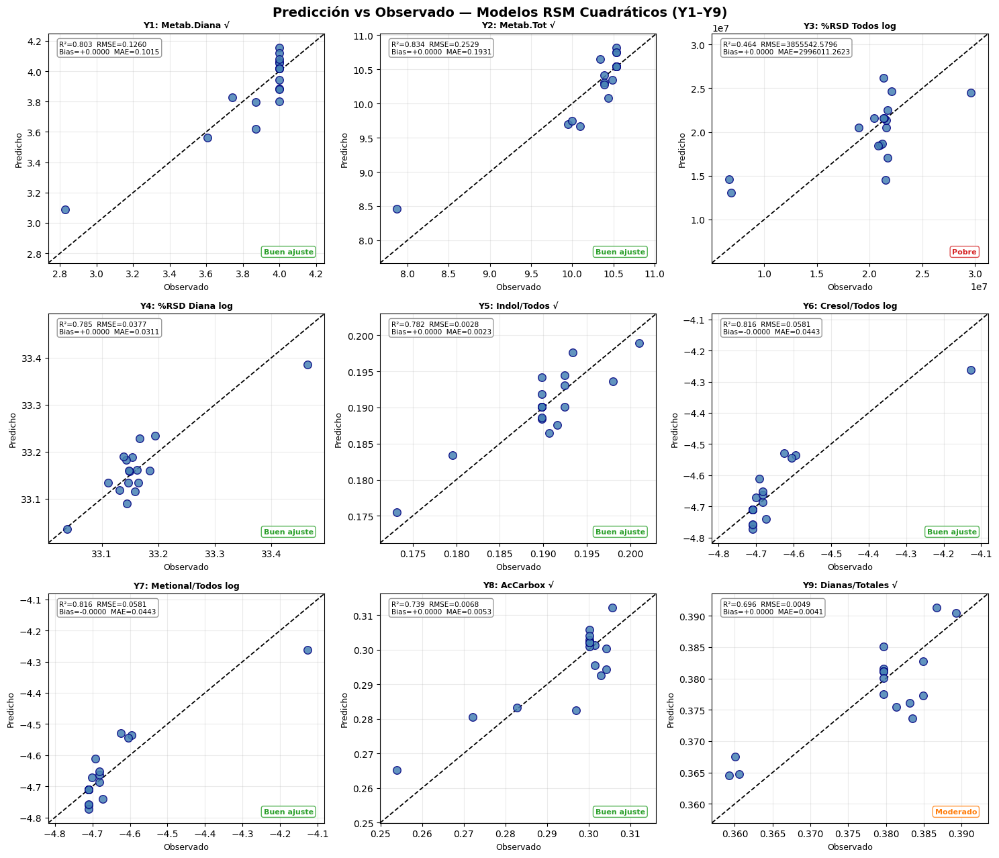


=== Métricas de Validación ===
        R2          RMSE     Bias           MAE      Calidad
Y                                                           
Y1 0.80346       0.12600  0.00000       0.10153  Buen ajuste
Y2 0.83413       0.25286  0.00000       0.19308  Buen ajuste
Y3 0.46352 3855542.57962  0.00000 2996011.26228        Pobre
Y4 0.78535       0.03774  0.00000       0.03114  Buen ajuste
Y5 0.78246       0.00279  0.00000       0.00233  Buen ajuste
Y6 0.81602       0.05808 -0.00000       0.04428  Buen ajuste
Y7 0.81602       0.05808 -0.00000       0.04428  Buen ajuste
Y8 0.73865       0.00675  0.00000       0.00532  Buen ajuste
Y9 0.69627       0.00493  0.00000       0.00411     Moderado


In [41]:
# ============================================================
# FASE 5.4 — PREDICCIÓN vs OBSERVADO
# Una figura 3×3 con todas las Y + tabla de métricas
# ============================================================

fig, axes = plt.subplots(3, 3, figsize=(15, 13))
fig.suptitle('Predicción vs Observado — Modelos RSM Cuadráticos (Y1–Y9)',
             fontsize=14, fontweight='bold')

val_rows = []
for ax, tag, desc, col in zip(axes.flat, Y_TAGS, Y_DESC, Y_COLS):
    model  = MODELS[tag]
    y_obs  = df_y[col].values.astype(float)
    y_pred = model.fittedvalues

    SS_res = np.sum((y_obs - y_pred)**2)
    SS_tot = np.sum((y_obs - y_obs.mean())**2)
    R2   = 1 - SS_res / SS_tot
    RMSE = np.sqrt(np.mean((y_obs - y_pred)**2))
    Bias = np.mean(y_pred - y_obs)
    MAE  = np.mean(np.abs(y_pred - y_obs))

    quality = ('Buen ajuste' if R2 > 0.70 else
               'Moderado'   if R2 > 0.50 else 'Pobre')
    q_col   = ('#2ca02c' if R2 > 0.70 else
               '#ff7f0e' if R2 > 0.50 else '#d62728')

    ax.scatter(y_obs, y_pred, s=70, color='steelblue',
               edgecolors='navy', alpha=0.85, zorder=5)
    mn = min(y_obs.min(), y_pred.min())
    mx = max(y_obs.max(), y_pred.max())
    pad = (mx - mn) * 0.07
    ax.plot([mn-pad, mx+pad], [mn-pad, mx+pad], 'k--', lw=1.3)
    ax.set_xlim(mn-pad, mx+pad); ax.set_ylim(mn-pad, mx+pad)
    ax.set_xlabel('Observado', fontsize=9)
    ax.set_ylabel('Predicho',  fontsize=9)
    ax.set_title(f'{tag}: {desc}', fontsize=9, fontweight='bold')
    ax.grid(True, alpha=0.25)
    ax.text(0.04, 0.97,
            f'R²={R2:.3f}  RMSE={RMSE:.4f}\nBias={Bias:+.4f}  MAE={MAE:.4f}',
            transform=ax.transAxes, fontsize=7.5, va='top',
            bbox=dict(boxstyle='round,pad=0.3', fc='white', ec='gray', alpha=0.8))
    ax.text(0.96, 0.04, quality, transform=ax.transAxes, fontsize=8,
            ha='right', color=q_col, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.3', fc='white', ec=q_col, alpha=0.8))

    val_rows.append(dict(Y=tag, R2=R2, RMSE=RMSE, Bias=Bias, MAE=MAE, Calidad=quality))

fig.tight_layout()
fig.savefig(f'{OUT}/PredVsObs_Todas.png', dpi=150, bbox_inches='tight')
ipy_display(fig)
plt.close(fig)

df_val = pd.DataFrame(val_rows).set_index('Y')
print('\n=== Métricas de Validación ===')
print(df_val.to_string(float_format='{:.5f}'.format))

---
# FASE 6 — Localización del Óptimo
## 6.1 · Punto crítico (∂Y/∂xᵢ = 0) &nbsp;|&nbsp; 6.2 · Diagnóstico Hessiano (máx / mín / silla)

In [42]:
# ============================================================
# FASE 6.1 + 6.2 — PUNTO CRÍTICO Y ANÁLISIS HESSIANO
# ============================================================
# Modelo: Y = b0 + b1·x1 + b2·x2 + b3·x3
#           + b11·x1² + b22·x2² + b33·x3²
#           + b12·x1x2 + b13·x1x3 + b23·x2x3
#
# Sistema ∂Y/∂xi = 0  =>  G · x* = -b_lin
# donde G (Hessiana / 2) = [[2b11, b12, b13],
#                             [b12, 2b22, b23],
#                             [b13, b23, 2b33]]
# ============================================================

critical_rows = []

for tag, desc in zip(Y_TAGS, Y_DESC):
    res = MODELS[tag]
    b   = res.params  # [b0, b1, b2, b3, b11, b22, b33, b12, b13, b23]

    # Hessiana
    H = np.array([
        [2*b[4],   b[7],   b[8]],
        [  b[7], 2*b[5],   b[9]],
        [  b[8],   b[9], 2*b[6]]
    ])
    b_lin = np.array([b[1], b[2], b[3]])

    # Resolver sistema (puede ser singular si H es casi singular)
    try:
        x_star = np.linalg.solve(H, -b_lin)
        singular = False
    except np.linalg.LinAlgError:
        x_star = np.full(3, np.nan)
        singular = True

    # Verificar si el punto está dentro del espacio diseñado
    in_domain = bool(np.all(np.abs(x_star) <= 1.7))

    # Autovalores → tipo de punto crítico
    eigvals = np.linalg.eigvals(H)
    if np.all(eigvals < 0):
        crit_type = 'MÁXIMO'
        crit_symb = '↑'
    elif np.all(eigvals > 0):
        crit_type = 'MÍNIMO'
        crit_symb = '↓'
    else:
        crit_type = 'SILLA'
        crit_symb = '⇕'

    # Valor predicho en el punto crítico
    if not singular:
        y_star = predict_y(res, x_star[0], x_star[1], x_star[2])
        x_real = decode(x_star)
    else:
        y_star = np.nan
        x_real = np.full(3, np.nan)

    # Imprimir resultado
    print(f'─── {tag}: {desc} ───')
    print(f'  Punto crítico (codificado): x1*={x_star[0]:+.4f}  x2*={x_star[1]:+.4f}  x3*={x_star[2]:+.4f}')
    print(f'  Punto crítico (real):       t_ext={x_real[0]:.1f} min  t_des={x_real[1]:.3f} min  t_inc={x_real[2]:.1f} min')
    print(f'  Dentro del dominio [-1.7, +1.7]: {in_domain}')
    print(f'  Y* predicho: {y_star:.6f}')
    print(f'  Autovalores H: {np.round(eigvals.real, 5).tolist()}')
    print(f'  Tipo de punto crítico: {crit_type} {crit_symb}')
    print()

    critical_rows.append(dict(
        Y=tag, Descripcion=desc,
        x1_star=x_star[0], x2_star=x_star[1], x3_star=x_star[2],
        t_ext_opt=x_real[0], t_des_opt=x_real[1], t_inc_opt=x_real[2],
        Y_star=y_star, En_dominio=in_domain,
        Tipo=crit_type,
        lam1=eigvals.real[0], lam2=eigvals.real[1], lam3=eigvals.real[2]
    ))

# ── Tabla resumen ─────────────────────────────────────────────
df_crit_pts = pd.DataFrame(critical_rows).set_index('Y')
print('=== TABLA RESUMEN — PUNTOS CRÍTICOS ===')
cols_show = ['t_ext_opt','t_des_opt','t_inc_opt','Y_star','En_dominio','Tipo']
print(df_crit_pts[cols_show].to_string(float_format='{:.4f}'.format))

─── Y1: Metab.Diana √ ───
  Punto crítico (codificado): x1*=+0.2224  x2*=+0.5489  x3*=+0.0803
  Punto crítico (real):       t_ext=85.0 min  t_des=2.549 min  t_inc=10.4 min
  Dentro del dominio [-1.7, +1.7]: True
  Y* predicho: 4.022830
  Autovalores H: [-0.53846, 0.08039, 0.04603]
  Tipo de punto crítico: SILLA ⇕

─── Y2: Metab.Tot √ ───
  Punto crítico (codificado): x1*=+0.2725  x2*=-0.1055  x3*=+0.0644
  Punto crítico (real):       t_ext=87.3 min  t_des=1.894 min  t_inc=10.3 min
  Dentro del dominio [-1.7, +1.7]: True
  Y* predicho: 10.581515
  Autovalores H: [-1.1563, 0.21976, 0.05158]
  Tipo de punto crítico: SILLA ⇕

─── Y3: %RSD Todos log ───
  Punto crítico (codificado): x1*=+0.1013  x2*=+0.1714  x3*=+0.7506
  Punto crítico (real):       t_ext=79.6 min  t_des=2.171 min  t_inc=13.8 min
  Dentro del dominio [-1.7, +1.7]: True
  Y* predicho: 22059072.987598
  Autovalores H: [3713641.93948, -4593666.60315, -2628881.32564]
  Tipo de punto crítico: SILLA ⇕

─── Y4: %RSD Diana log ───


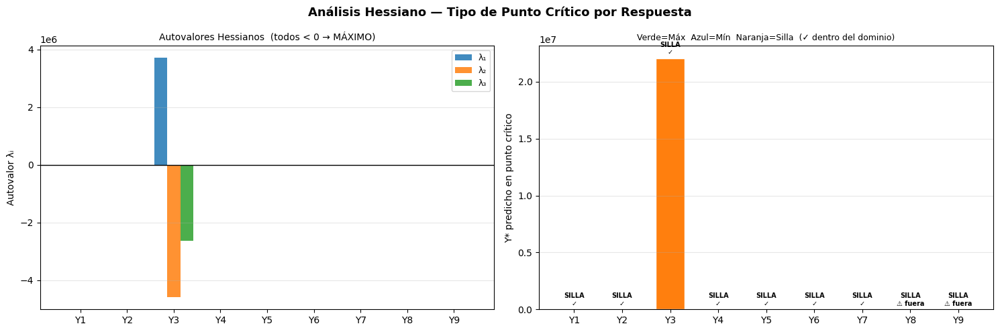

✓ Figura Hessiana guardada.


In [43]:
# ============================================================
# FASE 6 — FIGURA RESUMEN PUNTOS CRÍTICOS
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Análisis Hessiano — Tipo de Punto Crítico por Respuesta',
             fontsize=13, fontweight='bold')

xi    = np.arange(len(Y_TAGS))
width = 0.28

# ── Autovalores ───────────────────────────────────────────────
ax = axes[0]
lam1 = df_crit_pts['lam1'].values.astype(float)
lam2 = df_crit_pts['lam2'].values.astype(float)
lam3 = df_crit_pts['lam3'].values.astype(float)
ax.bar(xi - width, lam1, width, label='λ₁', color='#1f77b4', alpha=0.85)
ax.bar(xi,         lam2, width, label='λ₂', color='#ff7f0e', alpha=0.85)
ax.bar(xi + width, lam3, width, label='λ₃', color='#2ca02c', alpha=0.85)
ax.axhline(0, color='black', lw=1.0)
ax.set_xticks(xi); ax.set_xticklabels(Y_TAGS, fontsize=10)
ax.set_ylabel('Autovalor λᵢ', fontsize=10)
ax.set_title('Autovalores Hessianos  (todos < 0 → MÁXIMO)', fontsize=10)
ax.legend(fontsize=9); ax.grid(axis='y', alpha=0.3)

# ── Valor en punto crítico ────────────────────────────────────
ax2 = axes[1]
tipos = df_crit_pts['Tipo'].values
doms  = df_crit_pts['En_dominio'].values
colors_t = []
for tp, dm in zip(tipos, doms):
    if   tp == 'MÁXIMO' and dm:  colors_t.append('#2ca02c')
    elif tp == 'MÁXIMO':         colors_t.append('#98df8a')
    elif tp == 'MÍNIMO' and dm:  colors_t.append('#1f77b4')
    elif tp == 'MÍNIMO':         colors_t.append('#aec7e8')
    elif tp == 'SILLA'  and dm:  colors_t.append('#ff7f0e')
    else:                        colors_t.append('#ffbb78')

y_vals_star = df_crit_pts['Y_star'].values.astype(float)
y_range = float(y_vals_star.max() - y_vals_star.min())
bars = ax2.bar(xi, y_vals_star, color=colors_t, edgecolor='white', width=0.6)
for bar, tp, dm in zip(bars, tipos, doms):
    ax2.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + y_range * 0.01,
             f'{tp}\n{"✓" if dm else "⚠ fuera"}',
             ha='center', va='bottom', fontsize=7, fontweight='bold')
ax2.set_xticks(xi); ax2.set_xticklabels(Y_TAGS, fontsize=10)
ax2.set_ylabel('Y* predicho en punto crítico', fontsize=10)
ax2.set_title('Verde=Máx  Azul=Mín  Naranja=Silla  (✓ dentro del dominio)', fontsize=9)
ax2.grid(axis='y', alpha=0.3)

fig.tight_layout()
fig.savefig(f'{OUT}/Fase6_Hessianos.png', dpi=150, bbox_inches='tight')
ipy_display(fig)
plt.close(fig)
print('✓ Figura Hessiana guardada.')

---
# FASE 7 — Optimización Multirrespuesta
## 7.1 · Deseabilidad individual &nbsp;|&nbsp; 7.2 · Óptimo global &nbsp;|&nbsp; 7.3 · Análisis de sensibilidad

In [44]:
# ============================================================
# FASE 7.1 — ESPECIFICACIONES Y FUNCIONES DE DESEABILIDAD
# ============================================================

# Rango observado de cada Y (en escala transformada)
desir_spec = {}
for tag, col in zip(Y_TAGS, Y_COLS):
    y = df_y[col].values.astype(float)
    desir_spec[tag] = dict(ymin=y.min(), ymax=y.max(),
                           ymean=y.mean(), ystd=y.std())

# ── Especificaciones: diccionarios con claves fijas ───────────
#   obj  : 'max' | 'min'
#   L    : límite inferior aceptable  (None si no aplica)
#   T    : target (óptimo deseado)
#   U    : límite superior aceptable  (None si no aplica)
#   w    : peso en la deseabilidad global
#   s    : exponente de la función (1=lineal)
SPECS = {
    'Y1': dict(obj='max', L=desir_spec['Y1']['ymin'], T=desir_spec['Y1']['ymax'], U=None,                      w=0.20, s=1),
    'Y2': dict(obj='max', L=desir_spec['Y2']['ymin'], T=desir_spec['Y2']['ymax'], U=None,                      w=0.15, s=1),
    'Y3': dict(obj='min', L=None,                      T=desir_spec['Y3']['ymin'], U=desir_spec['Y3']['ymax'], w=0.10, s=1),
    'Y4': dict(obj='min', L=None,                      T=desir_spec['Y4']['ymin'], U=desir_spec['Y4']['ymax'], w=0.10, s=1),
    'Y5': dict(obj='max', L=desir_spec['Y5']['ymin'], T=desir_spec['Y5']['ymax'], U=None,                      w=0.15, s=1),
    'Y6': dict(obj='max', L=desir_spec['Y6']['ymin'], T=desir_spec['Y6']['ymax'], U=None,                      w=0.10, s=1),
    'Y7': dict(obj='max', L=desir_spec['Y7']['ymin'], T=desir_spec['Y7']['ymax'], U=None,                      w=0.10, s=1),
    'Y8': dict(obj='max', L=desir_spec['Y8']['ymin'], T=desir_spec['Y8']['ymax'], U=None,                      w=0.05, s=1),
    'Y9': dict(obj='max', L=desir_spec['Y9']['ymin'], T=desir_spec['Y9']['ymax'], U=None,                      w=0.05, s=1),
}

def desirability_i(y_val, obj, L, T, U, s=1):
    """Función de deseabilidad individual (Derringer & Suich, 1980)."""
    if obj == 'max':
        if y_val <= L:  return 0.0
        if y_val >= T:  return 1.0
        return float(((y_val - L) / (T - L)) ** s)
    else:  # 'min'
        if y_val <= T:  return 1.0
        if y_val >= U:  return 0.0
        return float(((U - y_val) / (U - T)) ** s)

def global_desirability(xv, specs=None, verbose=False):
    """D_global = prod(d_i^w_i)^(1/sum(w_i)). Retorna -D para minimizar."""
    if specs is None:
        specs = SPECS
    x1v, x2v, x3v = xv
    d_list = []
    for tag in Y_TAGS:
        y_pred = predict_y(MODELS[tag], x1v, x2v, x3v)
        sp = specs[tag]
        d = desirability_i(y_pred, sp['obj'], sp['L'], sp['T'], sp['U'], sp['s'])
        d_list.append((d, sp['w']))
    sum_w  = sum(w for _, w in d_list)
    log_D  = sum(w * np.log(max(d, 1e-12)) for d, w in d_list) / sum_w
    D_glob = np.exp(log_D)
    if verbose:
        for tag, (d, w) in zip(Y_TAGS, d_list):
            print(f'  {tag}: d={d:.4f} (w={w})')
        print(f'  D_global = {D_glob:.5f}')
    return -D_glob

# ── Tabla de especificaciones ─────────────────────────────────
print('=== ESPECIFICACIONES DE DESEABILIDAD ===\n')
print(f"{'Y':<5} {'Obj':<5} {'L':>10} {'T (target)':>12} {'U':>10} {'Peso':>6} {'s':>4}")
print('─' * 52)
for tag, sp in SPECS.items():
    Lv = f"{sp['L']:.5f}" if sp['L'] is not None else 'N/A'
    Tv = f"{sp['T']:.5f}"
    Uv = f"{sp['U']:.5f}" if sp['U'] is not None else 'N/A'
    print(f"{tag:<5} {sp['obj']:<5} {Lv:>10} {Tv:>12} {Uv:>10} {sp['w']:>6.2f} {sp['s']:>4}")
print('\nL = límite aceptable inferior | T = target óptimo | U = límite aceptable superior')

=== ESPECIFICACIONES DE DESEABILIDAD ===

Y     Obj            L   T (target)          U   Peso    s
────────────────────────────────────────────────────
Y1    max      2.82843      4.00000        N/A   0.20    1
Y2    max      7.87401     10.53565        N/A   0.15    1
Y3    min          N/A 6631015.62781 29610291.27132   0.10    1
Y4    min          N/A     33.03897   33.46340   0.10    1
Y5    max      0.17321      0.20101        N/A   0.15    1
Y6    max     -4.70953     -4.12713        N/A   0.10    1
Y7    max     -4.70953     -4.12713        N/A   0.10    1
Y8    max      0.25400      0.30571        N/A   0.05    1
Y9    max      0.35921      0.38925        N/A   0.05    1

L = límite aceptable inferior | T = target óptimo | U = límite aceptable superior


In [45]:
# ============================================================
# FASE 7.2 — BÚSQUEDA DEL ÓPTIMO GLOBAL (múltiples starts)
# ============================================================

bounds_opt = [(-1.7, 1.7)] * 3

# ── Optimización global con Differential Evolution ───────────
result_de = differential_evolution(global_desirability, bounds_opt,
                                   seed=42, maxiter=2000,
                                   tol=1e-9, polish=True)

# ── Refinamiento local desde múltiples puntos iniciales ───────
best_res = result_de
starts = [
    [0.0, 0.0, 0.0],
    [-1.0,-1.0,-1.0], [1.0,1.0,1.0],
    [-1.0, 1.0, 0.0], [1.0,-1.0, 0.0],
    result_de.x.tolist()
]
for x0 in starts:
    r = minimize(global_desirability, x0,
                 method='L-BFGS-B', bounds=bounds_opt,
                 options={'ftol':1e-12, 'gtol':1e-9})
    if r.fun < best_res.fun:
        best_res = r

x_opt      = best_res.x
D_opt      = -best_res.fun
x_real_opt = decode(x_opt)

print('╔══════════════════════════════════════════════════════╗')
print('║         ÓPTIMO GLOBAL — MULTIRRESPUESTA              ║')
print('╠══════════════════════════════════════════════════════╣')
print(f'║  x₁* = {x_opt[0]:+7.4f}  →  t extracción = {x_real_opt[0]:7.1f} min  ║')
print(f'║  x₂* = {x_opt[1]:+7.4f}  →  t desorción  = {x_real_opt[1]:7.3f} min  ║')
print(f'║  x₃* = {x_opt[2]:+7.4f}  →  t incubación = {x_real_opt[2]:7.1f} min  ║')
print(f'║  D_global = {D_opt:.5f}                              ║')
print('╚══════════════════════════════════════════════════════╝\n')

print('Deseabilidades individuales en el óptimo global:')
global_desirability(x_opt, verbose=True)

# ── Valores predichos en el óptimo ────────────────────────────
print('\nValores predichos en el óptimo global:')
print(f"{'Y':<5} {'Y_pred':>12} {'Objetivo':>10} {'Deseabilidad':>14}")
print('─' * 45)
optim_rows = []
for tag in Y_TAGS:
    y_pred = predict_y(MODELS[tag], *x_opt)
    sp = SPECS[tag]
    d_i = desirability_i(y_pred, sp['obj'], sp['L'], sp['T'], sp['U'], sp['s'])
    print(f'{tag:<5} {y_pred:>12.6f} {sp["obj"]:>10} {d_i:>14.4f}')
    optim_rows.append(dict(Y=tag, Y_pred=y_pred,
                           Objetivo=sp['obj'], d_i=d_i, peso=sp['w']))

df_optim = pd.DataFrame(optim_rows).set_index('Y')
print(f'\nD_global en óptimo: {D_opt:.5f}')

╔══════════════════════════════════════════════════════╗
║         ÓPTIMO GLOBAL — MULTIRRESPUESTA              ║
╠══════════════════════════════════════════════════════╣
║  x₁* = -1.0579  →  t extracción =    27.4 min  ║
║  x₂* = -1.7000  →  t desorción  =   0.300 min  ║
║  x₃* = -1.7000  →  t incubación =     1.5 min  ║
║  D_global = 0.63215                              ║
╚══════════════════════════════════════════════════════╝

Deseabilidades individuales en el óptimo global:
  Y1: d=0.9383 (w=0.2)
  Y2: d=0.6824 (w=0.15)
  Y3: d=0.4159 (w=0.1)
  Y4: d=0.6047 (w=0.1)
  Y5: d=1.0000 (w=0.15)
  Y6: d=0.2857 (w=0.1)
  Y7: d=0.2857 (w=0.1)
  Y8: d=1.0000 (w=0.05)
  Y9: d=1.0000 (w=0.05)
  D_global = 0.63215

Valores predichos en el óptimo global:
Y           Y_pred   Objetivo   Deseabilidad
─────────────────────────────────────────────
Y1        3.927683        max         0.9383
Y2        9.690232        max         0.6824
Y3    20053109.223666        min         0.4159
Y4       33.206

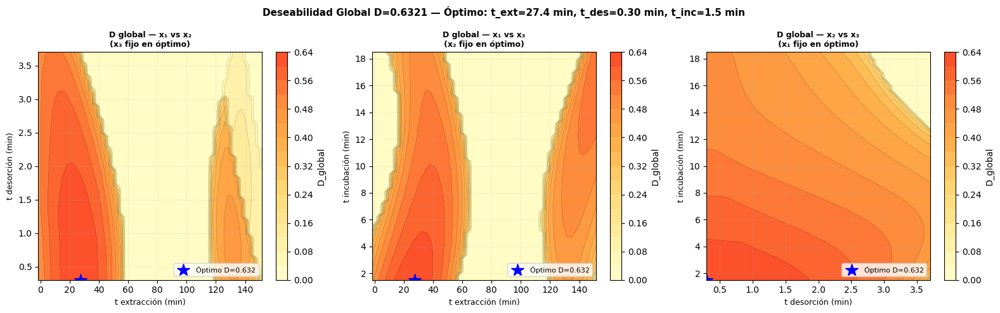

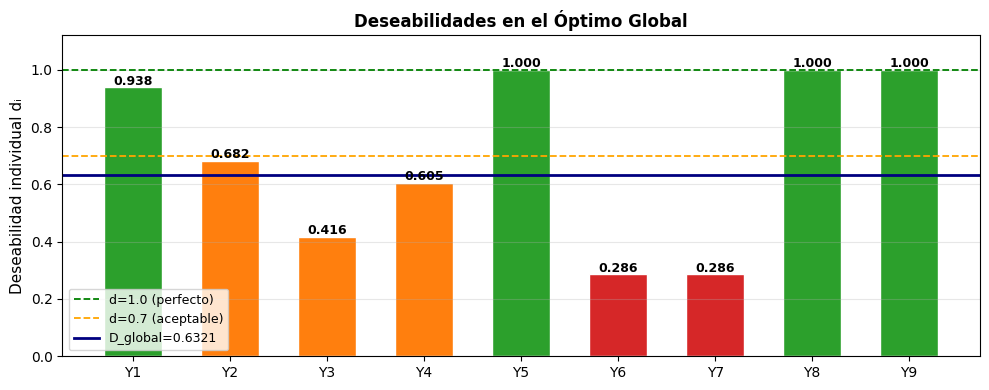

✓ Figuras de optimización guardadas.


In [46]:
# ============================================================
# FASE 7.2 — VISUALIZACIÓN DEL ÓPTIMO GLOBAL
# ============================================================

# ── Contornos de D_global (3 planos) ─────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle(f'Deseabilidad Global D={D_opt:.4f} — '
             f'Óptimo: t_ext={x_real_opt[0]:.1f} min, '
             f't_des={x_real_opt[1]:.2f} min, '
             f't_inc={x_real_opt[2]:.1f} min',
             fontsize=11, fontweight='bold')

COMBOS_DESIR = [
    (0, 1, 2, x_opt[2], 'x₁ vs x₂', 'x₃ fijo en óptimo'),
    (0, 2, 1, x_opt[1], 'x₁ vs x₃', 'x₂ fijo en óptimo'),
    (1, 2, 0, x_opt[0], 'x₂ vs x₃', 'x₁ fijo en óptimo'),
]

for ax, (ia, ib, ic, val_c, title_s, sub_s) in zip(axes, COMBOS_DESIR):
    G1d, G2d = np.meshgrid(GRID, GRID)
    Dg = np.zeros_like(G1d)
    for i in range(G1d.shape[0]):
        for j in range(G1d.shape[1]):
            xv = [0.0, 0.0, 0.0]
            xv[ia] = float(G1d[i, j])
            xv[ib] = float(G2d[i, j])
            xv[ic] = float(val_c)
            Dg[i, j] = -global_desirability(xv)
    Xa = G1d * S[ia] + C[ia]
    Xb = G2d * S[ib] + C[ib]
    cp = ax.contourf(Xa, Xb, Dg, levels=15, cmap='YlOrRd', vmin=0, vmax=1)
    ax.contour(Xa, Xb, Dg, levels=15, colors='k', linewidths=0.3, alpha=0.3)
    fig.colorbar(cp, ax=ax, label='D_global')
    ax.plot(x_opt[ia]*S[ia]+C[ia], x_opt[ib]*S[ib]+C[ib],
            'b*', ms=15, label=f'Óptimo D={D_opt:.3f}')
    ax.set_xlabel(FLABELS[ia], fontsize=9)
    ax.set_ylabel(FLABELS[ib], fontsize=9)
    ax.set_title(f'D global — {title_s}\n({sub_s})', fontsize=9, fontweight='bold')
    ax.legend(fontsize=8, loc='lower right')
    ax.grid(True, alpha=0.15)

fig.tight_layout()
fig.savefig(f'{OUT}/Fase7_Optimo_Global.png', dpi=150, bbox_inches='tight')
ipy_display(fig)
plt.close(fig)

# ── Barras de deseabilidades individuales ─────────────────────
fig2, ax = plt.subplots(figsize=(10, 4))
d_vals_opt = []
for tag in Y_TAGS:
    sp = SPECS[tag]
    yp = predict_y(MODELS[tag], *x_opt)
    d_vals_opt.append(desirability_i(yp, sp['obj'], sp['L'], sp['T'], sp['U'], sp['s']))

colors_d = ['#2ca02c' if d >= 0.7 else '#ff7f0e' if d >= 0.4 else '#d62728'
            for d in d_vals_opt]
bars = ax.bar(Y_TAGS, d_vals_opt, color=colors_d, edgecolor='white', width=0.6)
ax.axhline(1.0,   color='green',  ls='--', lw=1.3, label='d=1.0 (perfecto)')
ax.axhline(0.7,   color='orange', ls='--', lw=1.3, label='d=0.7 (aceptable)')
ax.axhline(D_opt, color='navy',   ls='-',  lw=2.0, label=f'D_global={D_opt:.4f}')
for bar, d in zip(bars, d_vals_opt):
    ax.text(bar.get_x() + bar.get_width()/2, d + 0.01,
            f'{d:.3f}', ha='center', fontsize=9, fontweight='bold')
ax.set_ylim(0, 1.12)
ax.set_ylabel('Deseabilidad individual dᵢ', fontsize=11)
ax.set_title('Deseabilidades en el Óptimo Global', fontsize=12, fontweight='bold')
ax.legend(fontsize=9); ax.grid(axis='y', alpha=0.3)
fig2.tight_layout()
fig2.savefig(f'{OUT}/Fase7_Deseabilidades.png', dpi=150, bbox_inches='tight')
ipy_display(fig2)
plt.close(fig2)
print('✓ Figuras de optimización guardadas.')

=== (a) Sensibilidad a límites L/T/U ===

  [Lím −15%]: t_ext=146.4, t_des=0.459, t_inc=2.7  D=0.0003
  [BASE]: t_ext=27.4, t_des=0.300, t_inc=1.5  D=0.6321
  [Lím +15%]: t_ext=43.8, t_des=0.300, t_inc=1.5  D=0.1358

=== (b) Sensibilidad a pesos (Y1, Y2) ===

  [Pesos Y1↓Y2↓]: t_ext=15.2, t_des=1.262, t_inc=1.5  D=0.5935
  [BASE]: t_ext=27.4, t_des=0.300, t_inc=1.5  D=0.6321
  [Pesos Y1↑Y2↑]: t_ext=33.8, t_des=0.300, t_inc=1.5  D=0.6751
  [Solo Y1 máx]: t_ext=31.4, t_des=0.300, t_inc=1.5  D=0.7125


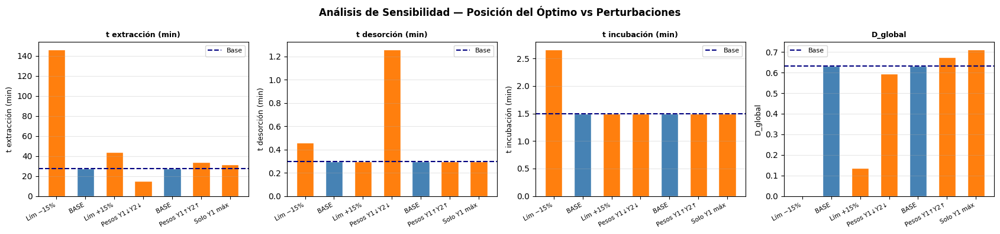


=== CONCLUSIÓN DE ROBUSTEZ ===
  SD(t_ext)=44.90 min  SD(t_des)=0.3584 min  SD(t_inc)=0.44 min
  SD(D_global)=0.28863
  → El óptimo es: SENSIBLE


In [47]:
# ============================================================
# FASE 7.3 — ANÁLISIS DE SENSIBILIDAD DEL ÓPTIMO
# ============================================================
import copy

def run_optim(specs_mod):
    def neg_D(xv):
        return global_desirability(xv, specs=specs_mod)
    res = differential_evolution(neg_D, bounds_opt, seed=42,
                                  maxiter=500, tol=1e-7, polish=True)
    return res.x, -res.fun

sens_rows = []

# (a) Límites ±15%
print('=== (a) Sensibilidad a límites L/T/U ===\n')
for dp, lbl in [(-0.15,'Lím −15%'), (0.0,'BASE'), (0.15,'Lím +15%')]:
    specs_var = {}
    for tag in Y_TAGS:
        sp = copy.deepcopy(SPECS[tag])
        f  = 1 + dp
        if sp['L'] is not None: sp['L'] *= f
        sp['T'] *= f
        if sp['U'] is not None: sp['U'] *= f
        specs_var[tag] = sp
    x_s, D_s = run_optim(specs_var)
    xr_s = decode(x_s)
    print(f'  [{lbl}]: t_ext={xr_s[0]:.1f}, t_des={xr_s[1]:.3f}, t_inc={xr_s[2]:.1f}  D={D_s:.4f}')
    sens_rows.append(dict(Escenario=lbl, t_ext=xr_s[0], t_des=xr_s[1],
                          t_inc=xr_s[2], D_global=D_s))

# (b) Pesos
print('\n=== (b) Sensibilidad a pesos (Y1, Y2) ===\n')
for lbl, overrides in [
    ('Pesos Y1↓Y2↓', {'Y1':0.05,'Y2':0.05}),
    ('BASE',         {'Y1':0.20,'Y2':0.15}),
    ('Pesos Y1↑Y2↑', {'Y1':0.35,'Y2':0.30}),
    ('Solo Y1 máx',  {'Y1':0.60,'Y2':0.05}),
]:
    specs_w = copy.deepcopy(SPECS)
    for tag, new_w in overrides.items():
        specs_w[tag]['w'] = new_w
    x_s, D_s = run_optim(specs_w)
    xr_s = decode(x_s)
    print(f'  [{lbl}]: t_ext={xr_s[0]:.1f}, t_des={xr_s[1]:.3f}, t_inc={xr_s[2]:.1f}  D={D_s:.4f}')
    sens_rows.append(dict(Escenario=lbl, t_ext=xr_s[0], t_des=xr_s[1],
                          t_inc=xr_s[2], D_global=D_s))

df_sens = pd.DataFrame(sens_rows)

# ── Figura de sensibilidad ────────────────────────────────────
fig, axes = plt.subplots(1, 4, figsize=(17, 4))
fig.suptitle('Análisis de Sensibilidad — Posición del Óptimo vs Perturbaciones',
             fontsize=12, fontweight='bold')
escen_lbls = df_sens['Escenario'].tolist()
xi_s = np.arange(len(escen_lbls))

for ax, col, ylabel in zip(axes,
        ['t_ext','t_des','t_inc','D_global'],
        ['t extracción (min)','t desorción (min)','t incubación (min)','D_global']):
    vals  = df_sens[col].values.astype(float)
    clrs  = ['steelblue' if lb == 'BASE' else '#ff7f0e' for lb in escen_lbls]
    ax.bar(xi_s, vals, color=clrs, edgecolor='white', width=0.6)
    base_v = df_sens.loc[df_sens['Escenario'] == 'BASE', col].values
    if len(base_v):
        ax.axhline(base_v[0], color='navy', ls='--', lw=1.5, label='Base')
    ax.set_xticks(xi_s)
    ax.set_xticklabels(escen_lbls, rotation=28, ha='right', fontsize=7.5)
    ax.set_ylabel(ylabel, fontsize=9)
    ax.set_title(ylabel, fontsize=9, fontweight='bold')
    ax.legend(fontsize=8); ax.grid(axis='y', alpha=0.3)

fig.tight_layout()
fig.savefig(f'{OUT}/Fase7_Sensibilidad.png', dpi=150, bbox_inches='tight')
ipy_display(fig)
plt.close(fig)

# ── Conclusión ────────────────────────────────────────────────
ext_std = df_sens['t_ext'].std()
des_std = df_sens['t_des'].std()
inc_std = df_sens['t_inc'].std()
D_std   = df_sens['D_global'].std()
robust  = 'ROBUSTO' if (ext_std < 12 and D_std < 0.06) else 'SENSIBLE'
print(f'\n=== CONCLUSIÓN DE ROBUSTEZ ===')
print(f'  SD(t_ext)={ext_std:.2f} min  SD(t_des)={des_std:.4f} min  SD(t_inc)={inc_std:.2f} min')
print(f'  SD(D_global)={D_std:.5f}')
print(f'  → El óptimo es: {robust}')

In [48]:
# ============================================================
# EXPORTACIÓN FINAL — Excel maestro Fases 5, 6, 7
# ============================================================
excel_path = f'{OUT}/Resultados_RSM_Fases567.xlsx'

with pd.ExcelWriter(excel_path, engine='openpyxl') as writer:

    # Hoja 1: Métricas de validación (Fase 5.4)
    df_val.to_excel(writer, sheet_name='5.4_Validacion')

    # Hoja 2: Coeficientes completos (Fase 5.1)
    coef_rows = []
    for tag in Y_TAGS:
        res = MODELS[tag]
        for tn, c, se, tv, pv in zip(TNAMES, res.params, res.bse,
                                      res.tvalues, res.pvalues):
            sig = '***' if pv<0.001 else '**' if pv<0.01 else '*' if pv<0.05 else ''
            coef_rows.append(dict(Y=tag, Termino=tn, Coef=c,
                                  StdErr=se, t_valor=tv, p_valor=pv, Sig=sig))
    pd.DataFrame(coef_rows).to_excel(writer, sheet_name='5.1_Coeficientes', index=False)

    # Hoja 3: Puntos críticos + Hessianos (Fase 6)
    df_crit_pts.to_excel(writer, sheet_name='6_PuntosCriticos')

    # Hoja 4: Especificaciones deseabilidad (Fase 7.1)
    spec_rows = []
    for tag, sp in SPECS.items():
        spec_rows.append(dict(Y=tag, Objetivo=sp['obj'],
                              L=sp['L'] if sp['L'] is not None else 'N/A',
                              T_target=sp['T'],
                              U=sp['U'] if sp['U'] is not None else 'N/A',
                              Peso=sp['w'], Exp_s=sp['s']))
    pd.DataFrame(spec_rows).to_excel(writer, sheet_name='7.1_Especificaciones', index=False)

    # Hoja 5: Óptimo global (Fase 7.2)
    opt_summary = pd.DataFrame([{
        'x1_opt':x_opt[0], 'x2_opt':x_opt[1], 'x3_opt':x_opt[2],
        't_ext_opt':x_real_opt[0], 't_des_opt':x_real_opt[1],
        't_inc_opt':x_real_opt[2], 'D_global':D_opt
    }])
    opt_summary.to_excel(writer, sheet_name='7.2_Optimo', index=False)
    df_optim.to_excel(writer, sheet_name='7.2_Deseabilidades')

    # Hoja 6: Análisis de sensibilidad (Fase 7.3)
    df_sens.to_excel(writer, sheet_name='7.3_Sensibilidad', index=False)

print(f'Excel maestro guardado: {excel_path}')
import glob
pngs = sorted(glob.glob(f'{OUT}/*.png'))
print(f'Total figuras PNG generadas: {len(pngs)}')
for p in pngs:
    print(f'  {os.path.basename(p)}')

Excel maestro guardado: RSM_Resultados/Resultados_RSM_Fases567.xlsx
Total figuras PNG generadas: 27
  Comparacion_RSM.png
  Desirabilidad_por_Experimento.png
  Fase6_Hessianos.png
  Fase7_Deseabilidades.png
  Fase7_Optimo_Global.png
  Fase7_Sensibilidad.png
  PredVsObs_Todas.png
  Y1_Pareto.png
  Y1_Superficies.png
  Y2_Pareto.png
  Y2_Superficies.png
  Y3_Pareto.png
  Y3_Superficies.png
  Y4_Pareto.png
  Y4_Superficies.png
  Y5_Indol_Interaccion.png
  Y5_Indol_Superficies.png
  Y5_Pareto.png
  Y5_Superficies.png
  Y6_Pareto.png
  Y6_Superficies.png
  Y7_Pareto.png
  Y7_Superficies.png
  Y8_Pareto.png
  Y8_Superficies.png
  Y9_Pareto.png
  Y9_Superficies.png


---
## Corrección Problema — Deseabilidad por Experimento con límites L/U ampliados

**Problema original:** usar L = mínimo observado hace que cualquier experimento en ese mínimo obtenga d_i = 0,
lo que colapsa D_global a 0 por el efecto de la media geométrica ponderada.

**Solución aplicada:** L = media − 2·σ (para maximizar) y U = media + 2·σ (para minimizar).
Esto traslada el "suelo cero" fuera del rango experimental real, de modo que
ningún experimento observado recibe automáticamente d_i = 0.

In [49]:
# ============================================================
# CORRECCIÓN P2 — SPECS con L = media − 2σ  /  U = media + 2σ
# ============================================================
# Se mantienen los mismos objetivos y pesos que en SPECS original.
# Solo cambia cómo se fijan los límites aceptables L y U.

SPECS_C = {}
for tag, col in zip(Y_TAGS, Y_COLS):
    y   = df_y[col].values.astype(float)
    mu  = y.mean()
    sig = y.std(ddof=1)
    sp  = SPECS[tag]          # hereda obj, w, s
    if sp['obj'] == 'max':
        L_c = mu - 2 * sig    # suelo = 2σ bajo la media
        T_c = sp['T']         # target = máximo observado (sin cambio)
        U_c = None
    else:                     # 'min'
        L_c = None
        T_c = sp['T']         # target = mínimo observado (sin cambio)
        U_c = mu + 2 * sig    # techo = 2σ sobre la media
    SPECS_C[tag] = dict(obj=sp['obj'], L=L_c, T=T_c, U=U_c,
                        w=sp['w'], s=sp['s'])

# Tabla comparativa: L original vs L corregido
print('=== Comparación de límites: original vs corregido ===\n')
print(f"{'Y':<5} {'obj':<5} {'L_orig':>12} {'L_corr':>12} {'T':>12} {'U_orig':>12} {'U_corr':>12}")
print('─' * 72)
for tag in Y_TAGS:
    so = SPECS[tag];   sc = SPECS_C[tag]
    Lo = f"{so['L']:.5f}" if so['L'] is not None else 'N/A'
    Lc = f"{sc['L']:.5f}" if sc['L'] is not None else 'N/A'
    Uo = f"{so['U']:.5f}" if so['U'] is not None else 'N/A'
    Uc = f"{sc['U']:.5f}" if sc['U'] is not None else 'N/A'
    T  = f"{sc['T']:.5f}"
    print(f"{tag:<5} {so['obj']:<5} {Lo:>12} {Lc:>12} {T:>12} {Uo:>12} {Uc:>12}")

=== Comparación de límites: original vs corregido ===

Y     obj         L_orig       L_corr            T       U_orig       U_corr
────────────────────────────────────────────────────────────────────────
Y1    max        2.82843      3.29185      4.00000          N/A          N/A
Y2    max        7.87401      8.96252     10.53565          N/A          N/A
Y3    min            N/A          N/A 6631015.62781 29610291.27132 30830190.61963
Y4    min            N/A          N/A     33.03897     33.46340     33.33272
Y5    max        0.17321      0.17789      0.20101          N/A          N/A
Y6    max       -4.70953     -4.92798     -4.12713          N/A          N/A
Y7    max       -4.70953     -4.92798     -4.12713          N/A          N/A
Y8    max        0.25400      0.26850      0.30571          N/A          N/A
Y9    max        0.35921      0.35985      0.38925          N/A          N/A


In [50]:
# ============================================================
# DESEABILIDAD POR EXPERIMENTO — valores observados + SPECS_C
# ============================================================

rows_c = []
for i in range(N):
    row = {'Exp': i+1,
           't_ext': t_ext_a[i], 't_des': t_des_a[i], 't_inc': t_inc_a[i]}
    d_list = []
    for tag, col in zip(Y_TAGS, Y_COLS):
        y_val = df_y[col].values.astype(float)[i]
        sp    = SPECS_C[tag]
        d_i   = desirability_i(y_val, sp['obj'], sp['L'], sp['T'], sp['U'], sp['s'])
        row[f'd_{tag}'] = round(d_i, 4)
        d_list.append((d_i, sp['w']))

    sum_w = sum(w for _, w in d_list)
    log_D = sum(w * np.log(max(d, 1e-12)) for d, w in d_list) / sum_w
    row['D_global'] = round(np.exp(log_D), 4)
    rows_c.append(row)

df_dc = pd.DataFrame(rows_c)
print('=== Deseabilidad por experimento (límites corregidos) ===\n')
print(df_dc.to_string(index=False))

best_i = df_dc['D_global'].idxmax()
worst_i = df_dc['D_global'].idxmin()
print(f'\nMejor  experimento: Exp {df_dc.loc[best_i,  "Exp"]}  '
      f't_ext={df_dc.loc[best_i,"t_ext"]:.0f} min  '
      f't_des={df_dc.loc[best_i,"t_des"]:.1f} min  '
      f't_inc={df_dc.loc[best_i,"t_inc"]:.1f} min  '
      f'D={df_dc.loc[best_i,"D_global"]:.4f}')
print(f'Peor   experimento: Exp {df_dc.loc[worst_i, "Exp"]}  '
      f'D={df_dc.loc[worst_i,"D_global"]:.4f}')

=== Deseabilidad por experimento (límites corregidos) ===

 Exp  t_ext  t_des  t_inc   d_Y1   d_Y2   d_Y3   d_Y4   d_Y5   d_Y6   d_Y7   d_Y8   d_Y9  D_global
   1   30.0    1.0    5.0 0.8206 0.6276 0.3776 0.4732 1.0000 0.4156 0.4156 0.8872 1.0000    0.6293
   2   30.0    1.0   15.0 0.8206 0.7228 0.3926 0.6086 0.8712 0.3784 0.3784 0.7672 0.8039    0.6246
   3   30.0    3.0    5.0 1.0000 0.9394 1.0000 0.5631 0.5915 0.2955 0.2955 0.9243 0.7919    0.6670
   4   30.0    3.0   15.0 0.4430 0.6595 0.4072 0.6446 0.0000 0.4031 0.4031 0.3855 0.0241    0.0073
   5  120.0    1.0    5.0 1.0000 0.9698 0.9910 0.6238 0.5538 0.2841 0.2841 0.8872 0.7325    0.6606
   6  120.0    1.0   15.0 1.0000 1.0000 0.3788 0.5019 0.5165 0.2728 0.2728 0.8506 0.6740    0.5754
   7  120.0    3.0    5.0 0.6352 0.9089 0.3826 0.6273 0.6298 0.3070 0.3070 0.0986 0.0066    0.3985
   8  120.0    3.0   15.0 1.0000 0.9089 0.3609 0.5814 0.6298 0.3070 0.3070 0.9619 0.8521    0.6151
   9    0.6    2.0   10.5 0.0000 0.0000 0.0504 0.0

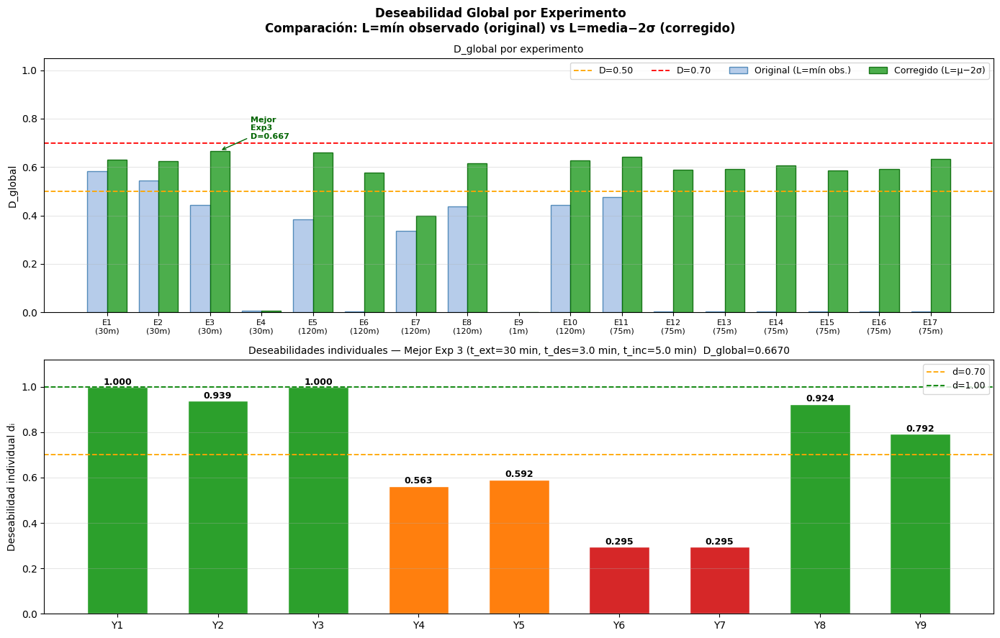

Figura guardada: RSM_Resultados/Desirabilidad_por_Experimento.png


In [51]:
# ============================================================
# FIGURA — Deseabilidad por experimento (original vs corregida)
# ============================================================

# Recalcular D original para comparar
rows_orig = []
for i in range(N):
    d_list = []
    for tag, col in zip(Y_TAGS, Y_COLS):
        y_val = df_y[col].values.astype(float)[i]
        sp    = SPECS[tag]
        d_i   = desirability_i(y_val, sp['obj'], sp['L'], sp['T'], sp['U'], sp['s'])
        d_list.append((d_i, sp['w']))
    sum_w = sum(w for _, w in d_list)
    log_D = sum(w * np.log(max(d, 1e-12)) for d, w in d_list) / sum_w
    rows_orig.append(np.exp(log_D))

D_orig = np.array(rows_orig)
D_corr = df_dc['D_global'].values
exps   = df_dc['Exp'].values
xi     = np.arange(N)

fig, axes = plt.subplots(2, 1, figsize=(14, 9))
fig.suptitle('Deseabilidad Global por Experimento\n'
             'Comparación: L=mín observado (original) vs L=media−2σ (corregido)',
             fontsize=12, fontweight='bold')

# ── Panel superior: comparación barras ───────────────────────
ax = axes[0]
w_bar = 0.38
ax.bar(xi - w_bar/2, D_orig, w_bar, label='Original (L=mín obs.)',
       color='#aec7e8', edgecolor='steelblue', alpha=0.9)
ax.bar(xi + w_bar/2, D_corr, w_bar, label='Corregido (L=μ−2σ)',
       color='#2ca02c',   edgecolor='darkgreen', alpha=0.85)
ax.axhline(0.50, color='orange', ls='--', lw=1.3, label='D=0.50')
ax.axhline(0.70, color='red',    ls='--', lw=1.3, label='D=0.70')
ax.set_xticks(xi)
ax.set_xticklabels([f'E{e}\n({t:.0f}m)' for e, t in zip(exps, df_dc['t_ext'])],
                   fontsize=8)
ax.set_ylabel('D_global', fontsize=10)
ax.set_ylim(0, 1.05)
ax.set_title('D_global por experimento', fontsize=10)
ax.legend(fontsize=9, ncol=4)
ax.grid(axis='y', alpha=0.3)

# Anotar el mejor experimento corregido
best_i_c = int(D_corr.argmax())
ax.annotate(f'Mejor\nExp{exps[best_i_c]}\nD={D_corr[best_i_c]:.3f}',
            xy=(best_i_c + w_bar/2, D_corr[best_i_c]),
            xytext=(best_i_c + w_bar/2 + 0.6, D_corr[best_i_c] + 0.05),
            arrowprops=dict(arrowstyle='->', color='darkgreen'),
            fontsize=8, color='darkgreen', fontweight='bold')

# ── Panel inferior: deseabilidades individuales del mejor exp ─
ax2 = axes[1]
best_row = df_dc.iloc[best_i_c]
d_cols   = [f'd_{t}' for t in Y_TAGS]
d_vals   = [best_row[c] for c in d_cols]
colors_d = ['#2ca02c' if d >= 0.7 else '#ff7f0e' if d >= 0.4 else '#d62728'
            for d in d_vals]
bars2 = ax2.bar(Y_TAGS, d_vals, color=colors_d, edgecolor='white', width=0.6)
ax2.axhline(0.70, color='orange', ls='--', lw=1.3, label='d=0.70')
ax2.axhline(1.00, color='green',  ls='--', lw=1.3, label='d=1.00')
for bar, d in zip(bars2, d_vals):
    ax2.text(bar.get_x() + bar.get_width()/2, d + 0.01,
             f'{d:.3f}', ha='center', fontsize=9, fontweight='bold')
ax2.set_ylim(0, 1.12)
ax2.set_ylabel('Deseabilidad individual dᵢ', fontsize=10)
ax2.set_title(f'Deseabilidades individuales — Mejor Exp {int(best_row["Exp"])} '
              f'(t_ext={best_row["t_ext"]:.0f} min, '
              f't_des={best_row["t_des"]:.1f} min, '
              f't_inc={best_row["t_inc"]:.1f} min)  '
              f'D_global={best_row["D_global"]:.4f}',
              fontsize=10)
ax2.legend(fontsize=9)
ax2.grid(axis='y', alpha=0.3)

fig.tight_layout()
fig.savefig(f'{OUT}/Desirabilidad_por_Experimento.png', dpi=150, bbox_inches='tight')
ipy_display(fig)
plt.close(fig)
print(f'Figura guardada: {OUT}/Desirabilidad_por_Experimento.png')